In [16]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch import optim
import math
import numpy as np
import matplotlib.pyplot as plt
import random
import os
from os import listdir
from os.path import isfile, join
from torch.utils.data import DataLoader
from torchvision.transforms import ToTensor
import time
from scipy.interpolate import LSQUnivariateSpline

In [17]:
random.seed(42)
torch.manual_seed(42)

In [ ]:
#Uses same model as in Stocks Transformer 1

In [18]:
class Embedding(nn.Module):
    def __init__(self, input_size, embed_dim): 
        super(Embedding, self).__init__()
        
        self.embed_dim = embed_dim
        self.input_size = input_size
        
    def forward(self, x):
        batch_size = x.size(0) 
        C = torch.randn((batch_size, self.input_size, self.embed_dim)) 
        for i in range(len(x)):
            for j in range(len(x[i])):
                C[i][j]*=x[i][j]
        return C 

In [19]:
class PositionalEmbedding(nn.Module):
    def __init__(self, max_seq_len, embed_model_dim):
        super(PositionalEmbedding, self).__init__()
        
        self.embed_dim = embed_model_dim
        
        pe = torch.zeros(max_seq_len, self.embed_dim) 
        
        for pos in range(max_seq_len):
            for i in range(0, self.embed_dim, 2):
                pe[pos, i] = math.sin(pos / (10000 ** ((2*i)/self.embed_dim)))
                pe[pos, i+1] = math.cos(pos / (10000 ** ((2 * (i + 1))/self.embed_dim)))
        
        pe = pe.unsqueeze(0) 
        self.register_buffer('pe', pe) 
        
    def forward(self, x):
        x *= math.sqrt(self.embed_dim) 
        seq_len = x.size(1)
        x += torch.autograd.Variable(self.pe[:,:seq_len], requires_grad=False) 
        return x

In [20]:
class MultiHeadAttention(nn.Module):
    def __init__(self, embed_dim=512, n_heads=8):
        super(MultiHeadAttention, self).__init__()
        
        self.embed_dim = embed_dim
        
        self.n_heads = n_heads
        self.single_head_dim = int(self.embed_dim / self.n_heads) 
        
        self.query_matrix = nn.Linear(self.single_head_dim , self.single_head_dim ,bias=False) 
        self.key_matrix = nn.Linear(self.single_head_dim  , self.single_head_dim, bias=False) 
        self.value_matrix = nn.Linear(self.single_head_dim ,self.single_head_dim , bias=False) 
        
        self.out = nn.Linear(self.n_heads*self.single_head_dim ,self.embed_dim) 
        
    def forward(self, key, query, value, mask=None):
        batch_size = key.size(0)
        seq_length = key.size(1)
        seq_length_query = query.size(1)
        
        key = key.view(batch_size, seq_length, self.n_heads, self.single_head_dim) 
        query = query.view(batch_size, seq_length_query, self.n_heads, self.single_head_dim)
        value = value.view(batch_size, seq_length, self.n_heads, self.single_head_dim)

        k = self.key_matrix(key).transpose(1, 2) 
        q = self.query_matrix(query).transpose(1, 2)   
        v = self.value_matrix(value).transpose(1, 2) 

        k_adjusted = k.transpose(-1, -2) 

        product = torch.matmul(q, k_adjusted)

        if mask is not None:
            product = product.masked_fill(mask == 0, float("-1e20")) 

        product = product / math.sqrt(self.single_head_dim) 

        scores = F.softmax(product, dim=-1)
        scores = torch.matmul(scores, v) 
        concat = scores.transpose(1,2).contiguous().view(batch_size, seq_length_query, self.single_head_dim*self.n_heads) 

        output = self.out(concat)

        return output


In [21]:
class TransformerBlock(nn.Module):
    def __init__(self, embed_dim, dropout_value, expansion_factor = 4, n_heads = 8):
        super(TransformerBlock, self).__init__()
        
        self.attention = MultiHeadAttention(embed_dim, n_heads)
        
        self.norm1 = nn.LayerNorm(embed_dim)
        self.norm2 = nn.LayerNorm(embed_dim)
        
        self.feed_forward = nn.Sequential(
                        nn.Linear(embed_dim, expansion_factor * embed_dim),
                        nn.ReLU(),
                        nn.Linear(expansion_factor * embed_dim, embed_dim)
        )
        
        self.dropout1 = nn.Dropout(dropout_value)
        self.dropout2 = nn.Dropout(dropout_value)
    
    def forward(self, key, query, value):
        attention_out = self.attention(key, query, value)
        attention_residual_out = attention_out + query
        norm1_out = self.dropout1(self.norm1(attention_out)) 
        
        feed_fwd_out = self.feed_forward(norm1_out)
        feed_fwd_residual_out = feed_fwd_out + norm1_out
        norm2_out = self.dropout2(self.norm2(feed_fwd_residual_out))
        
        return norm2_out

In [22]:
class TransformerEncoder(nn.Module):
    def __init__(self, seq_len, input_size, embed_dim, num_layers=2, expansion_factor=4, n_heads=8): 
        super(TransformerEncoder, self).__init__()
        
        self.embedding_layer = Embedding(input_size, embed_dim) 
        self.positional_encoder = PositionalEmbedding(seq_len, embed_dim)
        
        self.layers = nn.ModuleList([TransformerBlock(embed_dim, dropout_value, expansion_factor, n_heads) for i in range(num_layers)])
        
    def forward(self, x):
        embed_out = self.embedding_layer(x)
        out = self.positional_encoder(embed_out)
        for layer in self.layers:
            out = layer(out, out, out)

        return out

In [23]:
class DecoderBlock(nn.Module):
    def __init__(self, embed_dim, dropout_value, expansion_factor=4, n_heads=8):
        super(DecoderBlock, self).__init__()
        
        self.attention = MultiHeadAttention(embed_dim, n_heads=8)
        self.norm = nn.LayerNorm(embed_dim)
        self.dropout = nn.Dropout(dropout_value)
        self.transformer_block = TransformerBlock(embed_dim, dropout_value, expansion_factor, n_heads)
        
    def forward(self, key, x, value, mask):
        attention = self.attention(x, x, x, mask=mask)
        x = self.dropout(self.norm(attention + x))
        out = self.transformer_block(key, x, value)
        
        return out

In [24]:
class TransformerDecoder(nn.Module):
    def __init__(self, decoder_input_size, embed_dim, seq_len, target_output_size, dropout_value, num_layers=2, expansion_factor=4, n_heads=8): ###batch size after target output
        super(TransformerDecoder, self).__init__()
        
        self.embedding = Embedding(decoder_input_size, embed_dim) 
        self.position_embedding = PositionalEmbedding(seq_len, embed_dim)
        self.fst_attention = DecoderBlock(embed_dim, dropout_value, expansion_factor=4, n_heads=8)
        self.layers = nn.ModuleList(
            [
                DecoderBlock(embed_dim, dropout_value, expansion_factor=4, n_heads=8) 
                for _ in range(num_layers)
            ]

        )
        self.fc1_out = nn.Linear(embed_dim, target_output_size)
        self.fc2_out = nn.Linear(decoder_input_size, target_output_size)
        self.dropout = nn.Dropout(dropout_value)
        
    def forward(self, x, enc_out, mask):
        x = self.embedding(x) 
        x = self.position_embedding(x)
        x = self.dropout(x)
        
        for layer in self.layers:
            x = layer(enc_out, x, enc_out, mask=None)
        
        out = self.fc1_out(x)
        out = torch.squeeze(out)
        out = self.fc2_out(out)
        out = torch.squeeze(out)
        return out

In [25]:
class Transformer(nn.Module):
    def __init__(self, embed_dim, input_size, decoder_input_size, target_output_size, seq_length,num_layers=2, dropout_value=0.2, expansion_factor=4, n_heads=8): ###batch_size, after target output
        super(Transformer, self).__init__()
        
        self.decoder_input_size = decoder_input_size
        
        self.encoder = TransformerEncoder(seq_length, input_size, embed_dim, num_layers=num_layers, expansion_factor=expansion_factor, n_heads=n_heads) ###batch_size=batch_size, after embed dim
        self.decoder = TransformerDecoder(decoder_input_size, embed_dim, seq_length, target_output_size, dropout_value, num_layers=num_layers, expansion_factor=expansion_factor, n_heads=n_heads) ###batch_size=batch_size, after target output
        
    def make_trg_mask(self, trg):
        batch_size, trg_len = trg.shape
        trg_mask = torch.tril(torch.ones((trg_len, trg_len))).expand(batch_size, 1, trg_len, trg_len) 
        return trg_mask
    
    def decode(self, src, trg):
        trg_mask = self.make_trg_mask(trg)
        enc_out = self.encoder(src)
        out_labels = []
        batch_size, seq_len = src.shape[0], src.shape[1]
        
        out = trg
        for i in range(seq_len):
            out = self.decoder(out, enc_out, trg_mask)
            
            out = out[:, -1, :]
            
            out = out.argmax(-1)
            out_labels.append(out.item())
            out = torch.unsqueeze(out, axis=0)
            
        return out_labels
    
    def forward(self, src, trg):
        trg_mask = self.make_trg_mask(trg)
        enc_out = self.encoder(src) 
        
        outputs = self.decoder(trg, enc_out, trg_mask) 
        return outputs

In [26]:
input_size = 10
decoder_input_size = 9
target_output_size = 1
num_layers = 6
seq_length = 10 
batch_size = 16
dropout_value = 0.2
num_training_stocks = 5


model = Transformer(embed_dim=32, input_size=input_size, 
                    decoder_input_size=decoder_input_size, target_output_size=target_output_size, seq_length=seq_length,
                    num_layers=num_layers, dropout_value=dropout_value, expansion_factor=4, n_heads=8) 

current_path = os.path.join(r'C:\Users', 'barne', 'Diss', 'Stocks', 'Code', 'Network 1')

criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)

In [27]:
class CustomDataset():
    def __init__(self, inputs, labels, transform=None, target_transform=None):
        self.labels = labels
        self.inputs = inputs
        self.transform = transform
        self.target_transform = target_transform

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        inpt = self.inputs[idx]
        label = self.labels[idx]
        if self.transform:
            inpt = self.transform(inpt)
        if self.target_transform:
            label = self.target_transform(label)
        return inpt, label

In [28]:
#create validation and test sets for each type of smoothing
mypath = os.path.join(current_path, "Network1", 'Stocks')
stocks = [f for f in listdir(mypath) if isfile(join(mypath, f))]

Xtr_mov, Ytr_mov = {}, {}
Xtr_exp, Ytr_exp = {}, {}
Xtr_spline, Ytr_spline = {}, {}
Xval_mov, Yval_mov = {}, {}
Xval_exp, Yval_exp = {}, {}
Xval_spline, Yval_spline = {}, {}
Xte, Yte = [], []

block_size = input_size


def build_dataset(prices):
    X, Y = [], []
    if len(prices)<block_size+1:
        return [], []
    for i in range(len(prices)-block_size):
        X.append(prices[i:i+block_size])
        Y.append(prices[i+block_size])
    X = torch.tensor(X)
    Y = torch.tensor(Y)
    return X, Y

all_train_prices = [0]
all_smooth_prices = [0]
for stock in stocks[1:num_training_stocks+1]:
    data = open(os.path.join(mypath, stock)).read().splitlines()[1:]


    year_lookup = {}
    for day in data:
        lst = day.split(',')
        year = int(lst[0][:4])
        closing = float(lst[4])
        if year not in year_lookup.keys():
            year_lookup[year] = [closing]
        else:
            year_lookup[year].append(closing)
    
    #build dataset
    prices = []
    train_prices = []
    validation_prices = []
    test_prices = []
    mean = 0
    std = 0
    years = list(year_lookup.keys())
    if stock == stocks[num_training_stocks]:
        for year in years:
            test_prices += year_lookup[year]
            prices += year_lookup[year]
    else:
        training_cut_off = years[math.ceil(0.75*len(years))-1]
        for year in range(years[0], training_cut_off):
            train_prices+=year_lookup[year]
            prices += year_lookup[year]

        for year in range(training_cut_off, years[-1]):
            validation_prices+=year_lookup[year]
            prices += year_lookup[year]
    
    #moving average
    for smooth_const in [5, 10, 15, 20]:
        if smooth_const not in Xtr_mov.keys():
            Xtr_mov[smooth_const] = []
            Ytr_mov[smooth_const] = []
            Xval_mov[smooth_const] = []
            Yval_mov[smooth_const] = []
        smooth_prices = [price for price in train_prices[:smooth_const-1]]
        for i in range(smooth_const, len(train_prices)+1):
            smooth_prices.append(sum(train_prices[i-smooth_const:i])/smooth_const)
        Xtr_mov[smooth_const] += build_dataset(smooth_prices)[0]
        Ytr_mov[smooth_const] += build_dataset(smooth_prices)[1]
        
        smooth_prices = [price for price in validation_prices[:smooth_const-1]]
        for i in range(smooth_const, len(validation_prices)+1):
            smooth_prices.append(sum(validation_prices[i-smooth_const:i])/smooth_const)

        Xval_mov[smooth_const] += build_dataset(smooth_prices)[0]
        Yval_mov[smooth_const] += build_dataset(smooth_prices)[1]

    #exponential moving average
    for smooth_const in [0.1, 0.2, 0.25]:
        if smooth_const not in Xtr_exp.keys():
            Xtr_exp[smooth_const] = []
            Ytr_exp[smooth_const] = []
            Xval_exp[smooth_const] = []
            Yval_exp[smooth_const] = []
        if len(train_prices) > 0:
            smooth_prices = [train_prices[0]]
            for i in range(1, len(train_prices)):
                smooth_prices.append(smooth_const*train_prices[i]+(1-smooth_const)*smooth_prices[i-1])

            Xtr_exp[smooth_const] += build_dataset(smooth_prices)[0]
            Ytr_exp[smooth_const] += build_dataset(smooth_prices)[1]

        if len(validation_prices) > 0:
            smooth_prices = [validation_prices[0]]
            for i in range(1, len(validation_prices)):
                smooth_prices.append(smooth_const*validation_prices[i]+(1-smooth_const)*smooth_prices[i-1])
            Xval_exp[smooth_const] += build_dataset(smooth_prices)[0]
            Yval_exp[smooth_const] += build_dataset(smooth_prices)[1]    
    
    #spline smoothing
    for num_datapoints in [5,10,15, 20]:
        if num_datapoints not in Xtr_spline.keys():
            Xtr_spline[num_datapoints] = []
            Ytr_spline[num_datapoints] = []
            Xval_spline[num_datapoints] = []
            Yval_spline[num_datapoints] = []
        if len(train_prices) > 1:
            num_knots = max(0, math.floor(len(train_prices)/num_datapoints-1))
            time = np.arange(len(train_prices))

            knot_indices = np.linspace(num_datapoints, len(time) - 1-num_datapoints, num_knots).astype(int)
            knots = time[knot_indices]

            cs = LSQUnivariateSpline(time, train_prices, k=3, t=knots)
            smooth_prices = cs(time)

            Xtr_spline[num_datapoints] += build_dataset(smooth_prices)[0]
            Ytr_spline[num_datapoints] += build_dataset(smooth_prices)[1]

        if len(validation_prices) > 1:
            num_knots = max(0, math.floor(len(validation_prices)/num_datapoints-1))
            time = np.arange(len(validation_prices))

            knot_indices = np.linspace(num_datapoints, len(time) - 1-num_datapoints, num_knots).astype(int)
            knots = time[knot_indices]

            cs = LSQUnivariateSpline(time, validation_prices, k=3, t=knots)
            val_smooth_prices = cs(time)

            Xval_spline[num_datapoints] += build_dataset(val_smooth_prices)[0]
            Yval_spline[num_datapoints] += build_dataset(val_smooth_prices)[1]
            
    Xte, Yte = build_dataset(test_prices)
    
    all_train_prices.extend(train_prices)
    all_smooth_prices.extend(smooth_prices)



C:\Users\barne\AppData\Local\Temp\ipykernel_16732\1780876931.py:23: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\torch\csrc\utils\tensor_new.cpp:264.)
  X = torch.tensor(X)


In [29]:
test_data = CustomDataset(Xte, Yte)

In [ ]:
#Find the best checkpoints from each model - this is equivalent to early stopping
#then test the different models on a test dataset of 20 stocks

In [40]:
#moving average checkpoint finder
best_checkpoints = {}

for key in [5,20]:
    val_data = CustomDataset(Xval_mov[key], Yval_mov[key])
    losses = {}
    scores = {}
    for c in range(1, 151):
        print(c)
        with torch.no_grad():
            model.eval()
            checkpoint = 10*c
            state_dict = torch.load(os.path.join(current_path, "smoothCheckpoints", "smooth" + str(key), 'checkpoint' + str(checkpoint) + '.pth'))
            model.load_state_dict(state_dict)
            inpt = [x for x in val_data[0][0]]
            out = [x for x in val_data[0][0]]
            for i in range(len(val_data)):
                x = val_data[i][0]
                y = val_data[i][1]
                x = x.unsqueeze(0)
                trg = x[:, 1:]
                optimizer.zero_grad()
                output = model(x, trg)
                out.append(output)
                inpt.append(val_data[i][1])



        total_loss = 0.0
        for i in range(len(inpt)-10):
            total_loss += (inpt[i+10]-out[i+10])**2
        losses[checkpoint] = total_loss/(len(inpt)-10)

        prod1 = 1
        for i in range(1, len(inpt)):
            sign = 1
            if out[i]-out[i-1] < 0:
                sign = -1
            prod1 *= (1 + ((inpt[i]-inpt[i-1])/inpt[i-1]*sign))
        scores[checkpoint] = prod1
    
    sorted_losses = dict(sorted(losses.items(), key=lambda item: item[1]))
    sorted_scores = dict(sorted(scores.items(), key=lambda item: item[1]), reverse=True)
    
    good_checkpoints = []
    threshold = min(losses.values()) + 2
    
    for check in losses.keys():
        if losses[check] < threshold:
            good_checkpoints.append(check)
    
    for check in sorted_scores.keys():
        if check in good_checkpoints:
            best_checkpoints[key] = check
            break
    
    print("done", key)

print(best_checkpoints)

1


FileNotFoundError: [Errno 2] No such file or directory: 'C:\\Users\\barne\\Diss\\Stocks\\Code\\Network 1\\smoothCheckpoints\\smooth5\\checkpoint10.pth'

5 610 tensor(18.8844) tensor(0.6373)


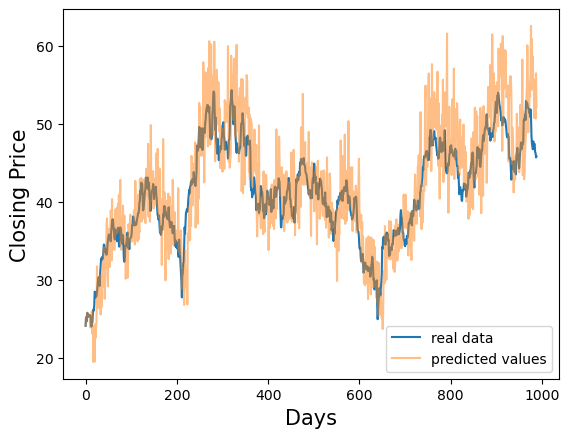

10 770 tensor(17.5440) tensor(0.9179)


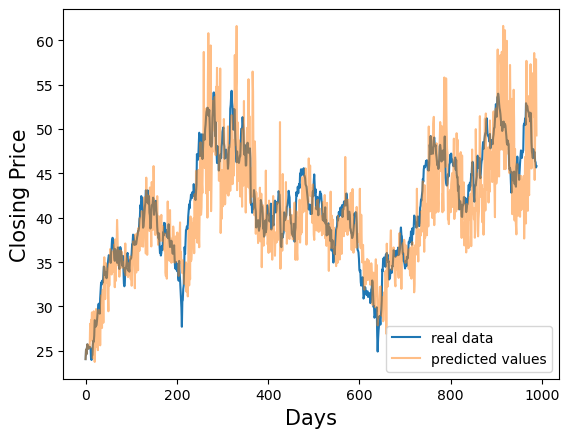

KeyboardInterrupt: 

In [30]:
#moving average test for 1 stock
best_checkpoints = {5:610, 10:770, 20:480}
for key in [5,10,20]:#best_checkpoints.keys():
    with torch.no_grad():
        model.eval()
        checkpoint = best_checkpoints[key]
        state_dict = torch.load(os.path.join(current_path, "20-4-24", "old", "smoothCheckpoints", "smooth" + str(key), 'checkpoint' + str(checkpoint) + '.pth'))
        model.load_state_dict(state_dict)
        inpt = [x for x in test_data[0][0]]
        out = [x for x in test_data[0][0]]
        for i in range(len(test_data)):
            sum1 = 0
            x = []
            for j in range(9):
                x.append(np.mean(inpt[j-10-key+1:j-9]))
            x.append(np.mean(inpt[-key:]))
            x = torch.tensor(x)
            y = test_data[i][1]
            x = x.unsqueeze(0)
            trg = x[:, 1:]
            optimizer.zero_grad()
            output = model(x, trg)
            out.append(output)
            inpt.append(test_data[i][1])

    total_loss = 0.0
    for i in range(len(inpt)-10):
        total_loss += (inpt[i+10]-out[i+10])**2
    mse = total_loss/(len(inpt)-10)

    prod1 = 1
    for i in range(1, len(inpt)):
        sign = 1
        if out[i]-out[i-1] < 0:
            sign = -1
        prod1 *= (1 + ((inpt[i]-inpt[i-1])/inpt[i-1]*sign))
    score = prod1
    
    print(key, checkpoint, mse, score)
    
    plt.plot(inpt, label='real data')
    plt.plot(out, alpha=0.5, label='predicted values')
    plt.xlabel('Days', fontsize=15)
    plt.ylabel('Closing Price', fontsize=15)
    plt.legend()
    plt.show()

In [92]:
#exp moving average checkpoint finder
exp_best_checkpoints = {}

for key in [0.25]:
    val_data = CustomDataset(Xval_exp[key], Yval_exp[key])
    losses = {}
    scores = {}
    for c in range(1, 5):
        print(c)
        with torch.no_grad():
            model.eval()
            checkpoint = 10*c
            state_dict = torch.load(os.path.join(current_path, "Network1", "27-3-24", "expCheckpoints", "exp" + str(1), 'checkpoint' + str(checkpoint) + '.pth'))
            model.load_state_dict(state_dict)
            inpt = [x for x in val_data[0][0]]
            out = [x for x in val_data[0][0]]
            for i in range(len(val_data)):
                x = val_data[i][0]
                y = val_data[i][1]
                x = x.unsqueeze(0)
                trg = x[:, 1:]
                optimizer.zero_grad()
                output = model(x, trg)
                out.append(output)
                inpt.append(val_data[i][1])



        total_loss = 0.0
        for i in range(len(inpt)-10):
            total_loss += (inpt[i+10]-out[i+10])**2
        losses[checkpoint] = total_loss/(len(inpt)-10)

        prod1 = 0
        for i in range(1, len(inpt)):
            sign = 1
            if out[i]-out[i-1] < 0:
                sign = -1
            prod1 *= (1 + (inpt[i]-inpt[i-1])/inpt[i-1]*sign)
        scores[checkpoint] = prod1
    
    sorted_losses = dict(sorted(losses.items(), key=lambda item: item[1]))
    sorted_scores = dict(sorted(scores.items(), key=lambda item: item[1]), reverse=True)
    
    good_checkpoints = []
    threshold = min(losses.values()) + 2
    
    for check in losses.keys():
        if losses[check] < threshold:
            good_checkpoints.append(check)
    
    for check in sorted_scores.keys():
        if check in good_checkpoints:
            exp_best_checkpoints[key] = check
            break
    
    print("done", key)

print(exp_best_checkpoints)

1
2
3
4
done 0.25
{0.25: 40}


0.1 530 tensor(16.5287) -0.4248661406523868


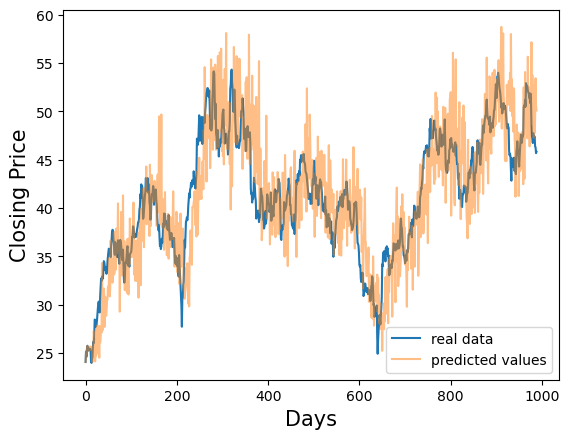

0.15 680 tensor(15.2345) -0.49967437857770114


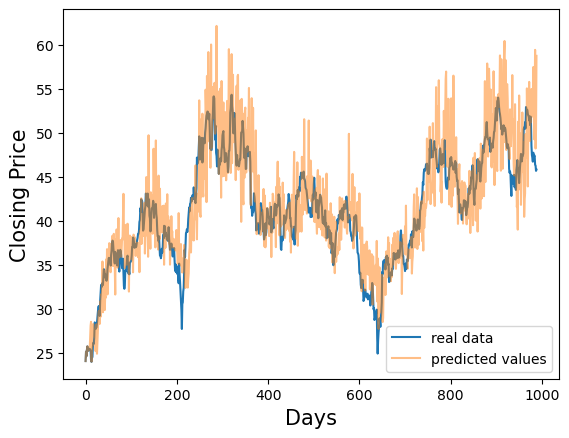

0.25 900 tensor(16.7951) 0.48627315795549664


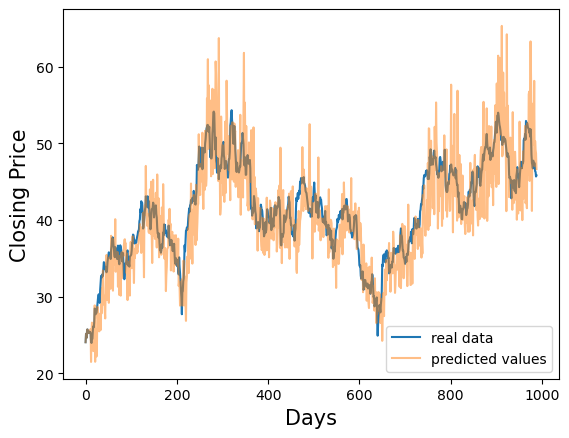

In [99]:
#exp moving average test for 1 stock
best_checkpoints = {0.1:530,0.15:680,0.25:900}
for key in [0.1,0.15,0.25]:#exp_best_checkpoints.keys():
    with torch.no_grad():
        model.eval()
        checkpoint = best_checkpoints[key]
        state_dict = torch.load(os.path.join(current_path, "20-4-24", "old", "expCheckpoints", "exp" + str(int(key*20)), 'checkpoint' + str(checkpoint) + '.pth'))
        model.load_state_dict(state_dict)
        exp = [test_data[0][0][0]]
        inpt = [x for x in test_data[0][0]]
        out = [x for x in test_data[0][0]]
        for i in range(1, len(test_data[0][0])):
            exp.append(key*inpt[i]+(1-key)*exp[i-1])
        for i in range(len(test_data)):
            x = torch.tensor(exp[-10:])
            y = test_data[i][1]
            x = x.unsqueeze(0)
            trg = x[:, 1:]
            optimizer.zero_grad()
            output = model(x, trg)
            out.append(output)
            inpt.append(test_data[i][1])
            exp.append(key*inpt[-1]+(1-key)*exp[-1])

    total_loss = 0.0
    for i in range(len(inpt)-10):
        total_loss += (inpt[i+10]-out[i+10])**2
    mse = total_loss/(len(inpt)-10)

    prod1 = 1
    for i in range(1, len(inpt)):
        sign = 1
        if out[i]-out[i-1] < 0:
            sign = -1
        prod1 *= (1 + ((inpt[i]-inpt[i-1])/inpt[i-1]*sign))
    score = prod1
    
    print(key, checkpoint, mse, score)
    
    plt.plot(inpt, label='real data')
    plt.plot(out, alpha=0.5, label='predicted values')
    plt.xlabel('Days', fontsize=15)
    plt.ylabel('Closing Price', fontsize=15)
    plt.legend()
    plt.show()

In [90]:
#spline moving average checkpoint finder
spline_best_checkpoints = {}

for key in [5,10,20]:
    val_data = CustomDataset(Xval_spline[key], Yval_spline[key])
    losses = {}
    scores = {}
    for c in range(1, 151):
        print(c)
        with torch.no_grad():
            model.eval()
            checkpoint = 10*c
            state_dict = torch.load(os.path.join(current_path, "Network1", "27-3-24", "splineCheckpoints", "spline" + str(key), 'checkpoint' + str(checkpoint) + '.pth'))
            model.load_state_dict(state_dict)
            inpt = [x for x in val_data[0][0]]
            out = [x for x in val_data[0][0]]
            for i in range(len(val_data)):
                num_datapoints = key
                num_knots = max(0, math.floor(len(inpt)/num_datapoints-1))
                time = np.arange(len(inpt))

                knot_indices = np.linspace(num_datapoints, len(time) - 1-num_datapoints, num_knots).astype(int)
                knots = time[knot_indices]

                cs = LSQUnivariateSpline(time, inpt, k=3, t=knots)
                spline_smooth_prices = cs(time)

                x = torch.tensor(spline_smooth_prices[-10:])
                y = val_data[i][1]
                x = x.unsqueeze(0)
                trg = x[:, 1:]
                optimizer.zero_grad()
                output = model(x, trg)
                out.append(output)
                inpt.append(val_data[i][1])



        total_loss = 0.0
        for i in range(len(inpt)-10):
            total_loss += (inpt[i+10]-out[i+10])**2
        losses[checkpoint] = total_loss/(len(inpt)-10)

        prod1 = 1
        for i in range(1, len(inpt)):
            sign = 1
            if out[i]-out[i-1] < 0:
                sign = -1
            prod1 *= (1 + ((inpt[i]-inpt[i-1])/inpt[i-1]*sign))
        scores[checkpoint] = prod1
    
    sorted_losses = dict(sorted(losses.items(), key=lambda item: item[1]))
    sorted_scores = dict(sorted(scores.items(), key=lambda item: item[1]), reverse=True)
    
    good_checkpoints = []
    threshold = min(losses.values()) + 2
    
    for check in losses.keys():
        if losses[check] < threshold:
            good_checkpoints.append(check)
    
    for check in sorted_scores.keys():
        if check in good_checkpoints:
            spline_best_checkpoints[key] = check
            break
    
    print("done", key, spline_best_checkpoints[key])

print(spline_best_checkpoints)

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
done 5 380
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
done 

KeyboardInterrupt: 

5 510 tensor(81.5952) -0.6870865269402145


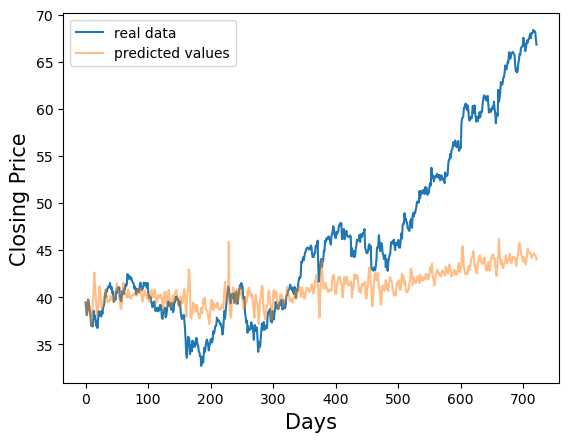

10 490 tensor(358.8588) -0.37506954288982686


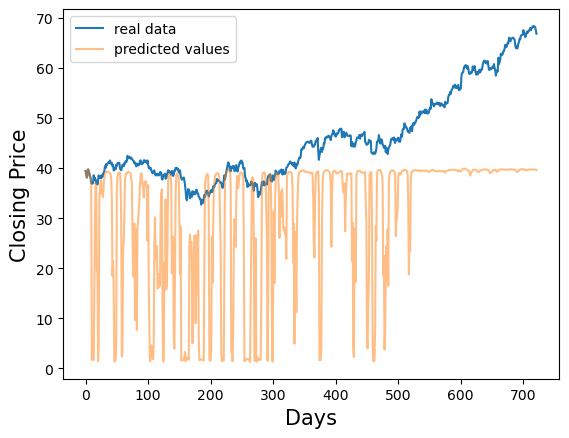

20 1120 tensor(65.8042) -0.3752564974734276


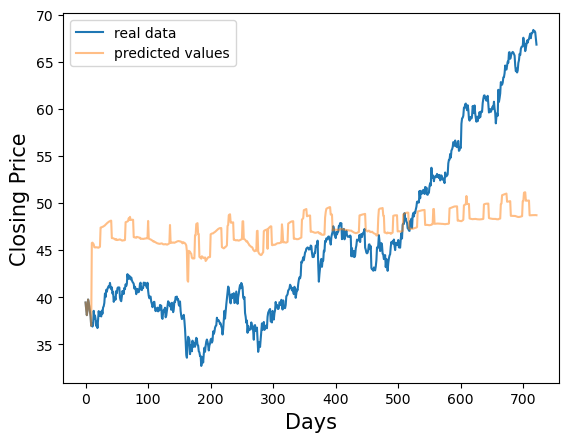

In [139]:
#spline smoothing test for 1 stock
spline_best_checkpoints = {5:510,10:490,20:1120}
for key in spline_best_checkpoints.keys():
    with torch.no_grad():
        model.eval()
        checkpoint = spline_best_checkpoints[key]
        state_dict = torch.load(os.path.join(current_path, "20-4-24", "old", "splineCheckpoints", "spline" + str(key), 'checkpoint' + str(checkpoint) + '.pth'))
        model.load_state_dict(state_dict)
        exp = [test_data[0][0][0]]
        inpt = [x for x in test_data[0][0]]
        out = [x for x in test_data[0][0]]
        for i in range(len(test_data)):
            num_datapoints = key
            num_knots = max(0, math.floor(len(inpt)/num_datapoints-1))
            time = np.arange(len(inpt))

            knot_indices = np.linspace(num_datapoints, len(time) - 1-num_datapoints, num_knots).astype(int)
            knots = time[knot_indices]

            cs = LSQUnivariateSpline(time, inpt, k=3, t=knots)
            spline_smooth_prices = cs(time)

            x = torch.tensor(spline_smooth_prices[-10:])
            y = test_data[i][1]
            x = x.unsqueeze(0)
            trg = x[:, 1:]
            optimizer.zero_grad()
            output = model(x, trg)
            out.append(output)
            inpt.append(test_data[i][1])
            exp.append(key*inpt[-1]+(1-key)*exp[-1])

    total_loss = 0.0
    for i in range(len(inpt)-10):
        total_loss += (inpt[i+10]-out[i+10])**2
    mse = total_loss/(len(inpt)-10)

    prod1 = 1
    for i in range(1, len(inpt)):
        sign = 1
        if out[i]-out[i-1] < 0:
            sign = -1
        prod1 *= (1 + ((inpt[i]-inpt[i-1])/inpt[i-1]*sign))
    score = prod1
    
    print(key, checkpoint, mse, score)
    
    plt.plot(inpt, label='real data')
    plt.plot(out, alpha=0.5, label='predicted values')
    plt.xlabel('Days', fontsize=15)
    plt.ylabel('Closing Price', fontsize=15)
    plt.legend()
    plt.show()

In [32]:
#choose 20 stocks with low volatility
mypath = os.path.join(current_path, "Network1", 'Stocks')
stocks = [f for f in listdir(mypath) if isfile(join(mypath, f))]
good_stocks = []
for stock in stocks:
    data = open(os.path.join(mypath, stock)).read().splitlines()[1:]
    year_lookup = {}
    prices = []
    
    for day in data:
        lst = day.split(',')
        year = int(lst[0][:4])
        closing = float(lst[4])
        if year not in year_lookup.keys():
            year_lookup[year] = [closing]
        else:
            year_lookup[year].append(closing)

    years = list(year_lookup.keys())
    for year in years[-5:]:
        prices+=year_lookup[year]
    
    if len(prices) < 1000:
        continue
    
    max1 = max(prices)
    min1 = min(prices)
    
    grads = []
    for i in range(10, len(prices)):
        grads.append(abs(prices[i] - prices[i-10])/prices[i])
    
    maxgrad = max(grads)
        
    if maxgrad<0.17 and max1<100 and min1>20:
        good_stocks.append(stock)

print(len(good_stocks))

20


In [33]:
#create a list of test datasets for the 20 stocks
test_datas = []
for stock in good_stocks:
    test_prices = []
    data = open(os.path.join(mypath, stock)).read().splitlines()[1:]
    print(stock)

    year_lookup = {}
    for day in data:
        lst = day.split(',')
        year = int(lst[0][:4])
        closing = float(lst[4])
        if year not in year_lookup.keys():
            year_lookup[year] = [closing]
        else:
            year_lookup[year].append(closing)
    
    years = list(year_lookup.keys())
    for year in years[-3:]:
        test_prices += year_lookup[year]
        #prices += year_lookup[year]
    Xte, Yte = build_dataset(test_prices)
    test_datas.append(CustomDataset(Xte, Yte))

a.us.txt
aat.us.txt
abr_a.us.txt
acc.us.txt
adc.us.txt
aee.us.txt
aep.us.txt
afl.us.txt
agii.us.txt
ago_b.us.txt
ahl_c.us.txt
aig.us.txt
ait.us.txt
aiv.us.txt
ajg.us.txt
ale.us.txt
all.us.txt
all_a.us.txt
all_b.us.txt
all_c.us.txt


5 610 tensor(15.3433) tensor(0.8524)


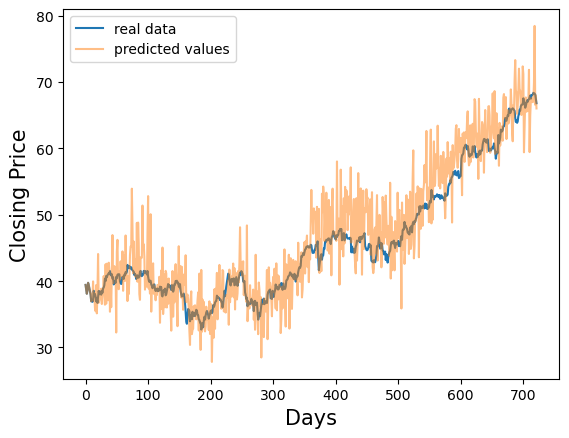

5 610 tensor(11.1930) tensor(0.8748)


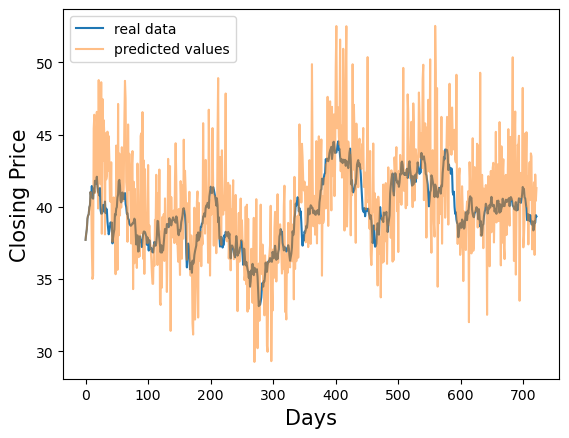

5 610 tensor(4.2169) tensor(0.9872)


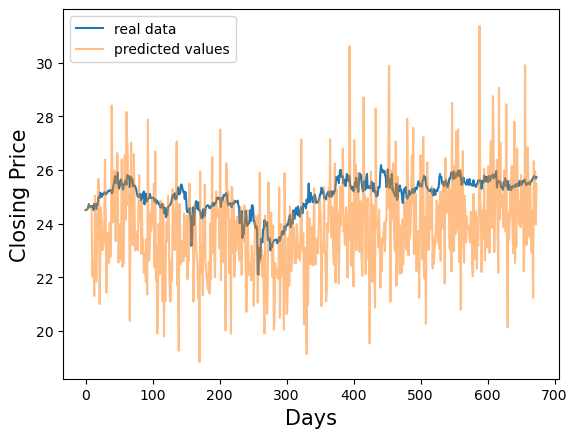

5 610 tensor(17.8409) tensor(0.6024)


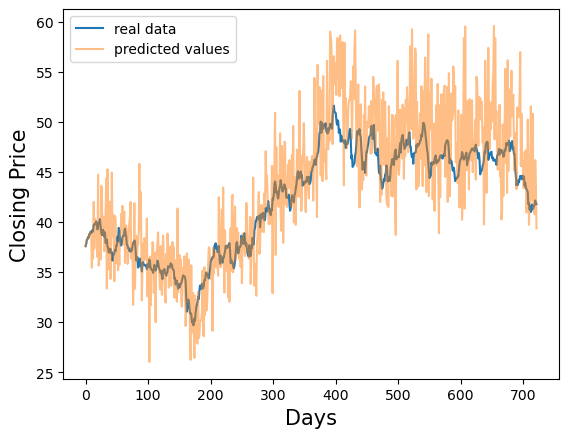

5 610 tensor(14.8162) tensor(0.8022)


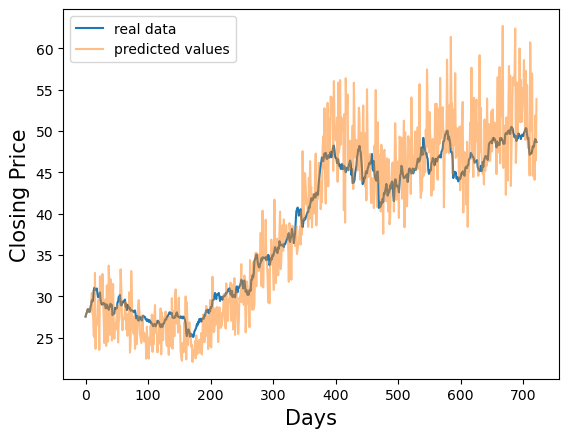

5 610 tensor(19.4421) tensor(0.9434)


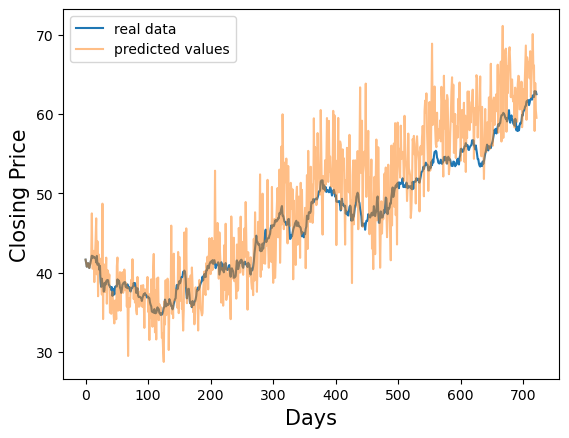

5 610 tensor(22.3117) tensor(1.2549)


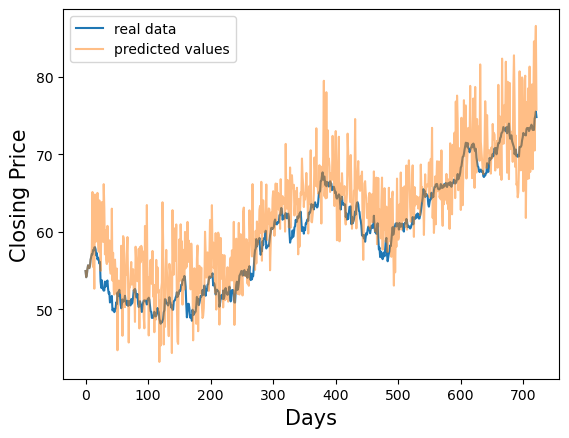

5 610 tensor(23.2424) tensor(1.2526)


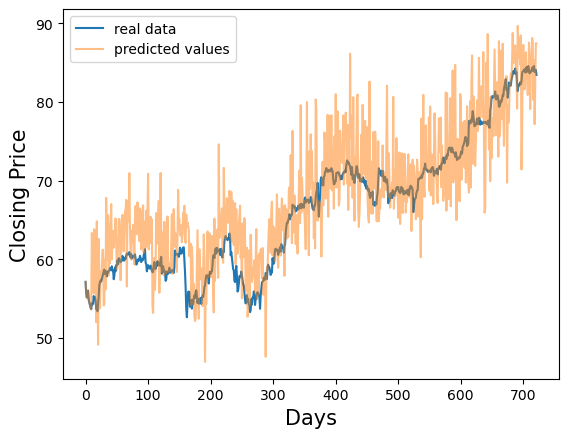

5 610 tensor(23.5717) tensor(0.8787)


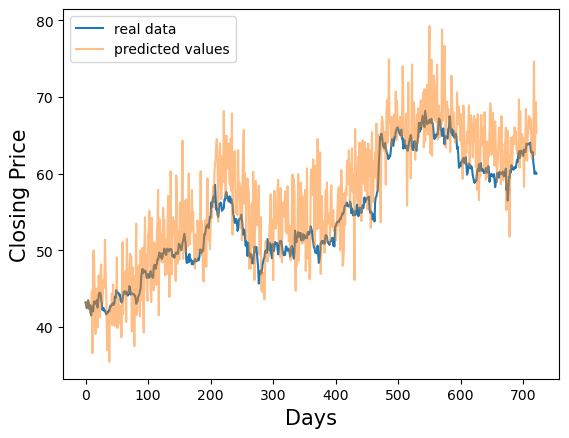

5 610 tensor(5.1502) tensor(1.0197)


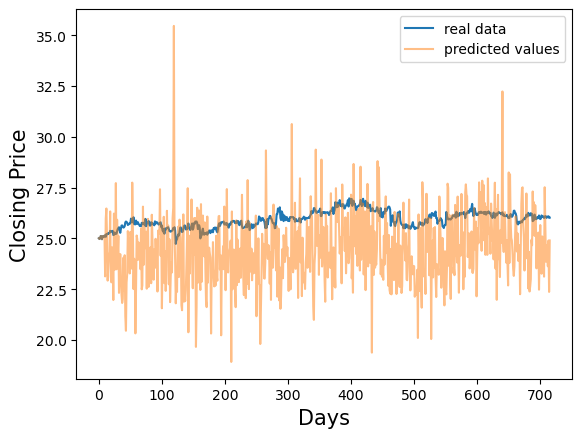

5 610 tensor(5.8351) tensor(1.2982)


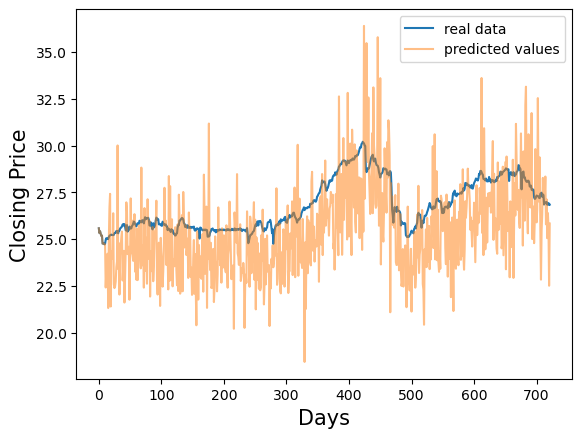

5 610 tensor(24.9309) tensor(0.8301)


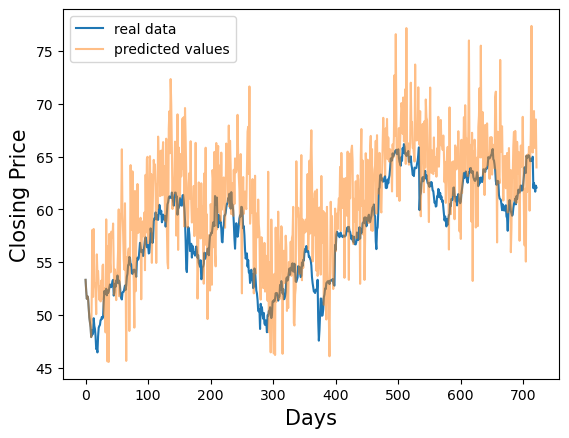

5 610 tensor(17.6043) tensor(1.3278)


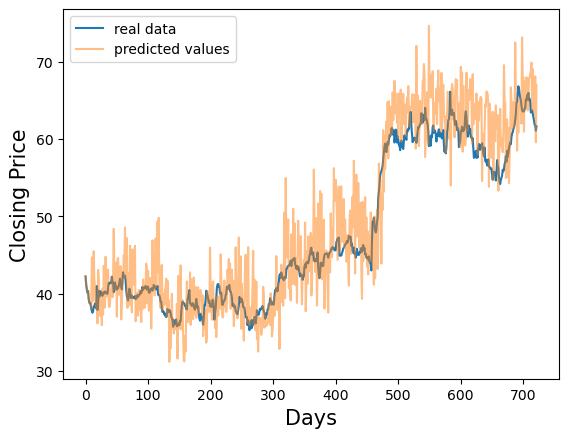

5 610 tensor(12.4109) tensor(0.7148)


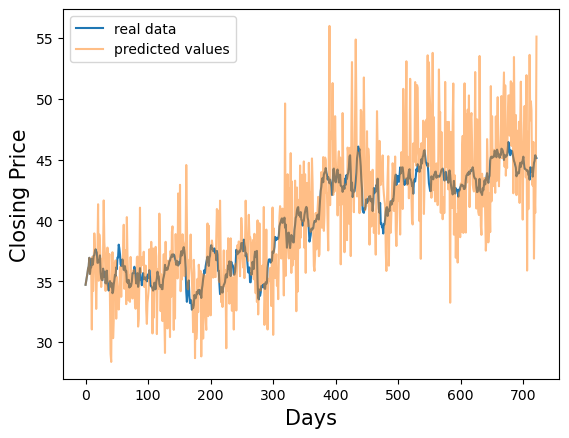

5 610 tensor(19.7856) tensor(0.6838)


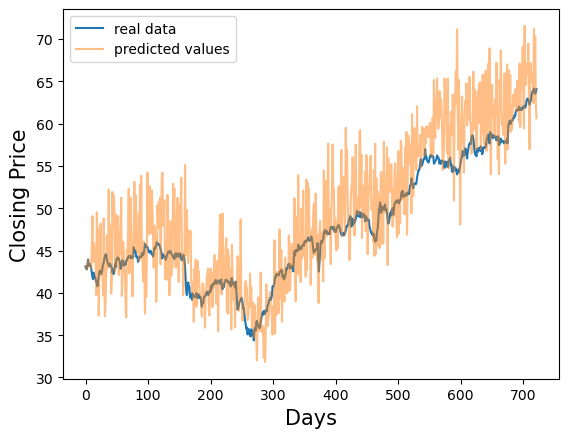

5 610 tensor(21.7442) tensor(1.3527)


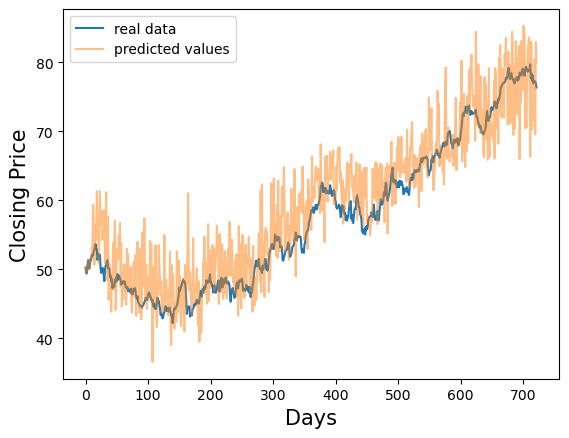

5 610 tensor(22.8084) tensor(0.6884)


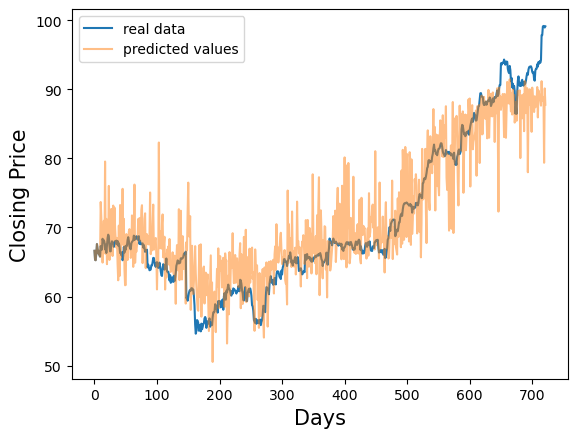

5 610 tensor(4.8201) tensor(0.8599)


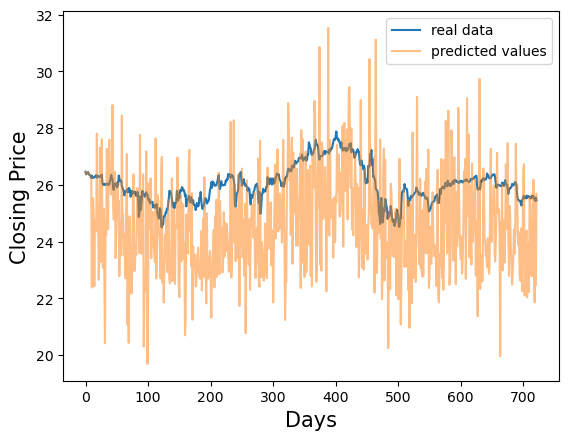

5 610 tensor(5.3620) tensor(1.1639)


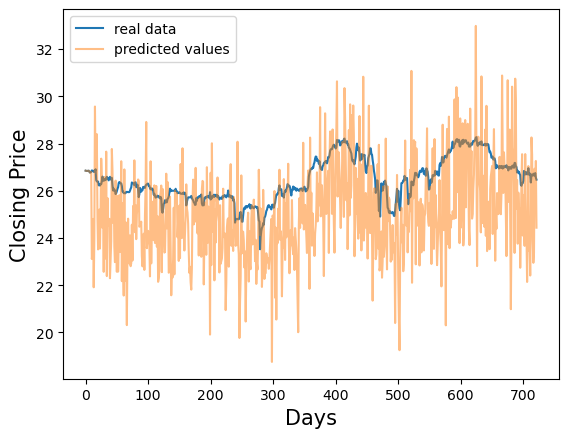

5 610 tensor(5.7678) tensor(0.9187)


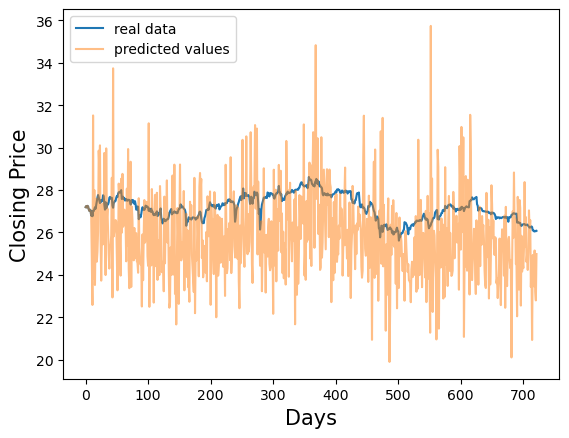

[tensor(0.8524), tensor(0.8748), tensor(0.9872), tensor(0.6024), tensor(0.8022), tensor(0.9434), tensor(1.2549), tensor(1.2526), tensor(0.8787), tensor(1.0197), tensor(1.2982), tensor(0.8301), tensor(1.3278), tensor(0.7148), tensor(0.6838), tensor(1.3527), tensor(0.6884), tensor(0.8599), tensor(1.1639), tensor(0.9187)] 0.965335 [tensor(15.3433), tensor(11.1930), tensor(4.2169), tensor(17.8409), tensor(14.8162), tensor(19.4421), tensor(22.3117), tensor(23.2424), tensor(23.5717), tensor(5.1502), tensor(5.8351), tensor(24.9309), tensor(17.6043), tensor(12.4109), tensor(19.7856), tensor(21.7442), tensor(22.8084), tensor(4.8201), tensor(5.3620), tensor(5.7678)] 14.909882
10 770 tensor(15.3223) tensor(1.0545)


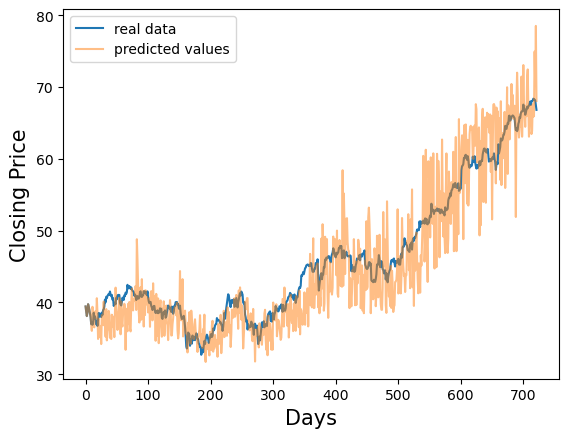

10 770 tensor(7.5981) tensor(1.6290)


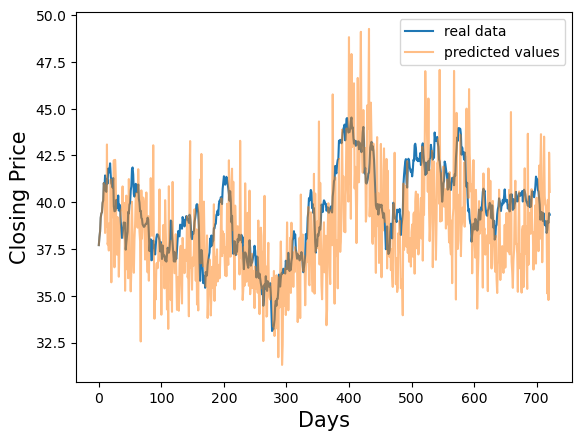

10 770 tensor(6.2902) tensor(0.7582)


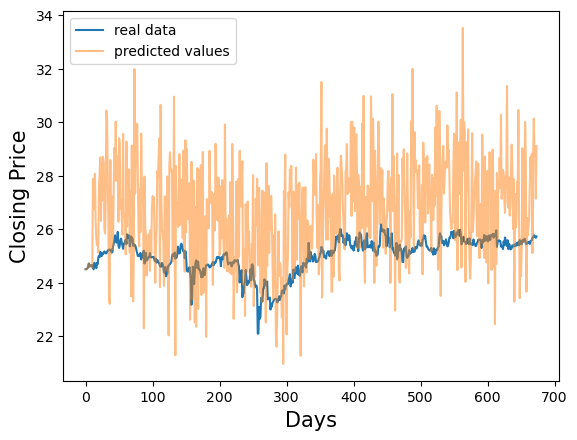

10 770 tensor(14.4013) tensor(1.0381)


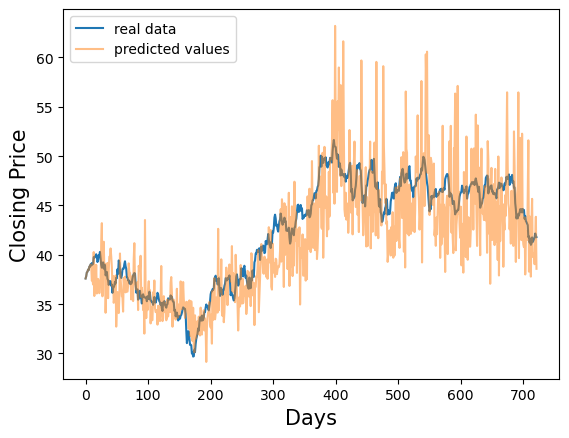

10 770 tensor(12.9302) tensor(0.7213)


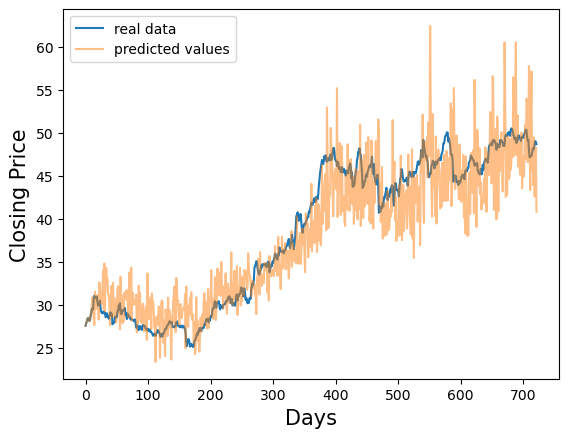

10 770 tensor(18.6147) tensor(0.8218)


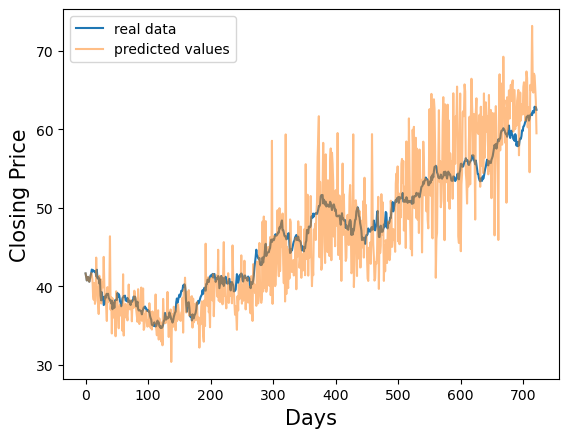

10 770 tensor(23.6083) tensor(0.8787)


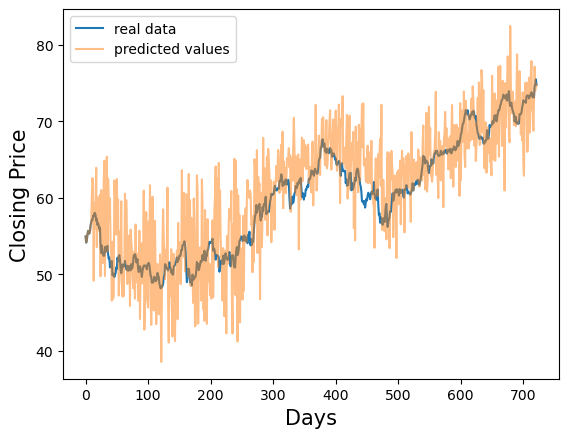

10 770 tensor(21.6042) tensor(1.5173)


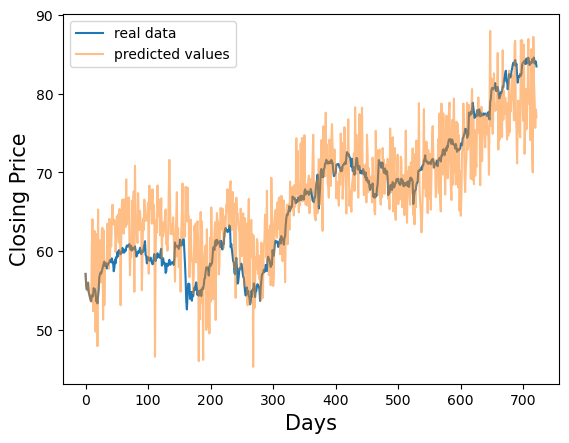

10 770 tensor(24.7038) tensor(1.4356)


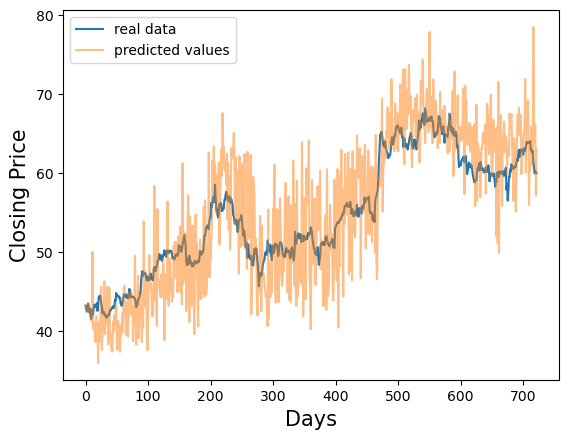

10 770 tensor(5.8699) tensor(0.9347)


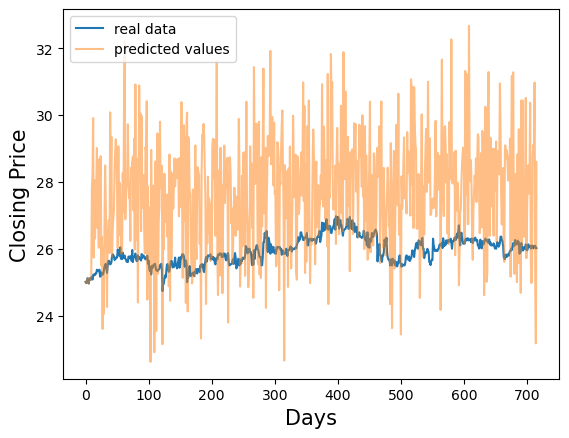

10 770 tensor(6.2161) tensor(0.9609)


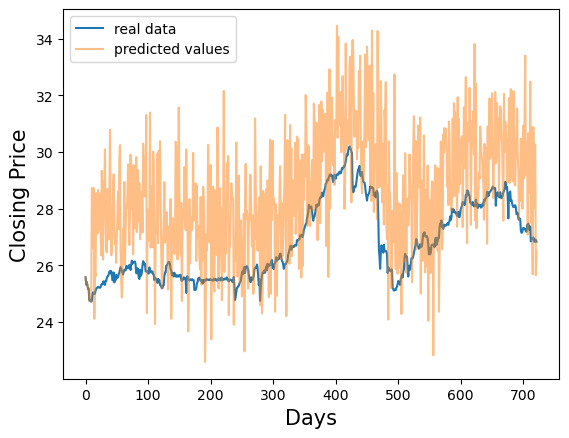

10 770 tensor(25.4664) tensor(1.5720)


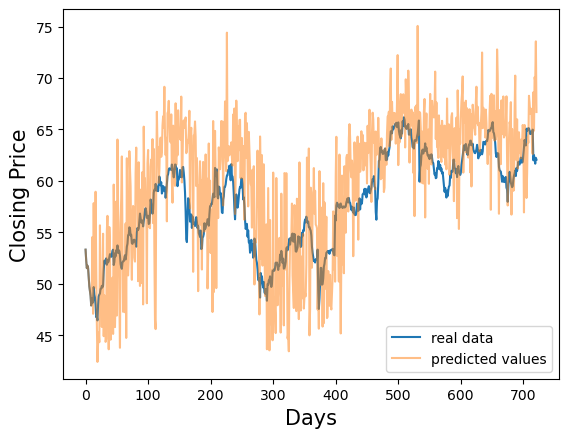

10 770 tensor(16.0002) tensor(1.4833)


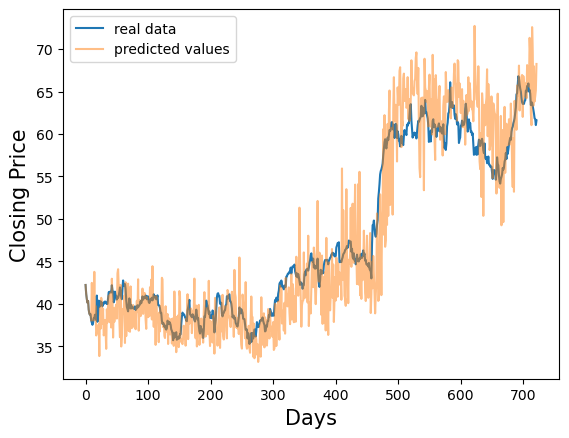

10 770 tensor(8.9192) tensor(0.5515)


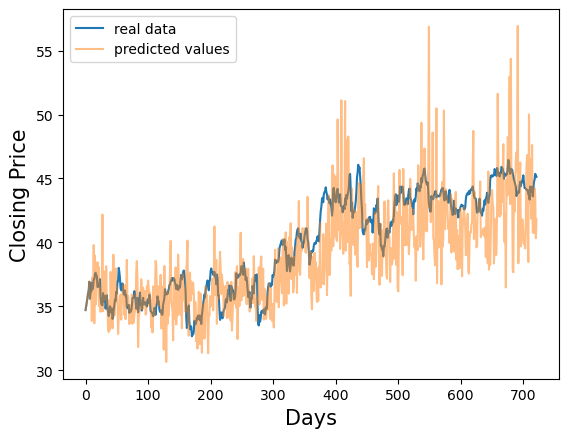

10 770 tensor(19.2253) tensor(1.0651)


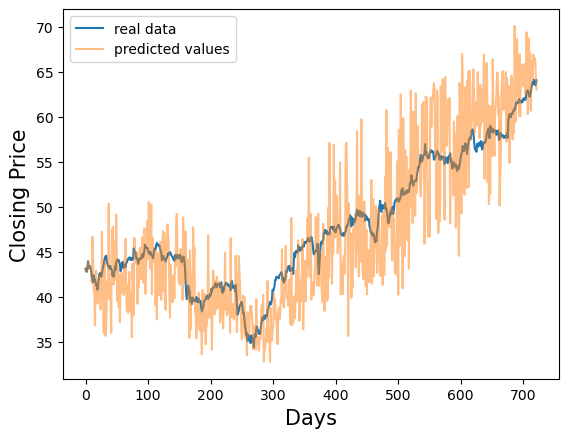

10 770 tensor(22.1956) tensor(1.0281)


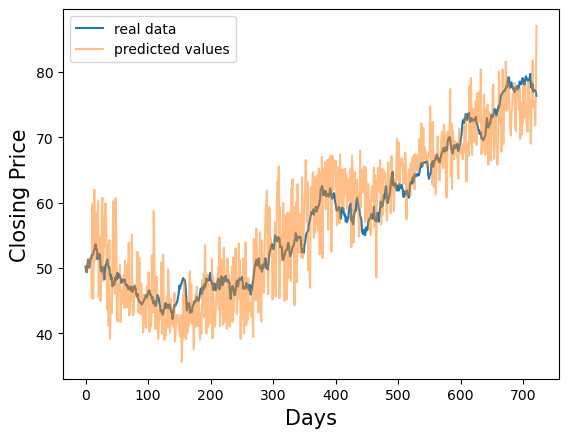

10 770 tensor(28.6969) tensor(0.7726)


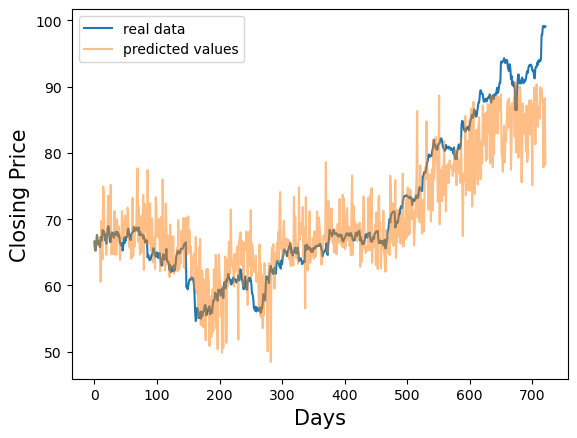

10 770 tensor(6.0033) tensor(1.0053)


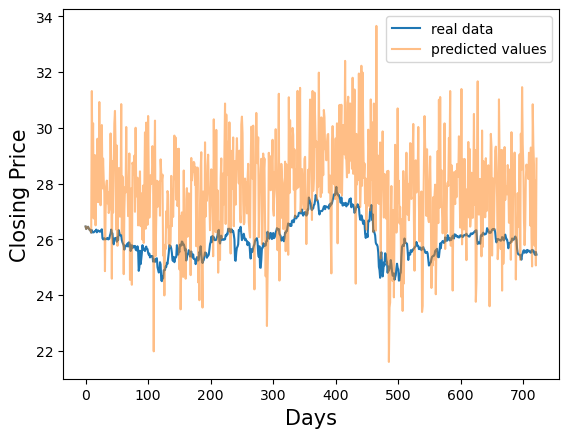

10 770 tensor(5.8853) tensor(0.9183)


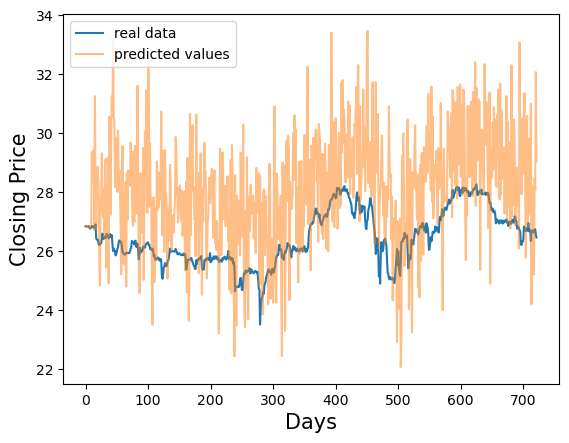

10 770 tensor(5.7353) tensor(0.9929)


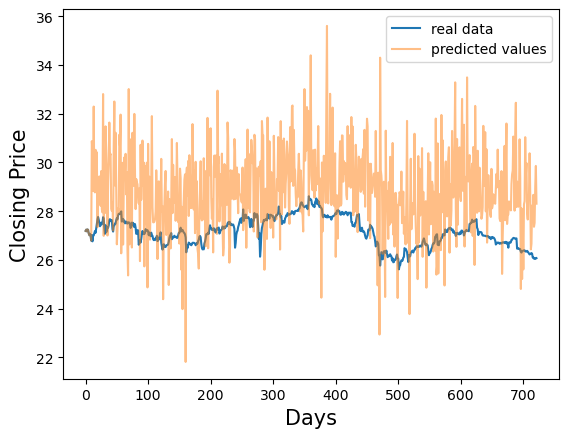

[tensor(1.0545), tensor(1.6290), tensor(0.7582), tensor(1.0381), tensor(0.7213), tensor(0.8218), tensor(0.8787), tensor(1.5173), tensor(1.4356), tensor(0.9347), tensor(0.9609), tensor(1.5720), tensor(1.4833), tensor(0.5515), tensor(1.0651), tensor(1.0281), tensor(0.7726), tensor(1.0053), tensor(0.9183), tensor(0.9929)] 1.056955 [tensor(15.3223), tensor(7.5981), tensor(6.2902), tensor(14.4013), tensor(12.9302), tensor(18.6147), tensor(23.6083), tensor(21.6042), tensor(24.7038), tensor(5.8699), tensor(6.2161), tensor(25.4664), tensor(16.0002), tensor(8.9192), tensor(19.2253), tensor(22.1956), tensor(28.6969), tensor(6.0033), tensor(5.8853), tensor(5.7353)] 14.764333
20 480 tensor(15.0523) tensor(1.2157)


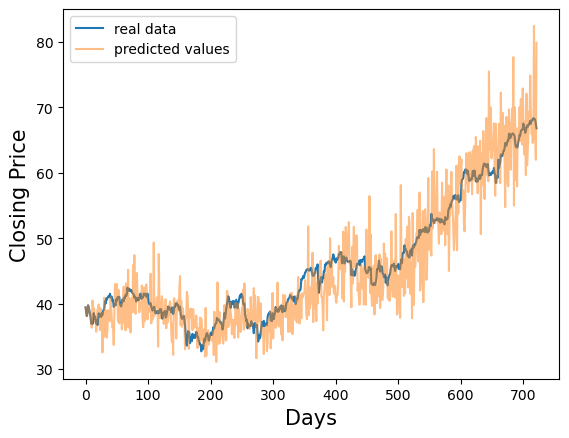

20 480 tensor(9.1402) tensor(1.0841)


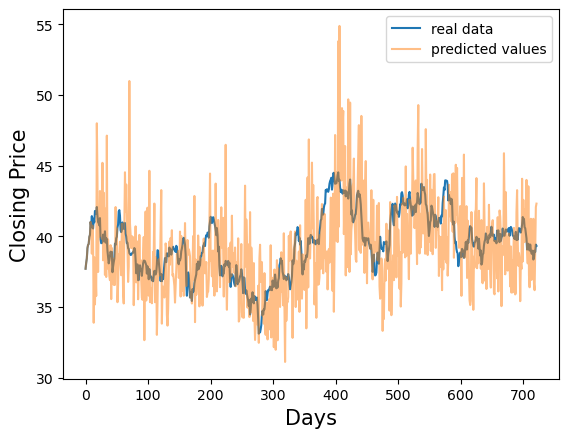

20 480 tensor(7.3021) tensor(0.9042)


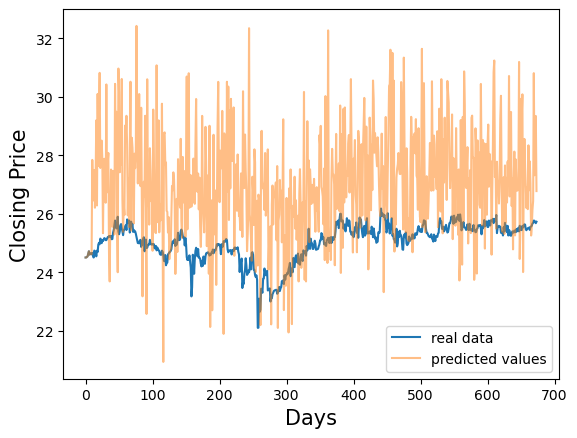

20 480 tensor(16.5420) tensor(0.7209)


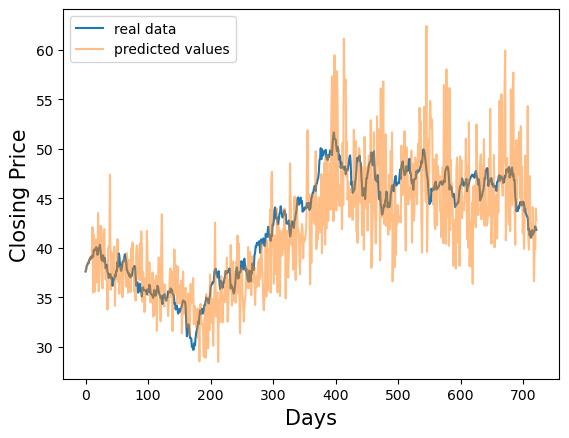

20 480 tensor(13.6648) tensor(1.1141)


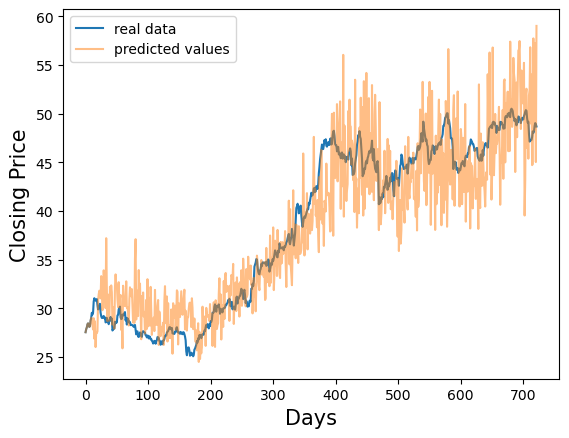

20 480 tensor(16.9531) tensor(0.8344)


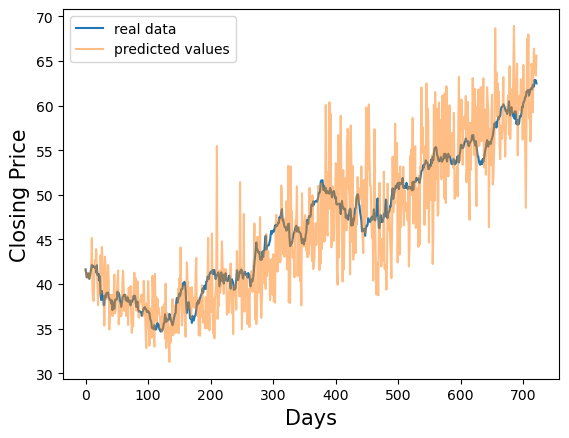

20 480 tensor(24.4079) tensor(0.7805)


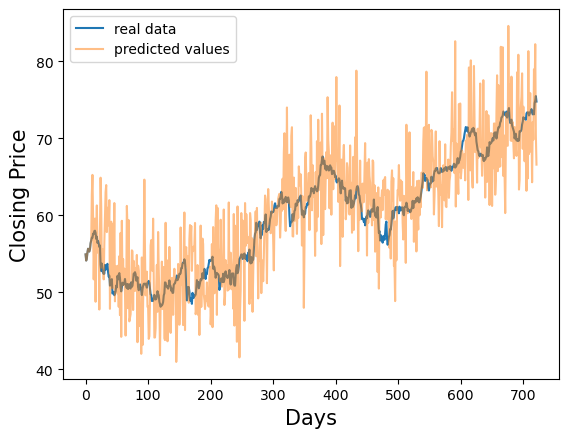

20 480 tensor(23.6037) tensor(1.0798)


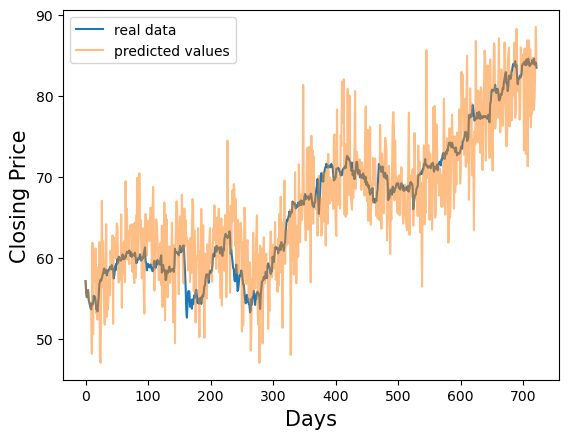

20 480 tensor(25.0440) tensor(1.1947)


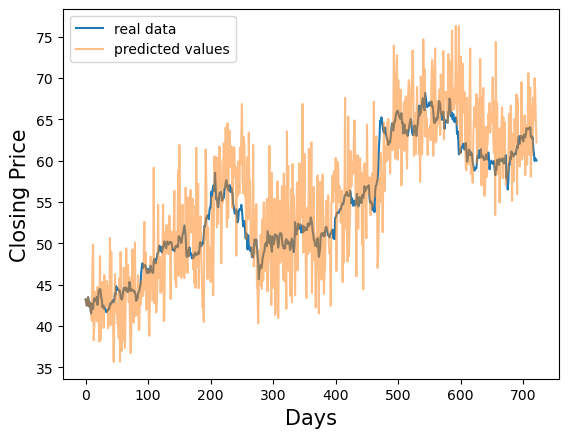

20 480 tensor(6.7305) tensor(1.0289)


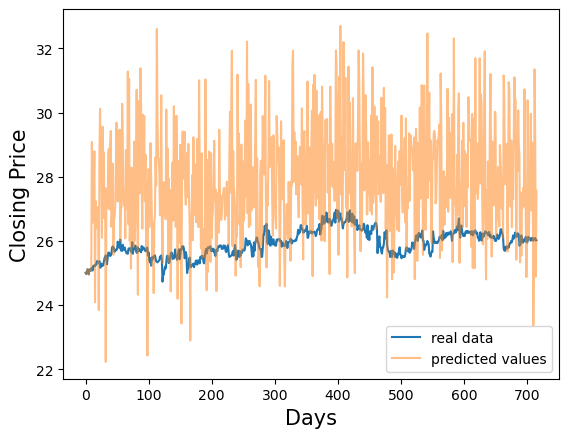

20 480 tensor(6.3490) tensor(1.0570)


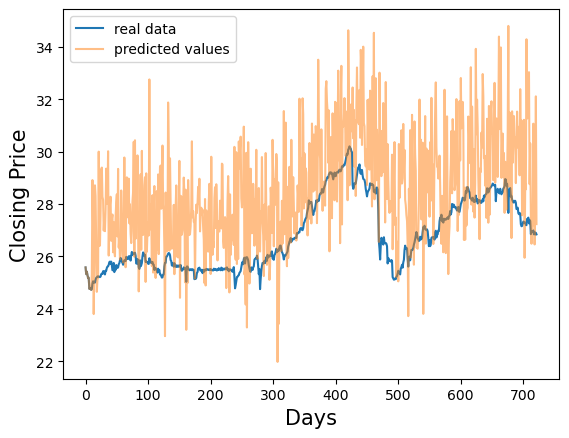

20 480 tensor(25.1095) tensor(1.6902)


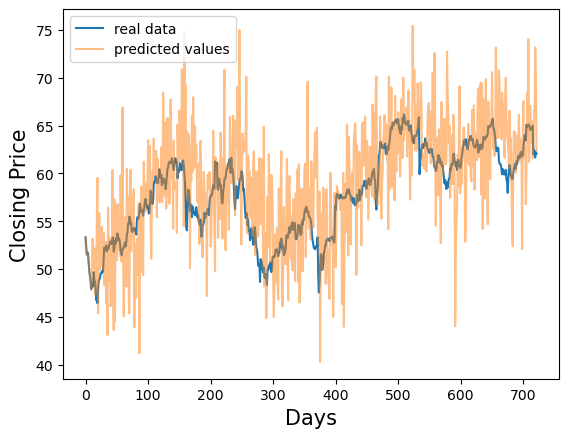

20 480 tensor(17.9182) tensor(0.8527)


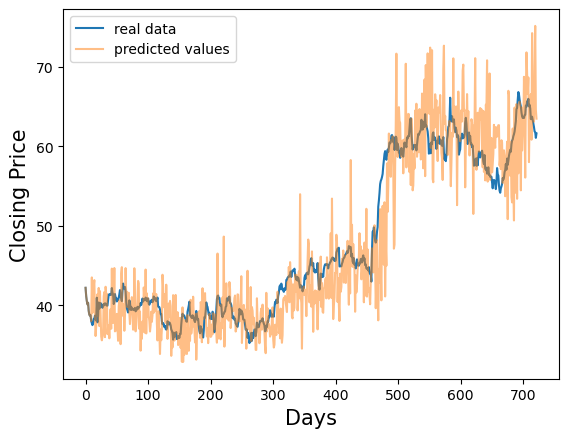

20 480 tensor(10.1150) tensor(1.2938)


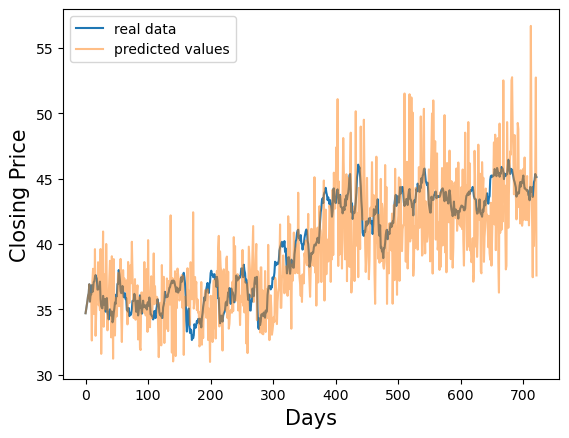

20 480 tensor(19.2646) tensor(0.9043)


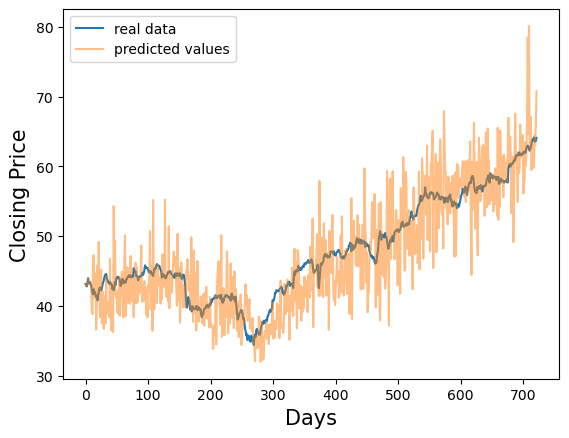

20 480 tensor(23.0322) tensor(1.0135)


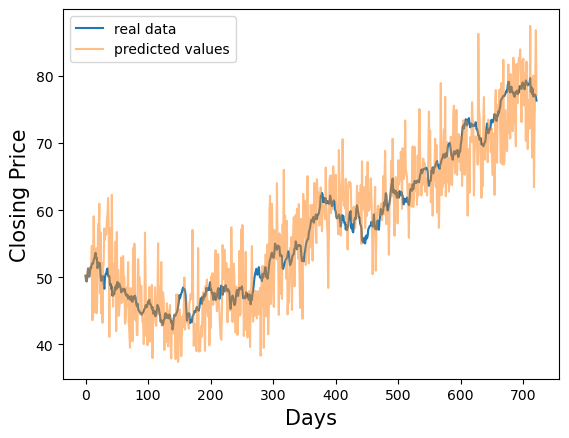

20 480 tensor(31.6073) tensor(1.0045)


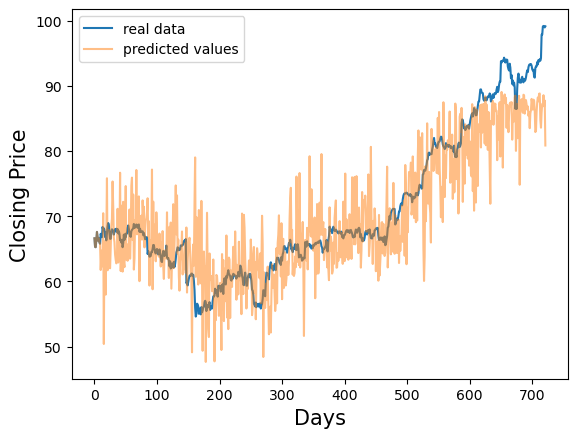

20 480 tensor(7.1231) tensor(1.2693)


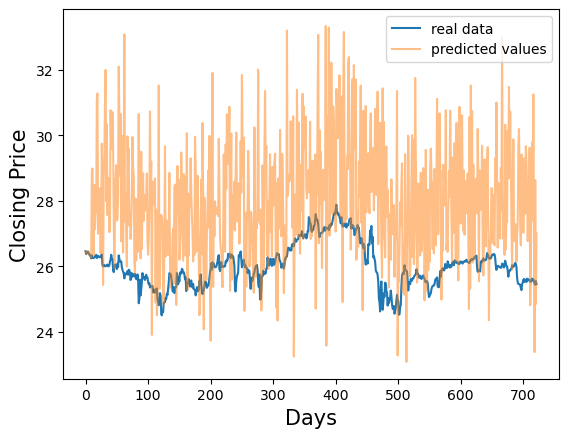

20 480 tensor(6.8666) tensor(1.0354)


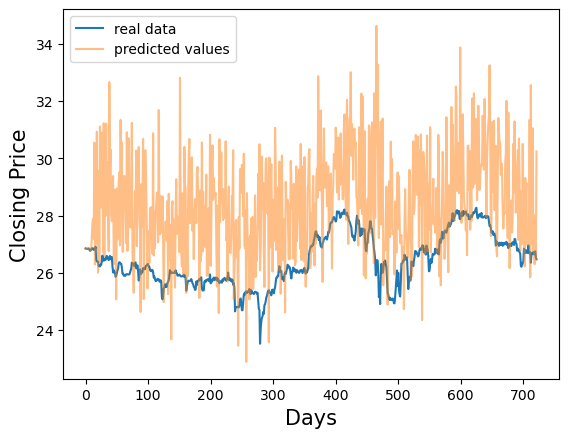

20 480 tensor(6.7124) tensor(0.8659)


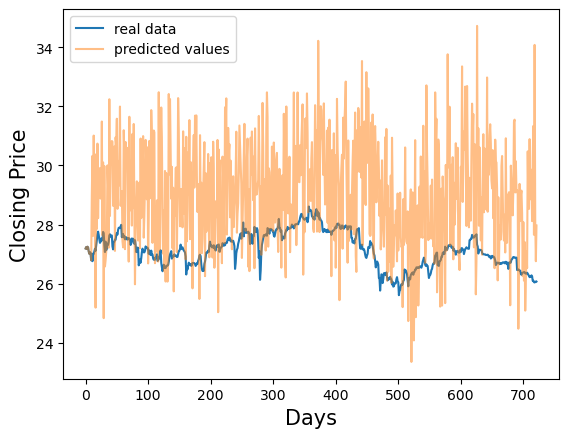

[tensor(1.2157), tensor(1.0841), tensor(0.9042), tensor(0.7209), tensor(1.1141), tensor(0.8344), tensor(0.7805), tensor(1.0798), tensor(1.1947), tensor(1.0289), tensor(1.0570), tensor(1.6902), tensor(0.8527), tensor(1.2938), tensor(0.9043), tensor(1.0135), tensor(1.0045), tensor(1.2693), tensor(1.0354), tensor(0.8659)] 1.0471992 [tensor(15.0523), tensor(9.1402), tensor(7.3021), tensor(16.5420), tensor(13.6648), tensor(16.9531), tensor(24.4079), tensor(23.6037), tensor(25.0440), tensor(6.7305), tensor(6.3490), tensor(25.1095), tensor(17.9182), tensor(10.1150), tensor(19.2646), tensor(23.0322), tensor(31.6073), tensor(7.1231), tensor(6.8666), tensor(6.7124)] 15.626925


In [116]:
#moving average test for 20 stocks
best_checkpoints = {5:610, 10:770, 20:480}
for key in [5,10,20]:#best_checkpoints.keys():
    with torch.no_grad():
        model.eval()
        checkpoint = best_checkpoints[key]
        prods = []
        mses = []
        for s in range(len(test_datas)):
            test_data = test_datas[s]
            state_dict = torch.load(os.path.join(current_path, "20-4-24", "old", "smoothCheckpoints", "smooth" + str(key), 'checkpoint' + str(checkpoint) + '.pth'))
            model.load_state_dict(state_dict)
            inpt = [x for x in test_data[0][0]]
            out = [x for x in test_data[0][0]]
            for i in range(len(test_data)):
                sum1 = 0
                x = []
                for j in range(9):
                    x.append(np.mean(inpt[j-10-key+1:j-9]))
                x.append(np.mean(inpt[-key:]))
                x = torch.tensor(x)
                y = test_data[i][1]
                x = x.unsqueeze(0)
                trg = x[:, 1:]
                optimizer.zero_grad()
                output = model(x, trg)
                out.append(output)
                inpt.append(test_data[i][1])

            total_loss = 0.0
            for i in range(len(inpt)-10):
                total_loss += (inpt[i+10]-out[i+10])**2
            mse = total_loss/(len(inpt)-10)

            prod1 = 1
            for i in range(1, len(inpt)):
                sign = 1
                if out[i]-out[i-1] < 0:
                    sign = -1
                prod1 *= (1+(inpt[i] -inpt[i-1])/inpt[i-1]*sign)
            score = prod1

            prods.append(prod1)
            mses.append(mse)

            print(key, checkpoint, mse, score)


            plt.plot(inpt, label='real data')
            plt.plot(out, alpha=0.5, label='predicted values')
            plt.xlabel('Days', fontsize=15)
            plt.ylabel('Closing Price', fontsize=15)
            plt.legend()
            plt.show()
    print(prods, np.mean(prods), mses, np.mean(mses))

0.1 530 tensor(10.2338) tensor(1.0570)


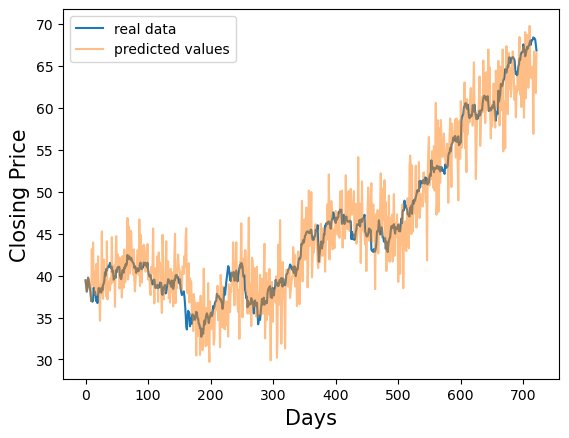

0.1 530 tensor(8.9123) tensor(0.9779)


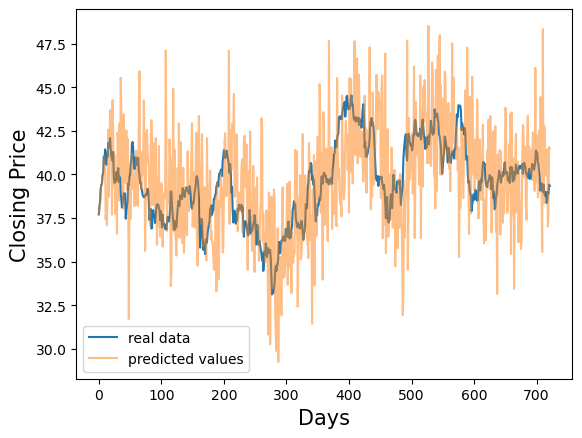

0.1 530 tensor(2.0956) tensor(0.8330)


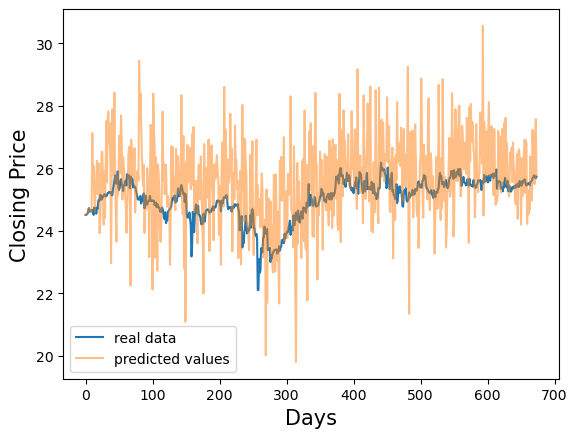

0.1 530 tensor(13.3457) tensor(1.1755)


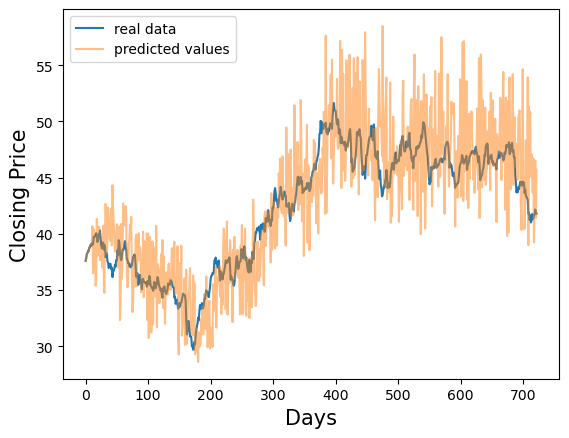

0.1 530 tensor(9.5147) tensor(1.4659)


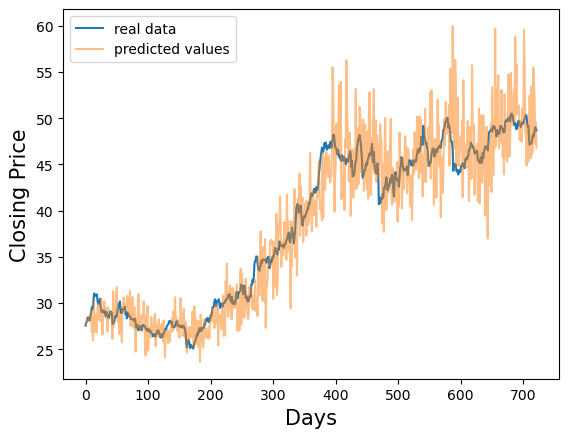

0.1 530 tensor(11.4897) tensor(2.2411)


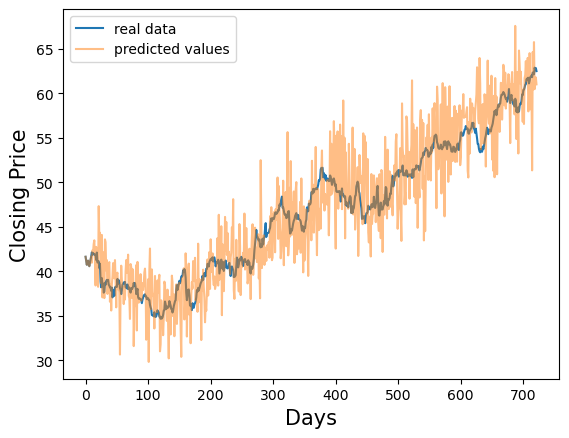

0.1 530 tensor(14.9344) tensor(1.3166)


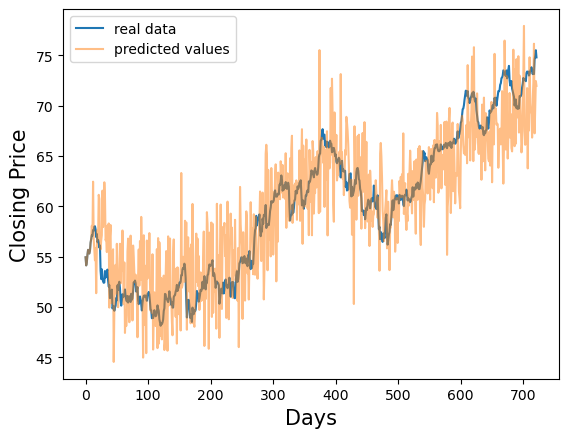

0.1 530 tensor(18.9407) tensor(0.9671)


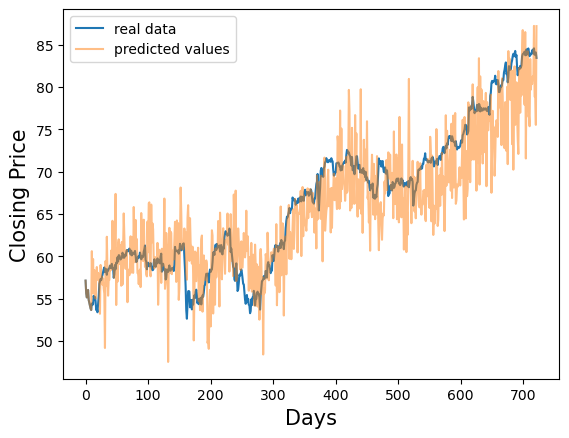

0.1 530 tensor(14.6150) tensor(0.7754)


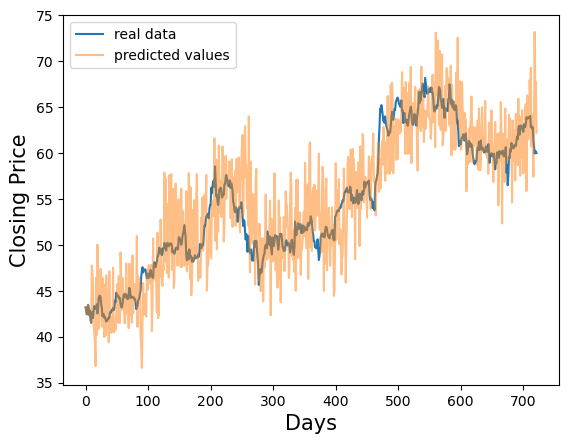

0.1 530 tensor(1.8189) tensor(1.2157)


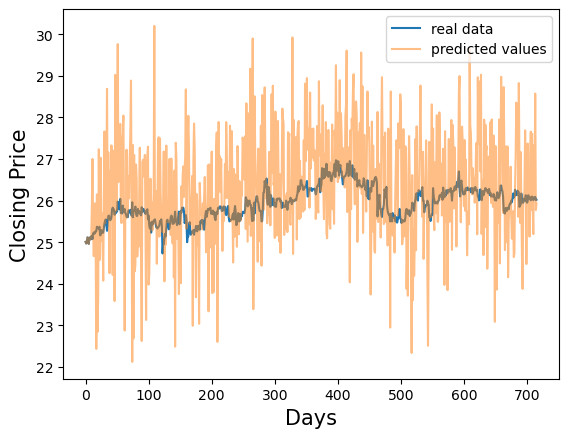

0.1 530 tensor(2.0805) tensor(0.8883)


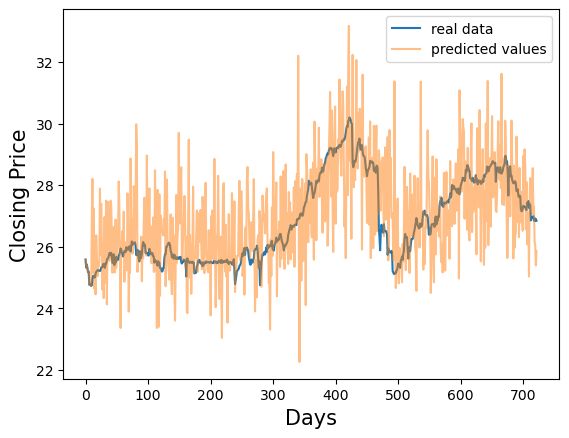

0.1 530 tensor(14.7651) tensor(1.0342)


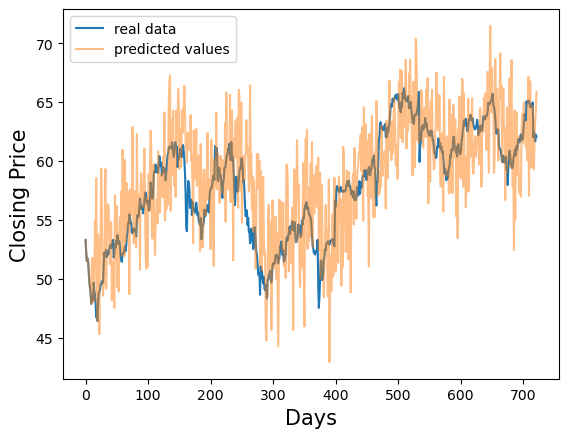

0.1 530 tensor(12.7811) tensor(1.5055)


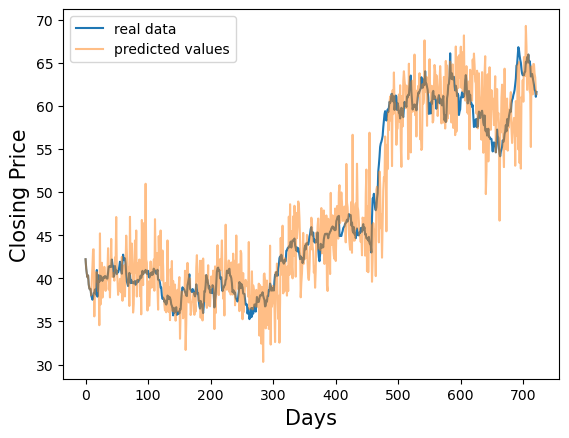

0.1 530 tensor(9.6191) tensor(1.0461)


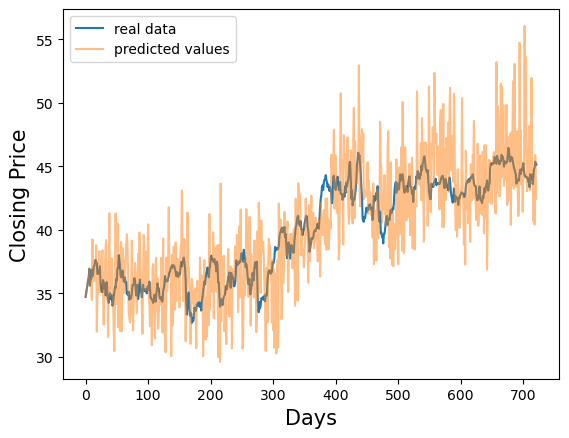

0.1 530 tensor(11.8067) tensor(1.4959)


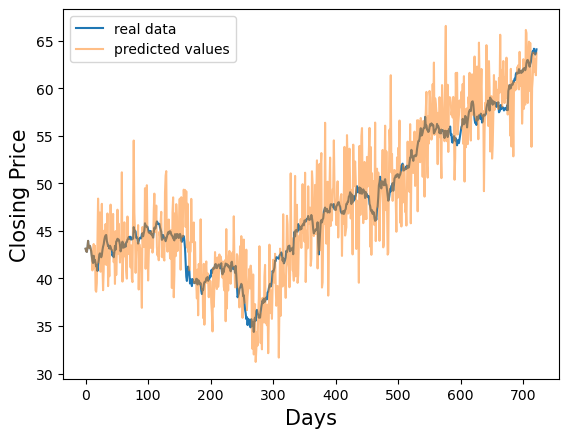

0.1 530 tensor(17.4839) tensor(0.8421)


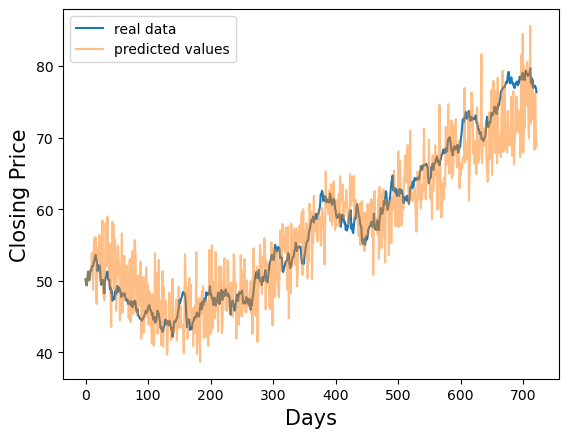

0.1 530 tensor(26.8338) tensor(1.3563)


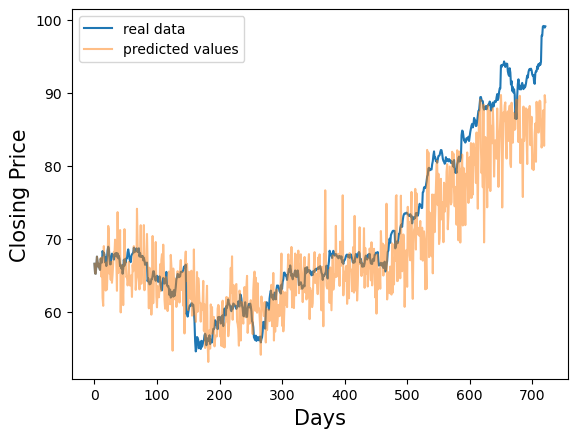

0.1 530 tensor(2.0558) tensor(1.0273)


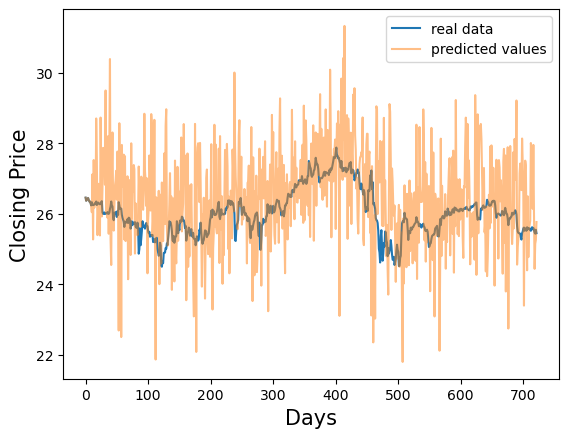

0.1 530 tensor(1.9789) tensor(0.9196)


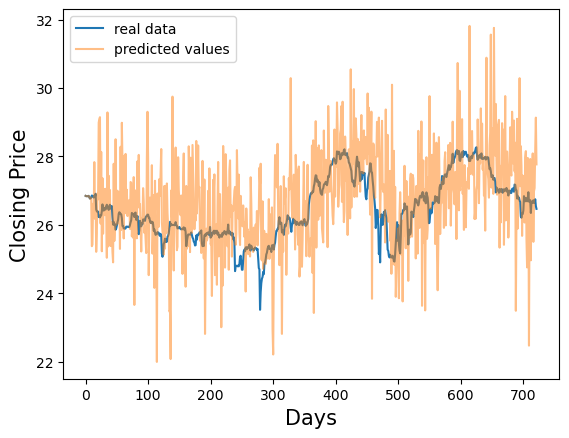

0.1 530 tensor(1.7708) tensor(0.8562)


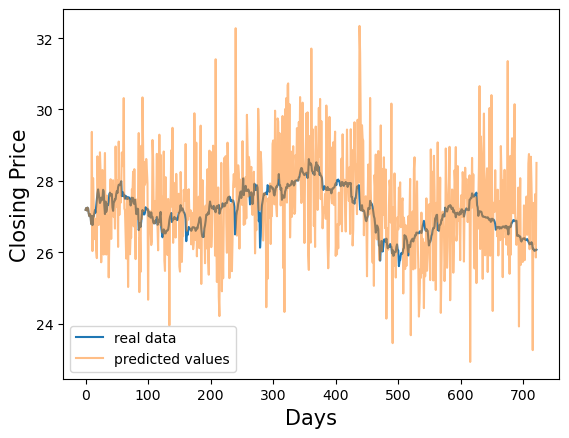

[tensor(1.0570), tensor(0.9779), tensor(0.8330), tensor(1.1755), tensor(1.4659), tensor(2.2411), tensor(1.3166), tensor(0.9671), tensor(0.7754), tensor(1.2157), tensor(0.8883), tensor(1.0342), tensor(1.5055), tensor(1.0461), tensor(1.4959), tensor(0.8421), tensor(1.3563), tensor(1.0273), tensor(0.9196), tensor(0.8562)] 1.1498431 [tensor(10.2338), tensor(8.9123), tensor(2.0956), tensor(13.3457), tensor(9.5147), tensor(11.4897), tensor(14.9344), tensor(18.9407), tensor(14.6150), tensor(1.8189), tensor(2.0805), tensor(14.7651), tensor(12.7811), tensor(9.6191), tensor(11.8067), tensor(17.4839), tensor(26.8338), tensor(2.0558), tensor(1.9789), tensor(1.7708)] 10.353821
0.15 680 tensor(13.7744) tensor(1.3489)


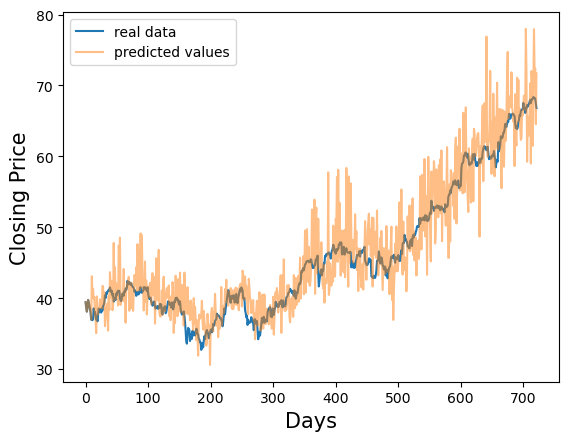

0.15 680 tensor(8.1728) tensor(1.6432)


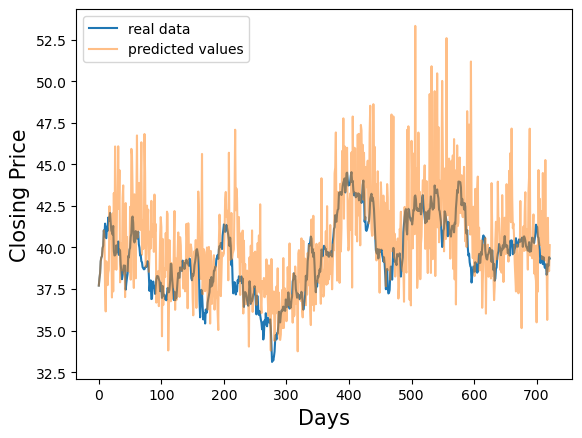

0.15 680 tensor(5.7028) tensor(0.9330)


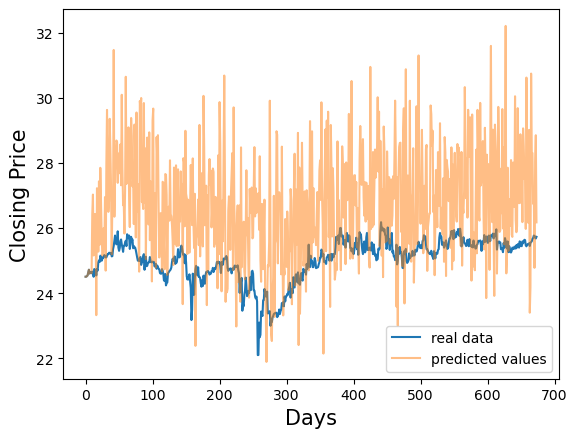

0.15 680 tensor(12.5861) tensor(1.1680)


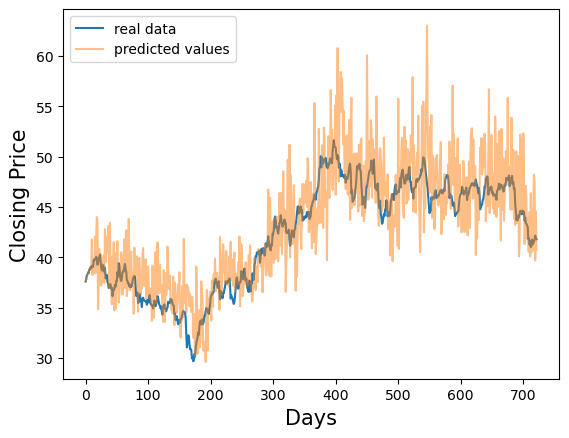

0.15 680 tensor(12.3102) tensor(0.9517)


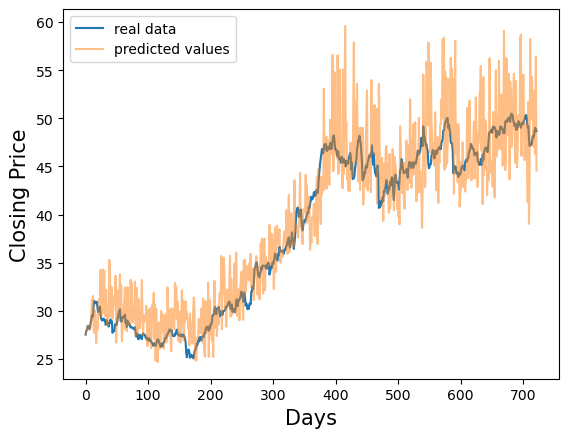

0.15 680 tensor(15.4493) tensor(1.4924)


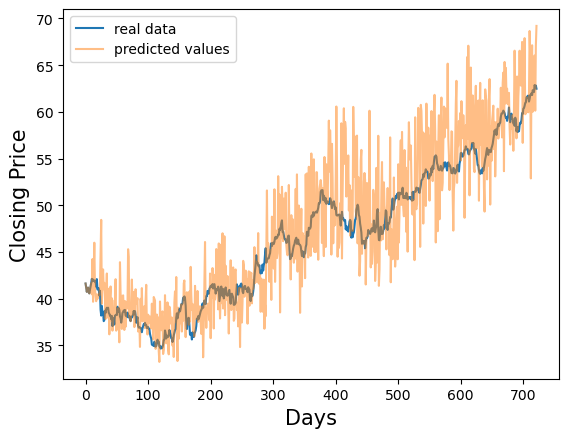

0.15 680 tensor(23.3020) tensor(0.9043)


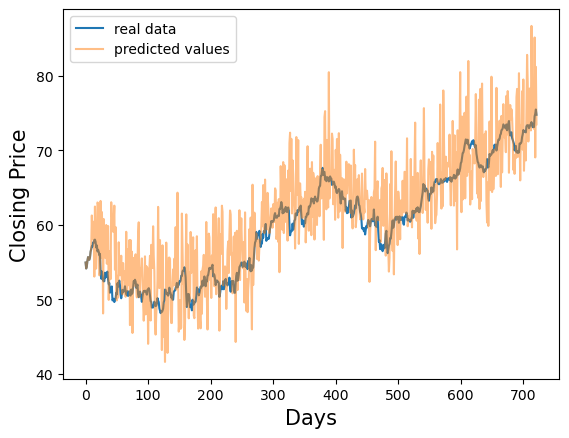

0.15 680 tensor(22.1339) tensor(1.4152)


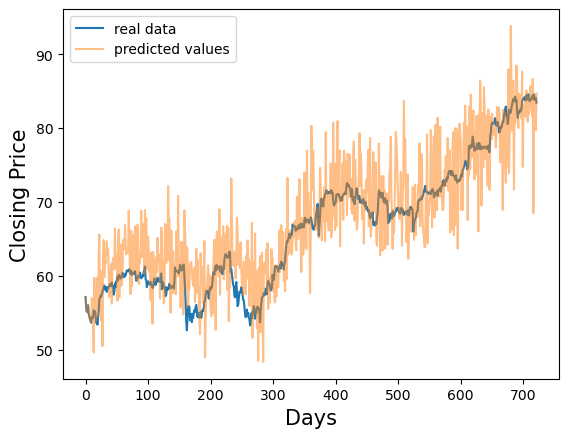

0.15 680 tensor(22.7906) tensor(1.1509)


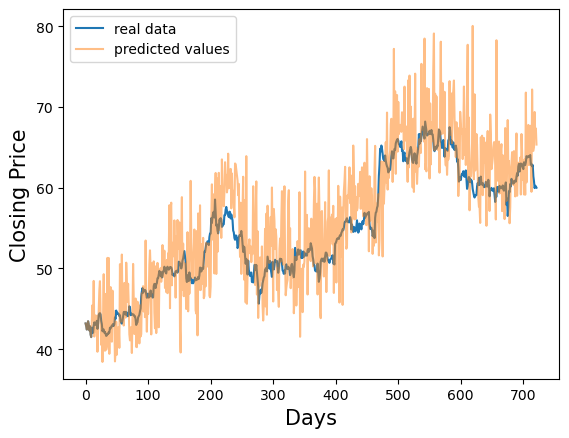

0.15 680 tensor(5.3934) tensor(0.8222)


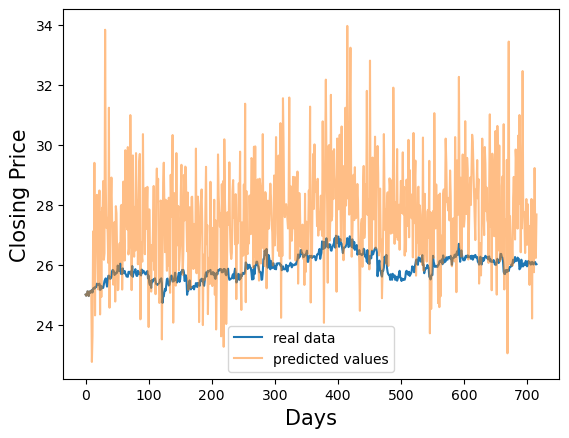

0.15 680 tensor(6.2984) tensor(1.2313)


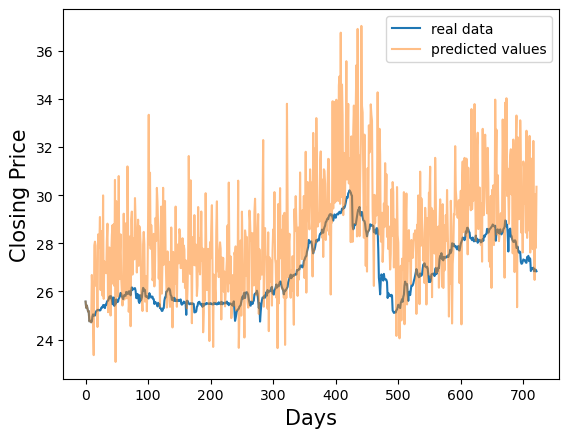

0.15 680 tensor(24.8963) tensor(1.6449)


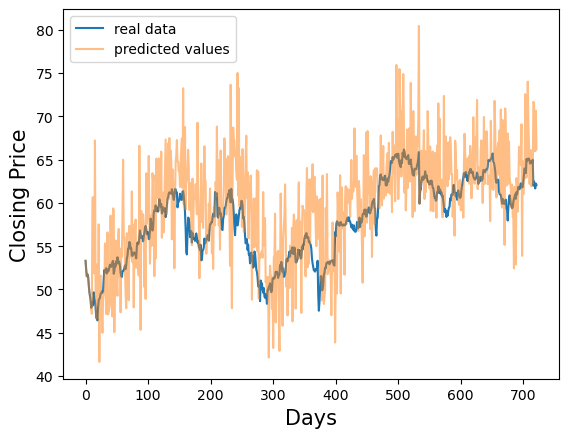

0.15 680 tensor(14.0665) tensor(0.9967)


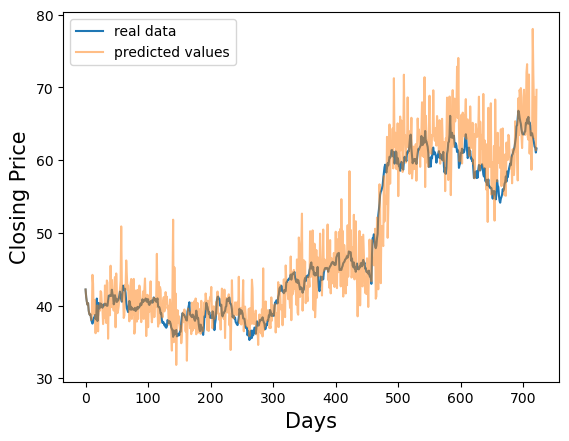

0.15 680 tensor(9.1994) tensor(0.7759)


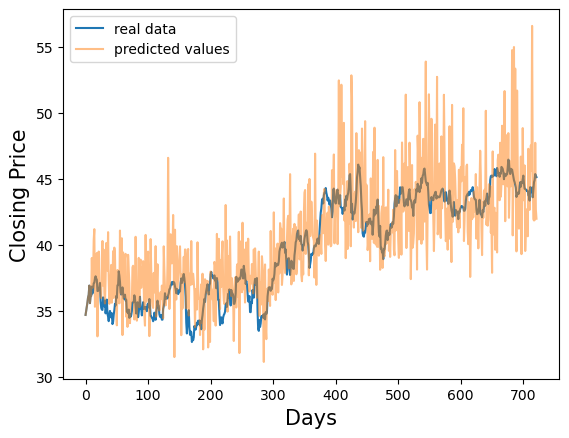

0.15 680 tensor(13.7522) tensor(0.6524)


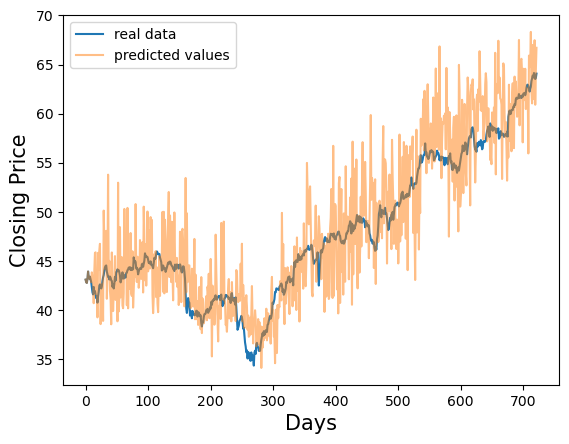

0.15 680 tensor(19.7218) tensor(1.4302)


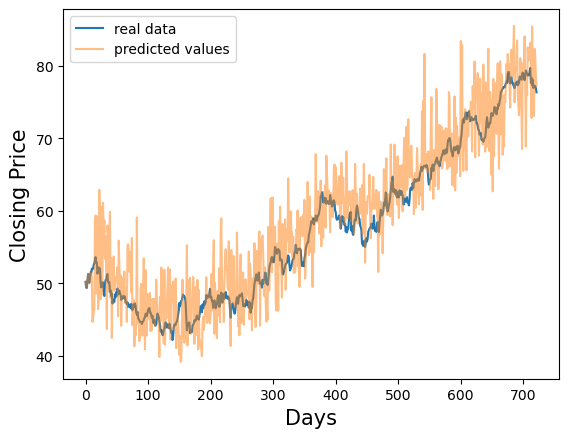

0.15 680 tensor(25.2064) tensor(1.1050)


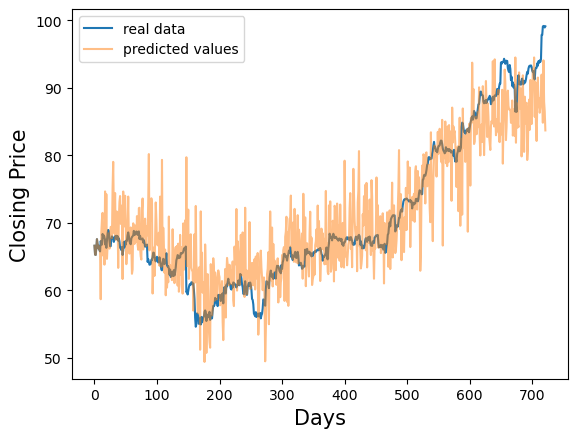

0.15 680 tensor(5.7950) tensor(0.7563)


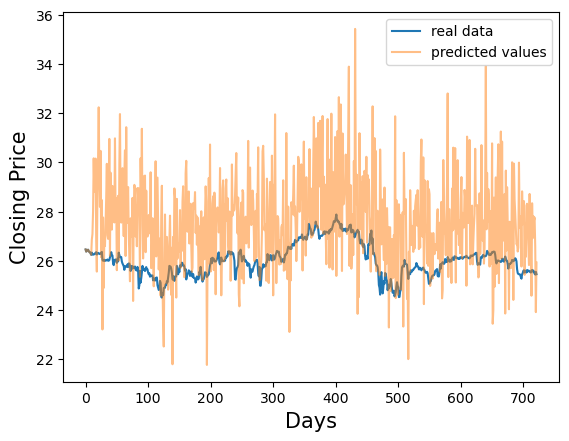

0.15 680 tensor(6.1306) tensor(1.2038)


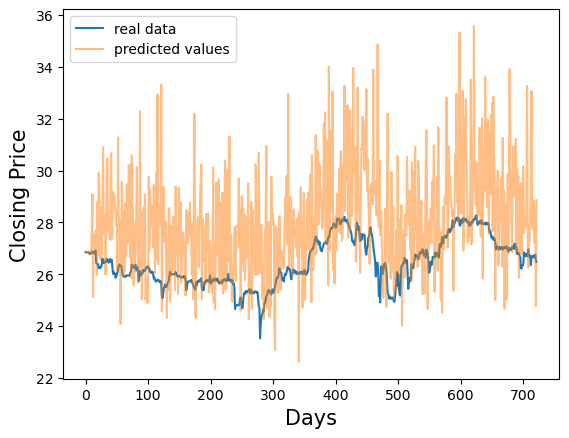

0.15 680 tensor(5.7511) tensor(1.0495)


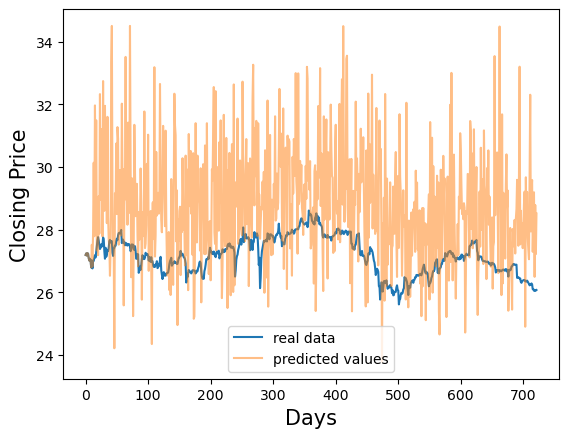

[tensor(1.3489), tensor(1.6432), tensor(0.9330), tensor(1.1680), tensor(0.9517), tensor(1.4924), tensor(0.9043), tensor(1.4152), tensor(1.1509), tensor(0.8222), tensor(1.2313), tensor(1.6449), tensor(0.9967), tensor(0.7759), tensor(0.6524), tensor(1.4302), tensor(1.1050), tensor(0.7563), tensor(1.2038), tensor(1.0495)] 1.1337984 [tensor(13.7744), tensor(8.1728), tensor(5.7028), tensor(12.5861), tensor(12.3102), tensor(15.4493), tensor(23.3020), tensor(22.1339), tensor(22.7906), tensor(5.3934), tensor(6.2984), tensor(24.8963), tensor(14.0665), tensor(9.1994), tensor(13.7522), tensor(19.7218), tensor(25.2064), tensor(5.7950), tensor(6.1306), tensor(5.7511)] 13.621663
0.25 900 tensor(13.8158) tensor(2.4268)


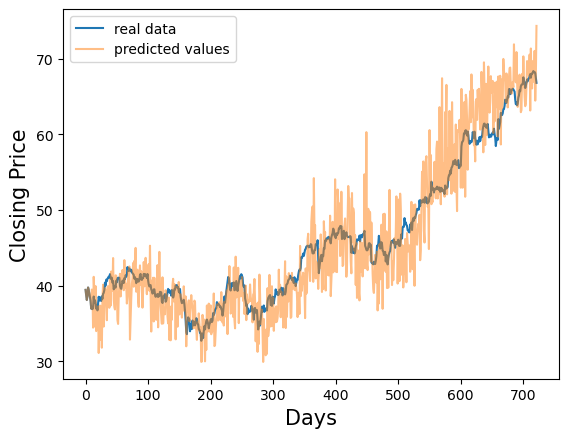

0.25 900 tensor(9.0434) tensor(0.6071)


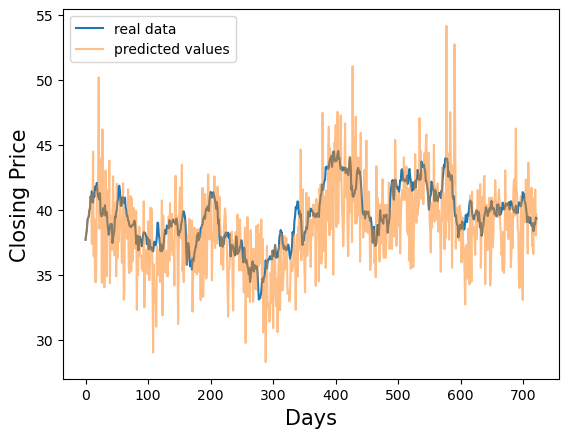

0.25 900 tensor(5.2691) tensor(1.3464)


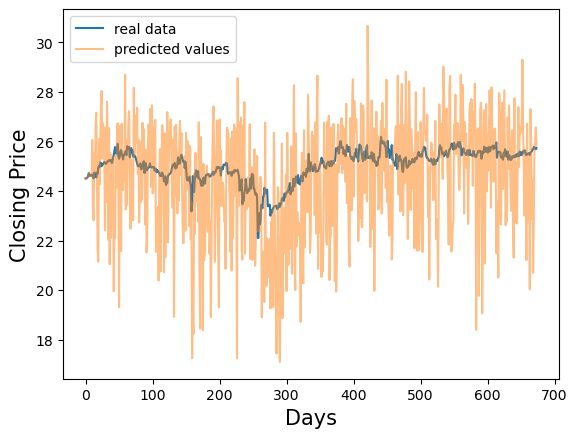

0.25 900 tensor(16.2334) tensor(0.8956)


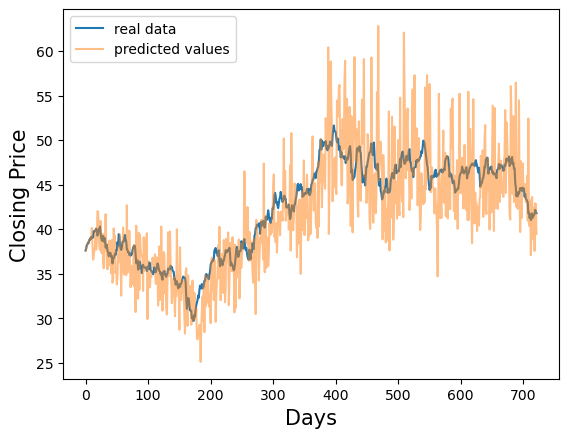

0.25 900 tensor(12.7290) tensor(0.6612)


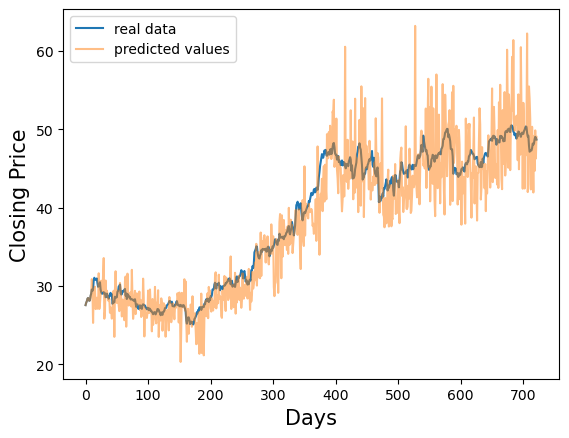

0.25 900 tensor(18.8744) tensor(1.0229)


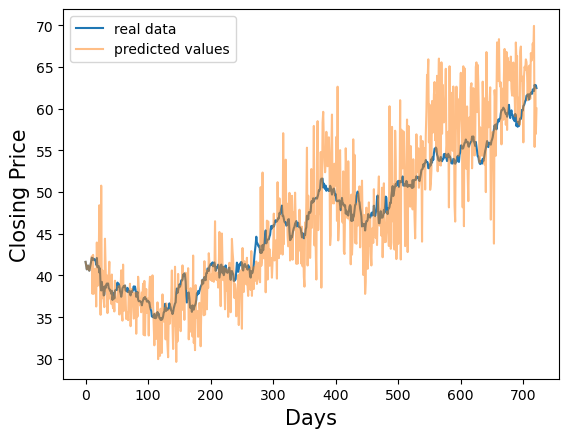

0.25 900 tensor(21.7845) tensor(0.9159)


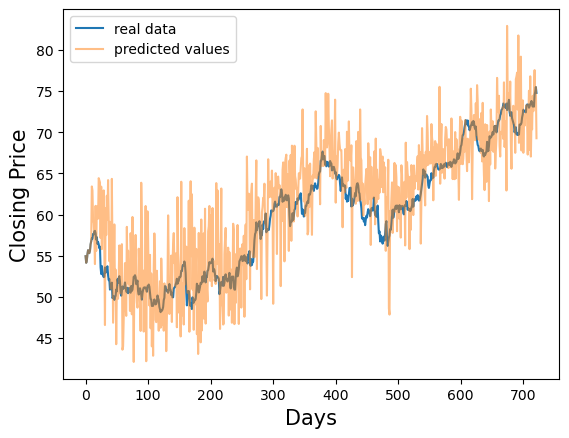

0.25 900 tensor(24.2009) tensor(1.3851)


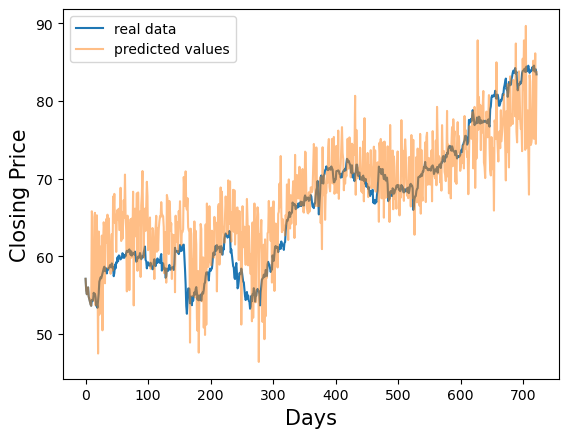

0.25 900 tensor(24.8710) tensor(1.0382)


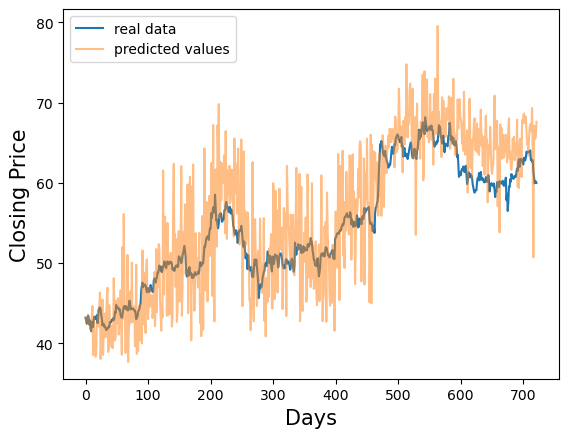

0.25 900 tensor(4.3343) tensor(0.8357)


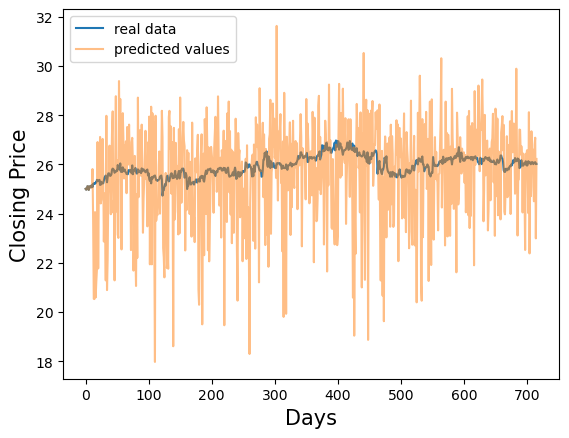

0.25 900 tensor(3.8993) tensor(1.1820)


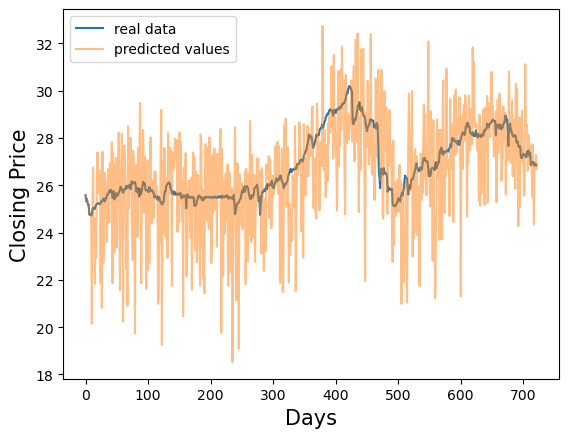

0.25 900 tensor(29.3317) tensor(0.9396)


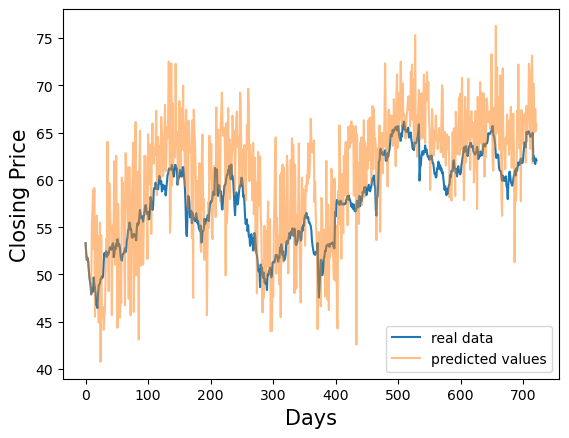

0.25 900 tensor(15.9042) tensor(1.1993)


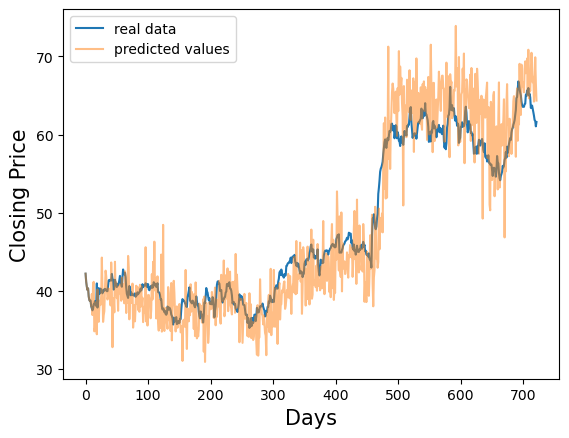

0.25 900 tensor(10.1305) tensor(1.2188)


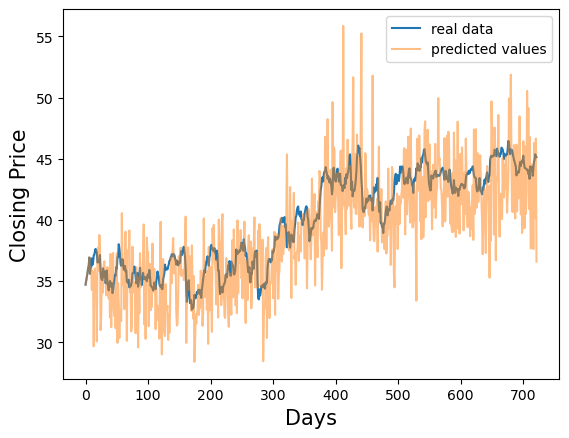

0.25 900 tensor(20.3304) tensor(0.9938)


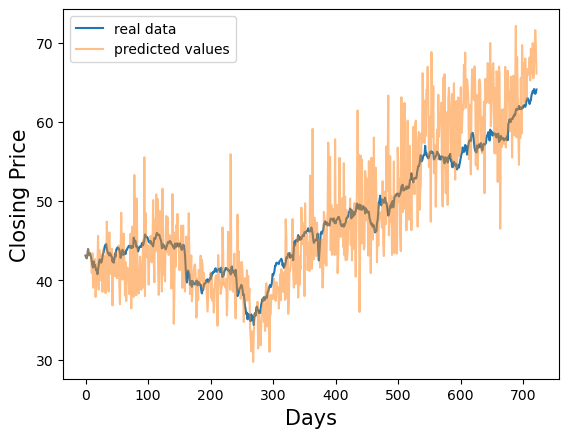

0.25 900 tensor(20.9706) tensor(1.0867)


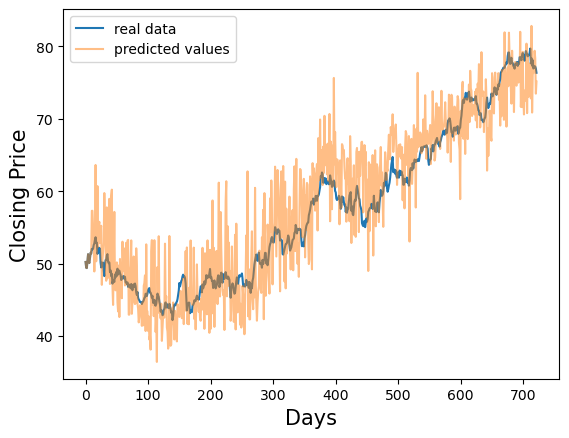

0.25 900 tensor(28.0980) tensor(0.8523)


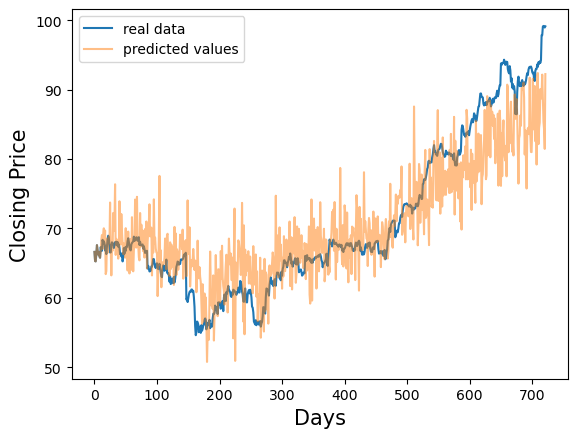

0.25 900 tensor(4.2769) tensor(0.8810)


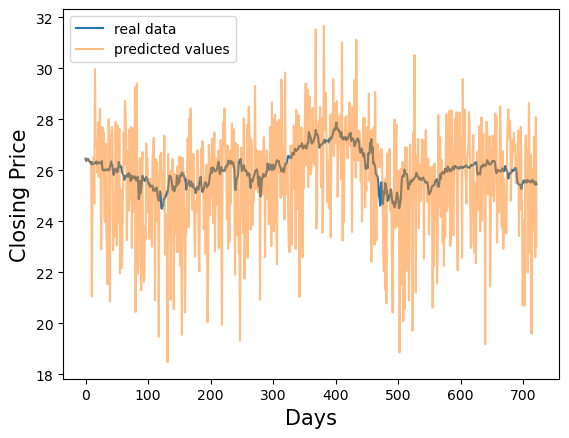

0.25 900 tensor(3.6049) tensor(1.0864)


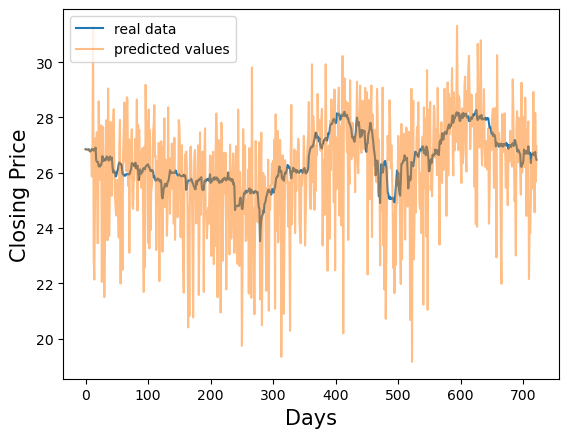

0.25 900 tensor(3.2952) tensor(0.9019)


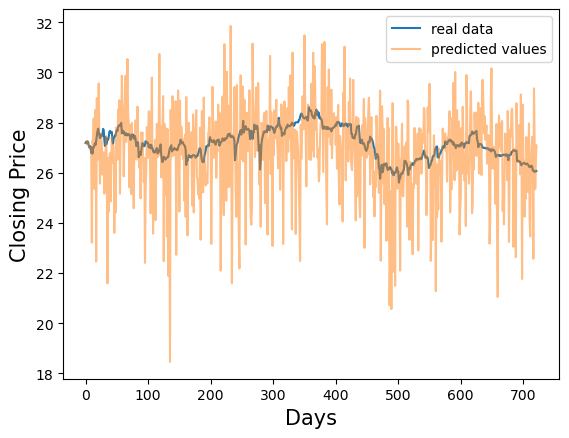

[tensor(2.4268), tensor(0.6071), tensor(1.3464), tensor(0.8956), tensor(0.6612), tensor(1.0229), tensor(0.9159), tensor(1.3851), tensor(1.0382), tensor(0.8357), tensor(1.1820), tensor(0.9396), tensor(1.1993), tensor(1.2188), tensor(0.9938), tensor(1.0867), tensor(0.8523), tensor(0.8810), tensor(1.0864), tensor(0.9019)] 1.0738306 [tensor(13.8158), tensor(9.0434), tensor(5.2691), tensor(16.2334), tensor(12.7290), tensor(18.8744), tensor(21.7845), tensor(24.2009), tensor(24.8710), tensor(4.3343), tensor(3.8993), tensor(29.3317), tensor(15.9042), tensor(10.1305), tensor(20.3304), tensor(20.9706), tensor(28.0980), tensor(4.2769), tensor(3.6049), tensor(3.2952)] 14.549866


In [117]:
#exp moving average test for 20 stocks
best_checkpoints = {0.1:530,0.15:680,0.25:900}
for key in [0.1,0.15,0.25]:#exp_best_checkpoints.keys():
    with torch.no_grad():
        model.eval()
        checkpoint = best_checkpoints[key]
        prods = []
        mses = []
        for s in range(len(test_datas)):
            test_data = test_datas[s]
            state_dict = torch.load(os.path.join(current_path, "20-4-24", "old", "expCheckpoints", "exp" + str(int(key*20)), 'checkpoint' + str(checkpoint) + '.pth'))
            model.load_state_dict(state_dict)
            exp = [test_data[0][0][0]]
            inpt = [x for x in test_data[0][0]]
            out = [x for x in test_data[0][0]]
            for i in range(1, len(test_data[0][0])):
                exp.append(key*inpt[i]+(1-key)*exp[i-1])
            for i in range(len(test_data)):
                x = torch.tensor(exp[-10:])
                y = test_data[i][1]
                x = x.unsqueeze(0)
                trg = x[:, 1:]
                optimizer.zero_grad()
                output = model(x, trg)
                out.append(output)
                inpt.append(test_data[i][1])
                exp.append(key*inpt[-1]+(1-key)*exp[-1])

            total_loss = 0.0
            for i in range(len(inpt)-10):
                total_loss += (inpt[i+10]-out[i+10])**2
            mse = total_loss/(len(inpt)-10)

            prod1 = 1
            for i in range(1, len(inpt)):
                sign = 1
                if out[i]-out[i-1] < 0:
                    sign = -1
                prod1 *= (1+(inpt[i] -inpt[i-1])/inpt[i-1]*sign)
            score = prod1

            prods.append(prod1)
            mses.append(mse)

            print(key, checkpoint, mse, score)


            plt.plot(inpt, label='real data')
            plt.plot(out, alpha=0.5, label='predicted values')
            plt.xlabel('Days', fontsize=15)
            plt.ylabel('Closing Price', fontsize=15)
            plt.legend()
            plt.show()
    print(prods, np.mean(prods), mses, np.mean(mses))

5 370 tensor(21.2080) tensor(1.3404)


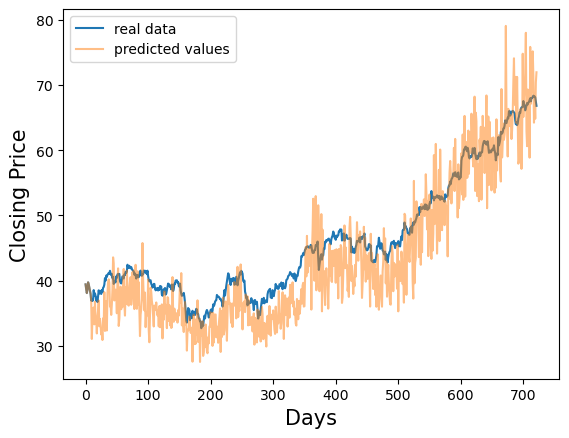

5 370 tensor(19.4463) tensor(0.7868)


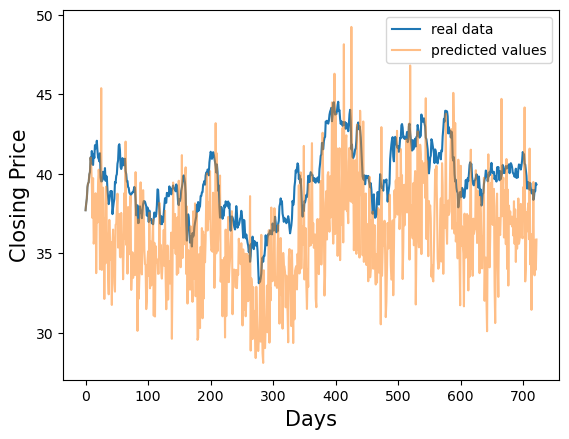

5 370 tensor(2.8857) tensor(0.6505)


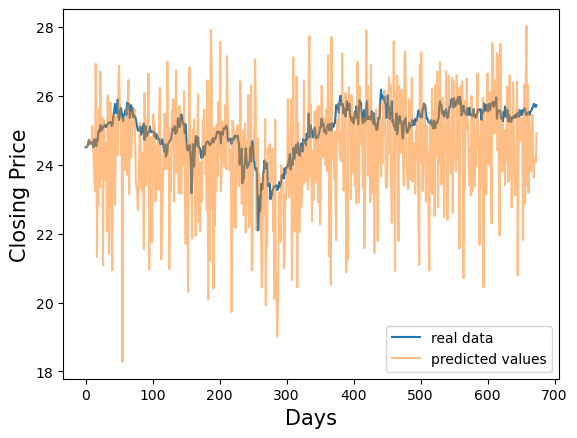

5 370 tensor(19.7773) tensor(1.0230)


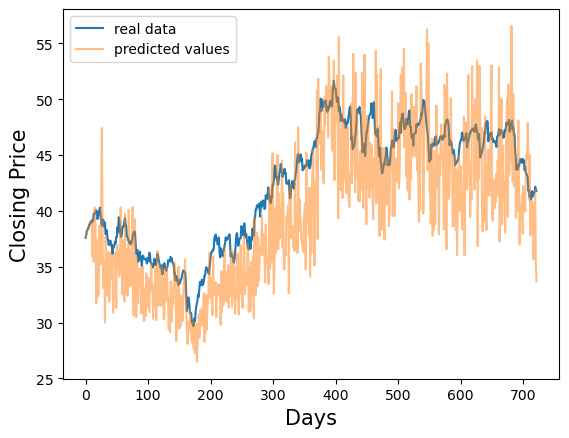

5 370 tensor(16.6698) tensor(0.7961)


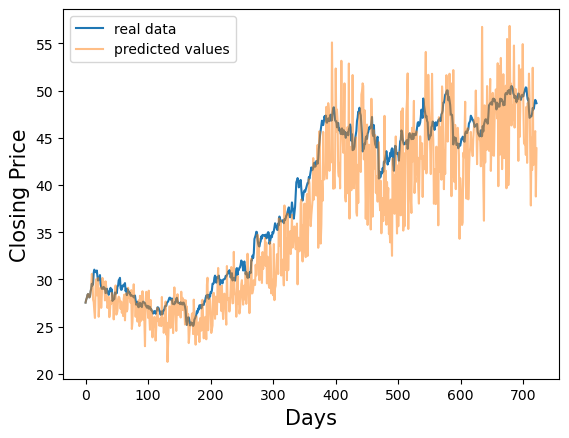

5 370 tensor(19.9533) tensor(1.1300)


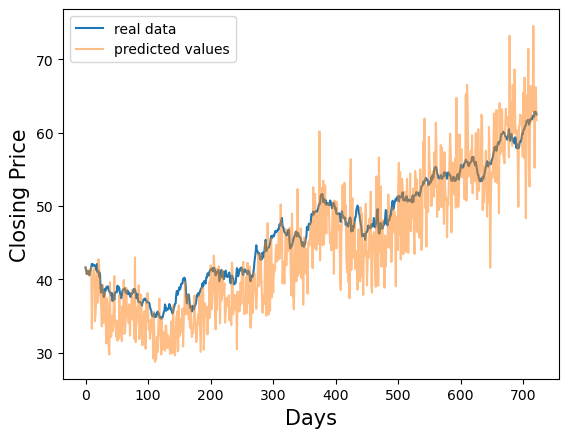

5 370 tensor(20.7446) tensor(1.2017)


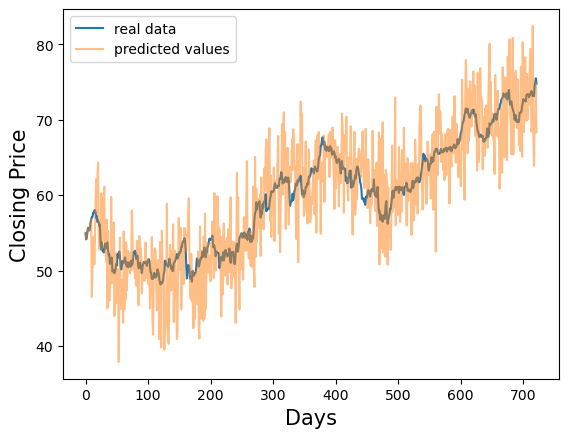

5 370 tensor(20.8135) tensor(1.6721)


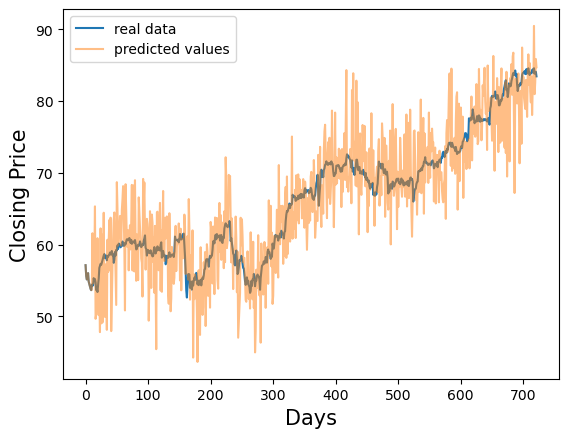

5 370 tensor(23.8317) tensor(0.8740)


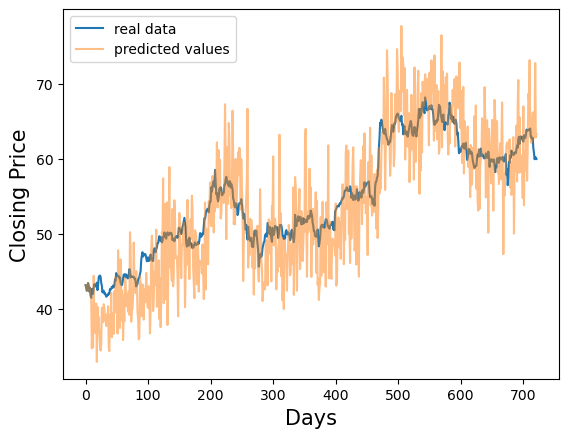

5 370 tensor(2.6703) tensor(1.0776)


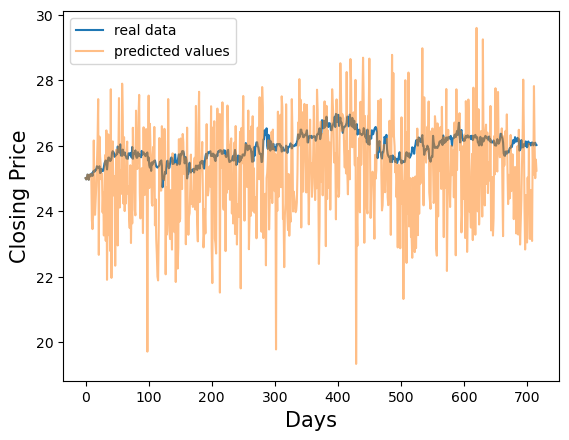

5 370 tensor(3.2801) tensor(0.9050)


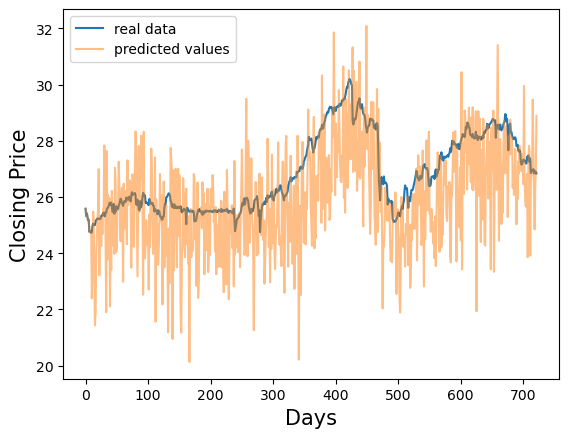

5 370 tensor(23.4873) tensor(0.9441)


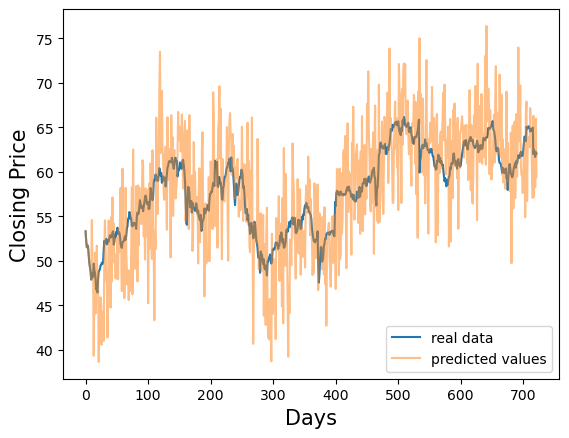

5 370 tensor(19.6789) tensor(1.0059)


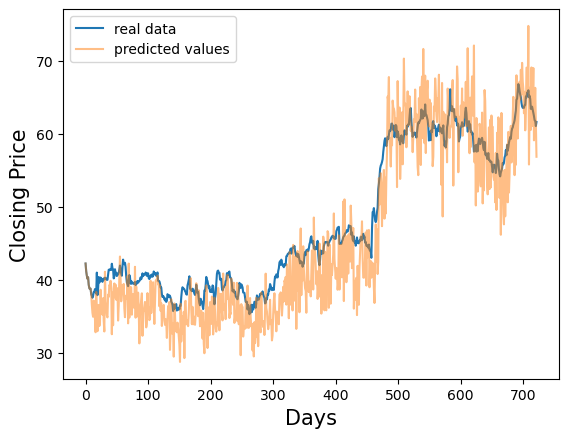

5 370 tensor(19.5519) tensor(0.9899)


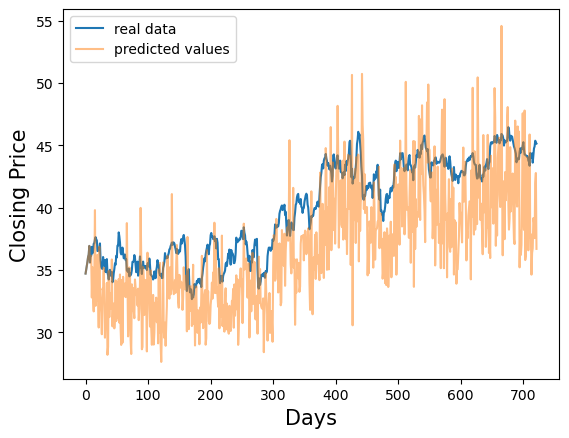

5 370 tensor(23.2745) tensor(1.3322)


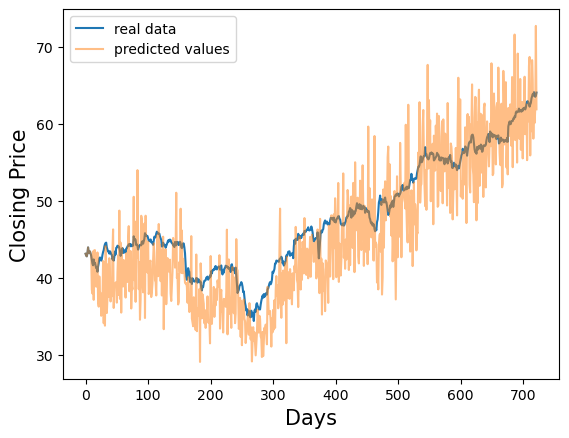

5 370 tensor(24.1091) tensor(0.9427)


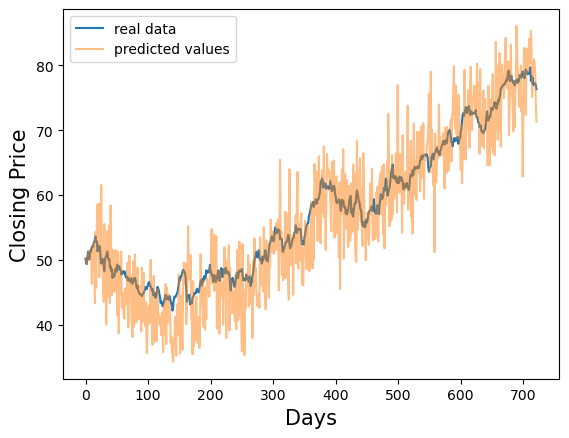

5 370 tensor(25.6030) tensor(1.1618)


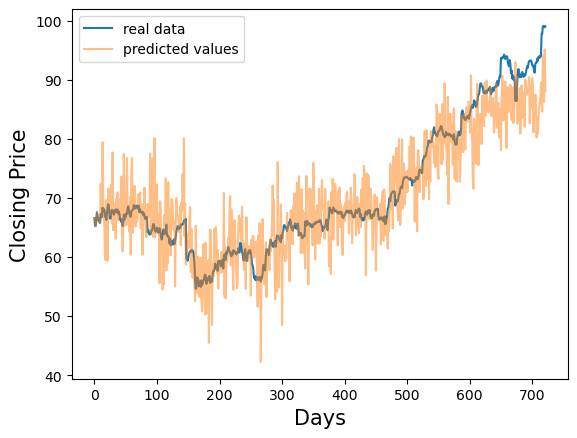

5 370 tensor(2.8245) tensor(1.2743)


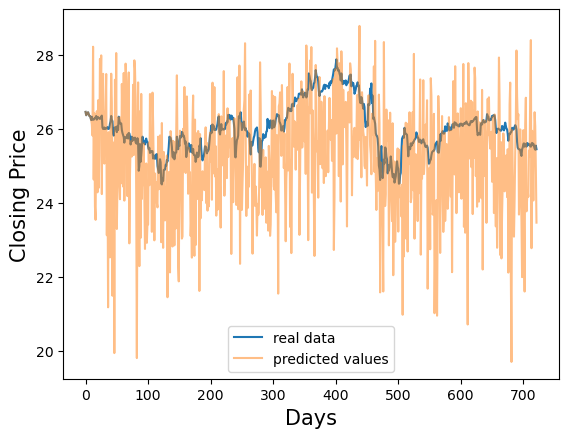

5 370 tensor(3.1652) tensor(0.8854)


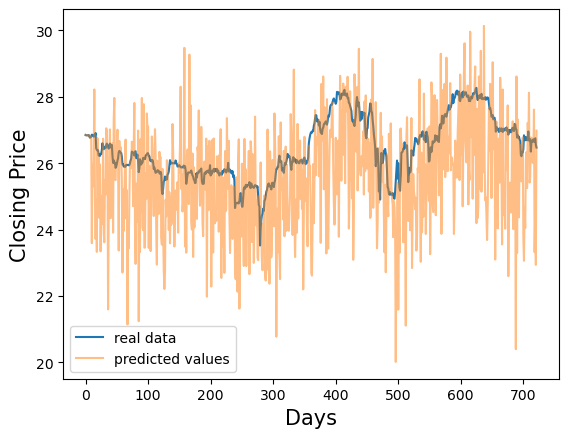

5 370 tensor(3.3240) tensor(1.0392)


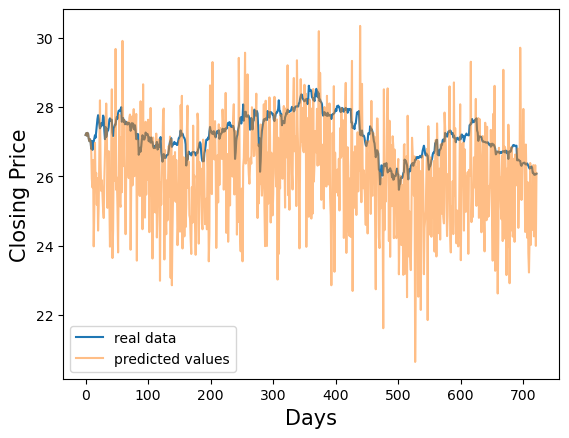

[tensor(1.3404), tensor(0.7868), tensor(0.6505), tensor(1.0230), tensor(0.7961), tensor(1.1300), tensor(1.2017), tensor(1.6721), tensor(0.8740), tensor(1.0776), tensor(0.9050), tensor(0.9441), tensor(1.0059), tensor(0.9899), tensor(1.3322), tensor(0.9427), tensor(1.1618), tensor(1.2743), tensor(0.8854), tensor(1.0392)] 1.0516335 [tensor(21.2080), tensor(19.4463), tensor(2.8857), tensor(19.7773), tensor(16.6698), tensor(19.9533), tensor(20.7446), tensor(20.8135), tensor(23.8317), tensor(2.6703), tensor(3.2801), tensor(23.4873), tensor(19.6789), tensor(19.5519), tensor(23.2745), tensor(24.1091), tensor(25.6030), tensor(2.8245), tensor(3.1652), tensor(3.3240)] 15.814947
10 680 tensor(15.4038) tensor(2.0228)


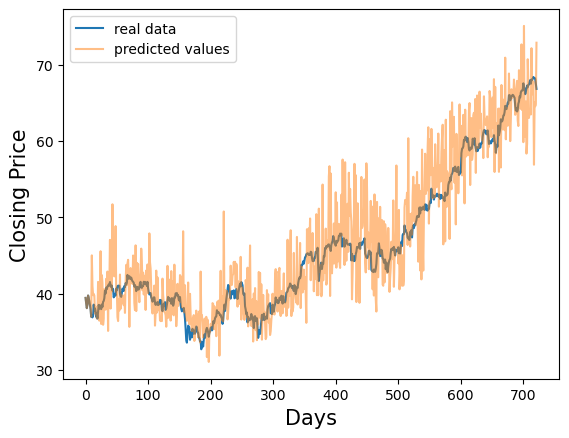

10 680 tensor(10.6076) tensor(0.4500)


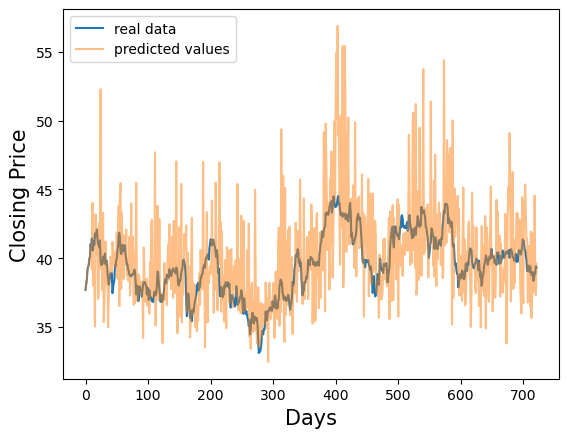

10 680 tensor(8.2713) tensor(1.6682)


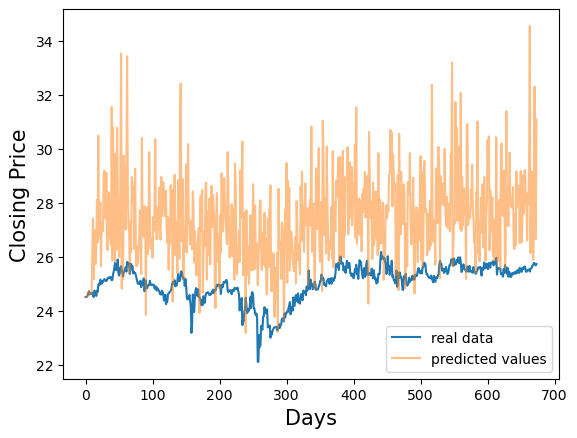

10 680 tensor(19.6144) tensor(1.3883)


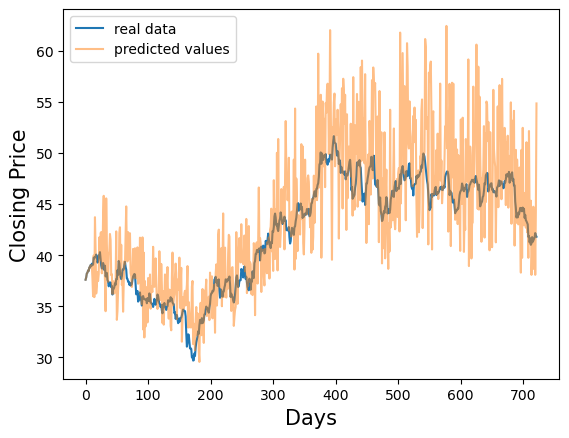

10 680 tensor(17.0398) tensor(0.6914)


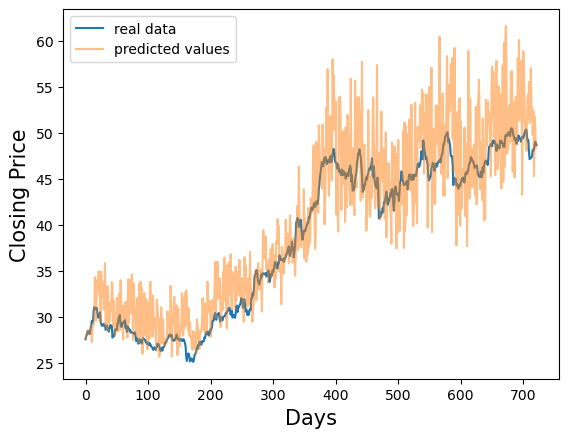

10 680 tensor(19.3960) tensor(1.1029)


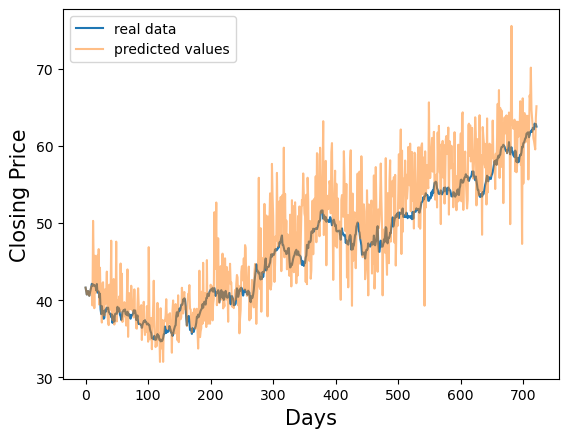

10 680 tensor(20.4144) tensor(0.9235)


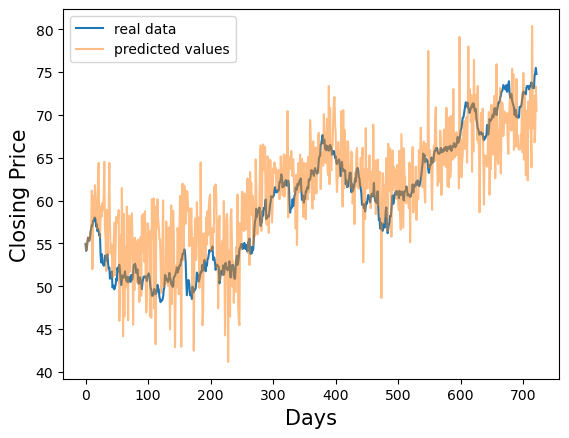

10 680 tensor(22.9990) tensor(1.0734)


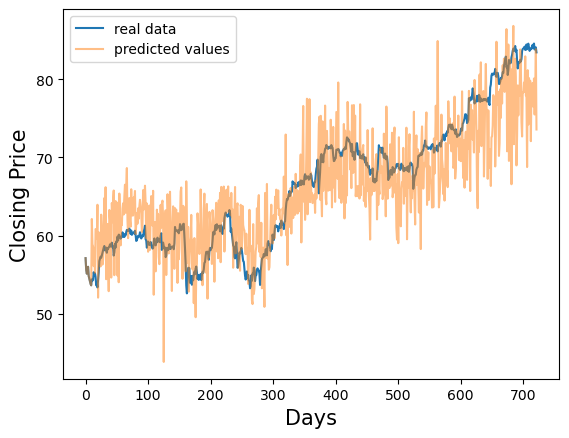

10 680 tensor(21.3376) tensor(2.1896)


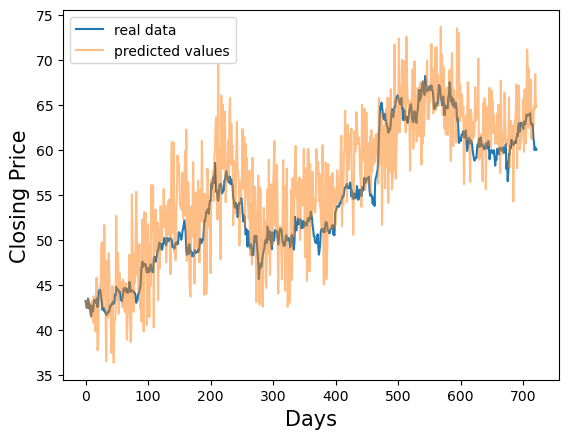

10 680 tensor(9.0493) tensor(1.0480)


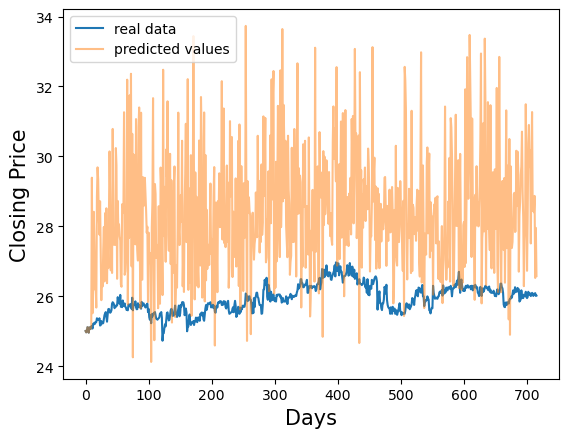

10 680 tensor(9.1044) tensor(0.8216)


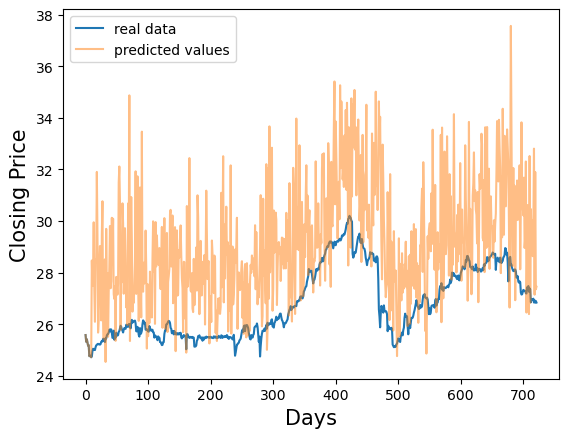

10 680 tensor(18.8577) tensor(1.2371)


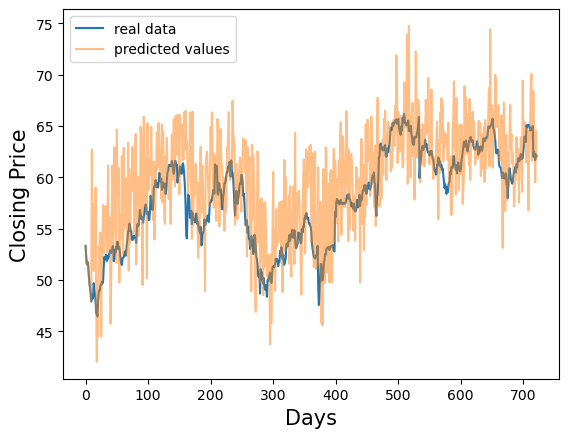

10 680 tensor(14.8859) tensor(0.6283)


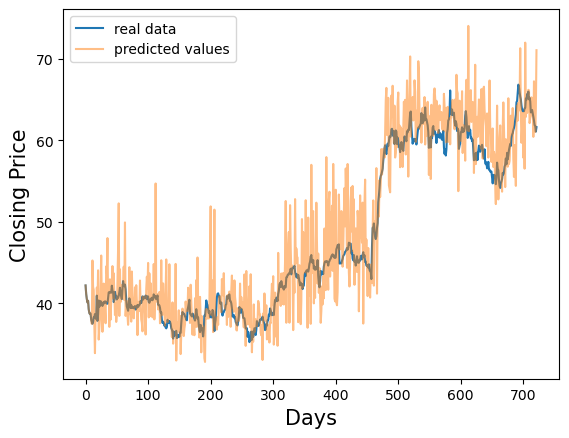

10 680 tensor(13.0869) tensor(0.7372)


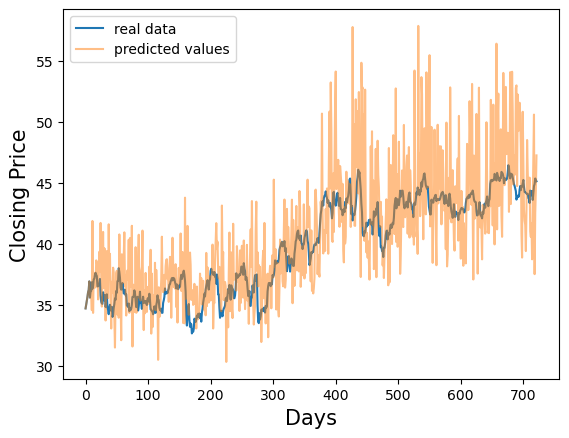

10 680 tensor(18.9277) tensor(0.9425)


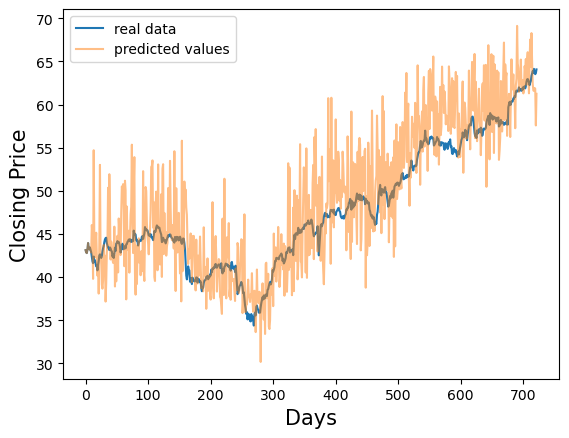

10 680 tensor(24.8755) tensor(0.8946)


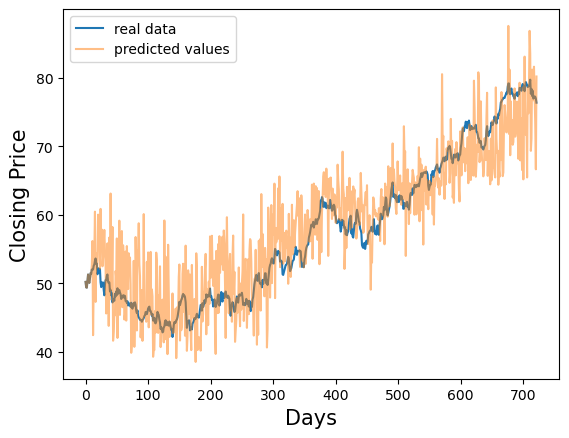

10 680 tensor(31.6365) tensor(0.8135)


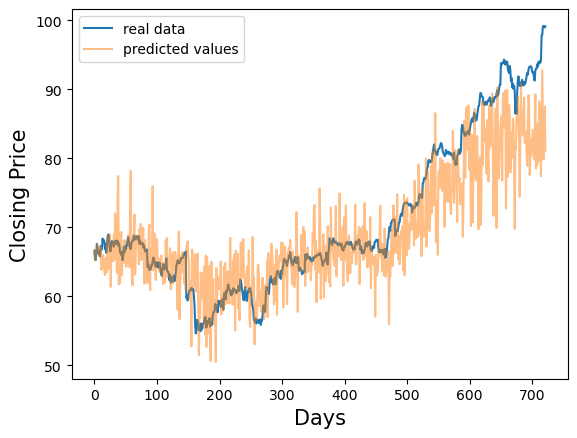

10 680 tensor(8.5688) tensor(1.2901)


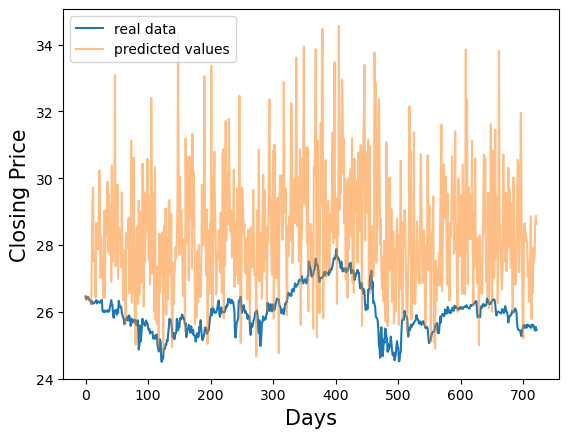

10 680 tensor(8.1364) tensor(0.9917)


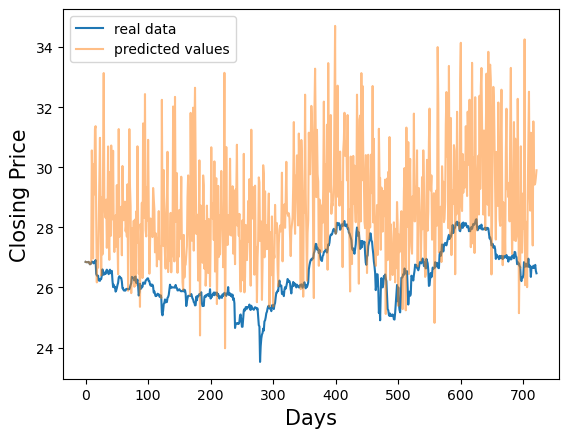

10 680 tensor(8.8750) tensor(0.8633)


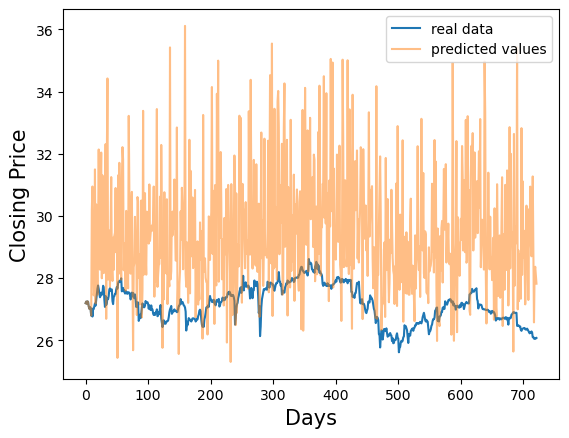

[tensor(2.0228), tensor(0.4500), tensor(1.6682), tensor(1.3883), tensor(0.6914), tensor(1.1029), tensor(0.9235), tensor(1.0734), tensor(2.1896), tensor(1.0480), tensor(0.8216), tensor(1.2371), tensor(0.6283), tensor(0.7372), tensor(0.9425), tensor(0.8946), tensor(0.8135), tensor(1.2901), tensor(0.9917), tensor(0.8633)] 1.088909 [tensor(15.4038), tensor(10.6076), tensor(8.2713), tensor(19.6144), tensor(17.0398), tensor(19.3960), tensor(20.4144), tensor(22.9990), tensor(21.3376), tensor(9.0493), tensor(9.1044), tensor(18.8577), tensor(14.8859), tensor(13.0869), tensor(18.9277), tensor(24.8755), tensor(31.6365), tensor(8.5688), tensor(8.1364), tensor(8.8750)] 16.054398
20 420 tensor(9.8135) tensor(0.8393)


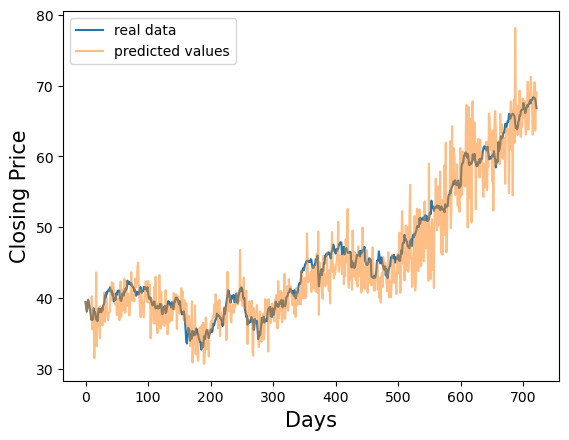

20 420 tensor(4.6901) tensor(1.8679)


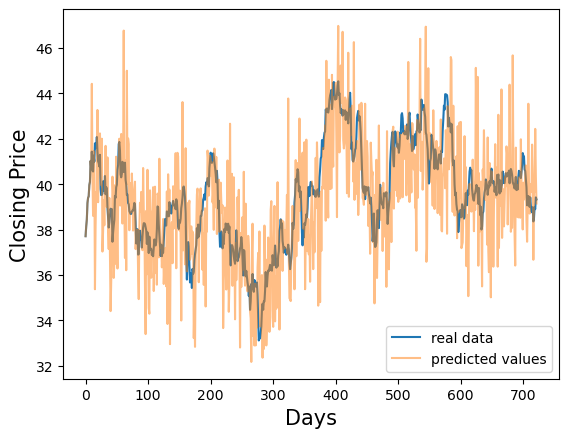

20 420 tensor(5.0039) tensor(1.3830)


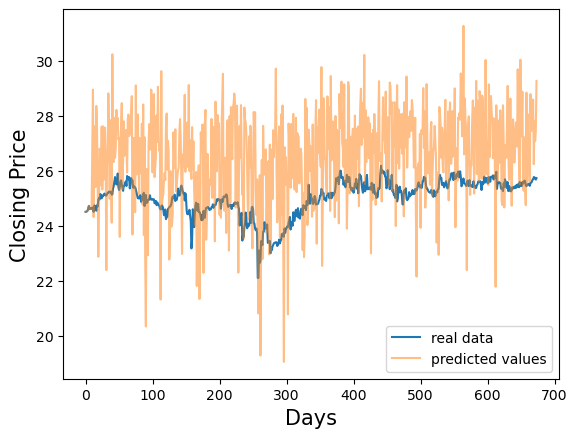

20 420 tensor(8.9702) tensor(1.0444)


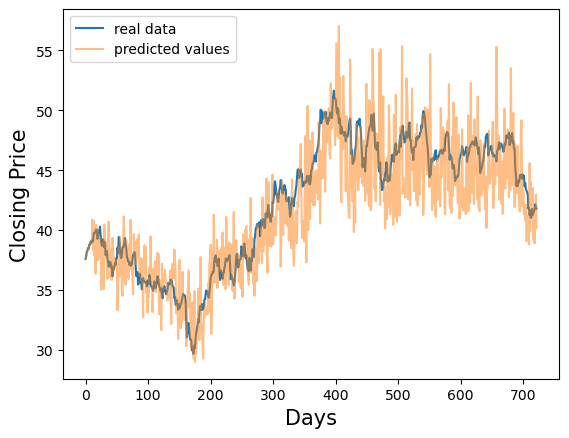

20 420 tensor(7.6879) tensor(0.5196)


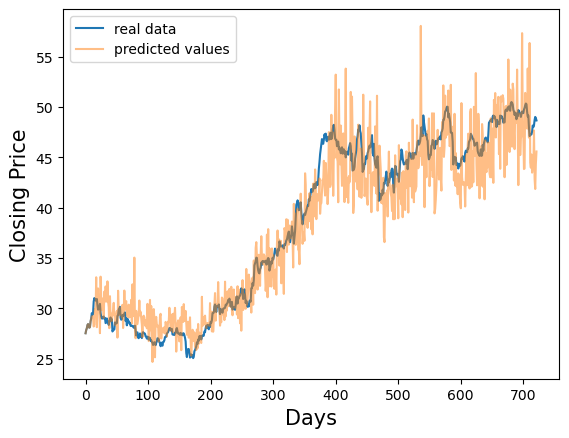

20 420 tensor(11.5656) tensor(1.5044)


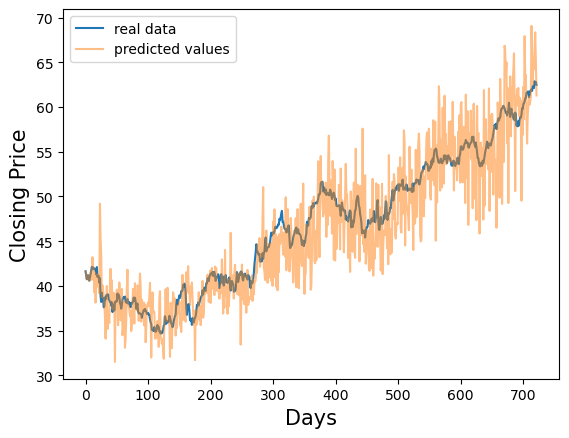

20 420 tensor(15.5470) tensor(0.7412)


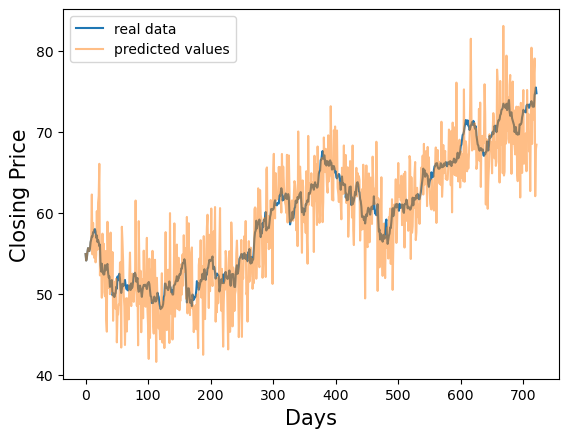

20 420 tensor(18.6438) tensor(0.9540)


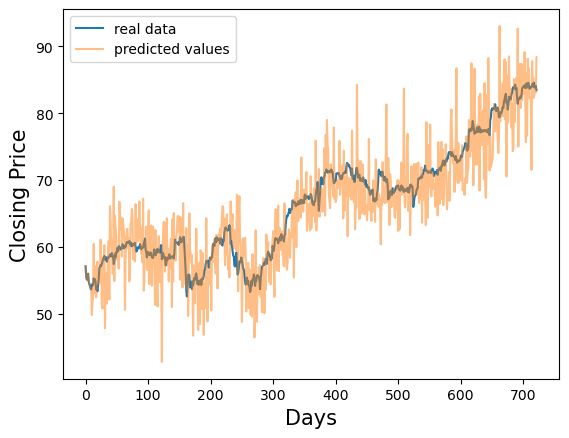

20 420 tensor(14.6997) tensor(0.7821)


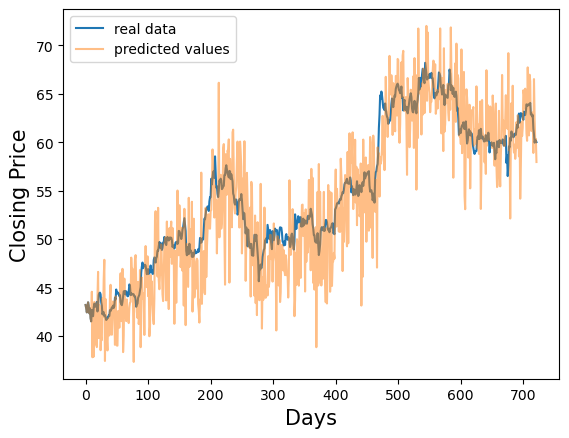

20 420 tensor(3.9420) tensor(1.2835)


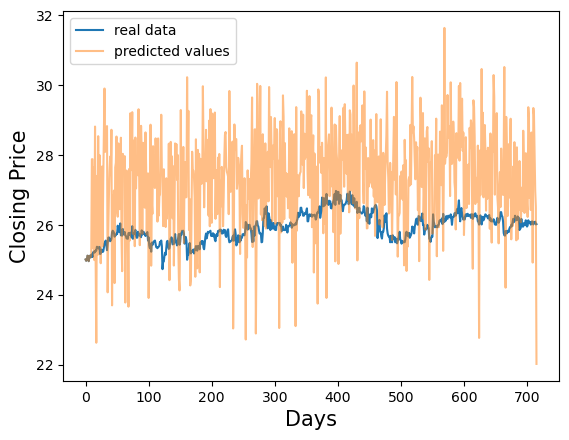

20 420 tensor(4.0776) tensor(0.9492)


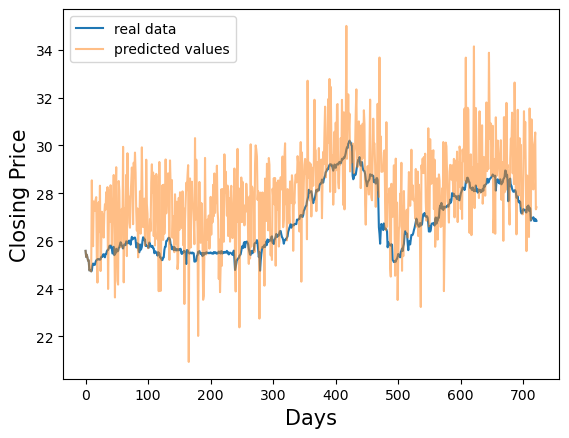

20 420 tensor(17.4808) tensor(1.5446)


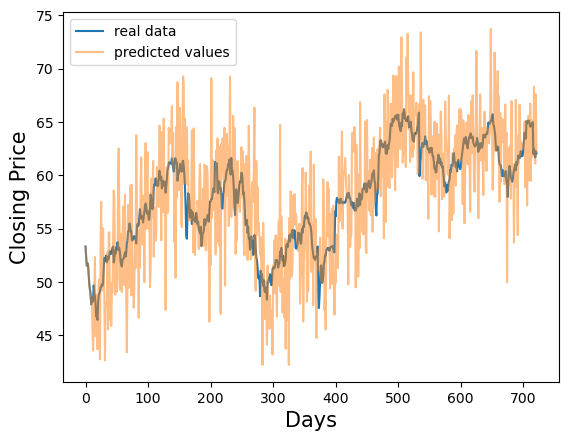

20 420 tensor(9.9791) tensor(1.2828)


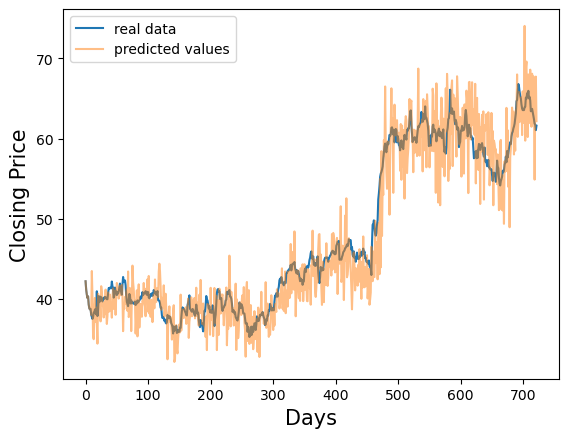

20 420 tensor(6.6021) tensor(1.2379)


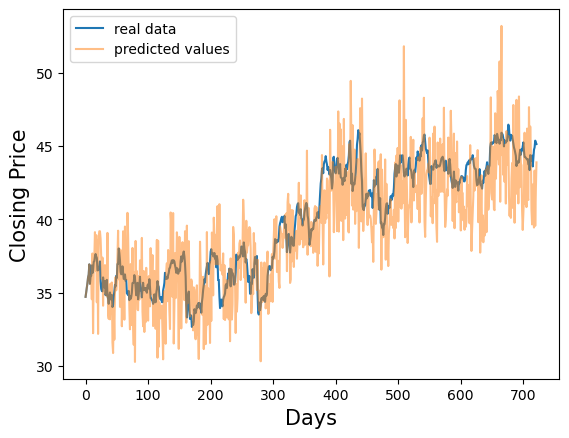

20 420 tensor(11.6514) tensor(1.4008)


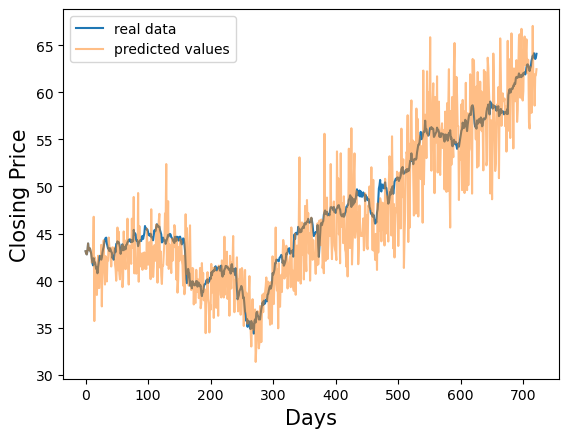

20 420 tensor(18.0402) tensor(1.5046)


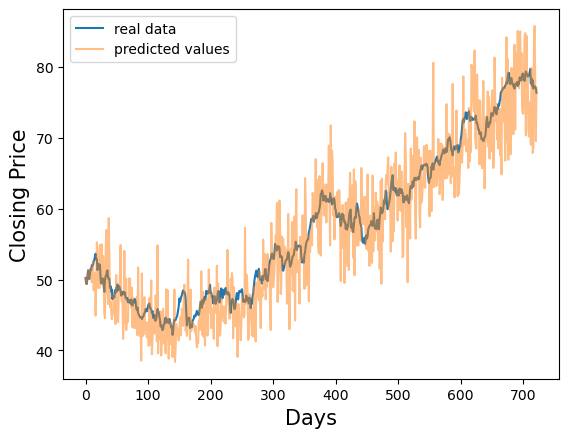

20 420 tensor(19.4832) tensor(0.7256)


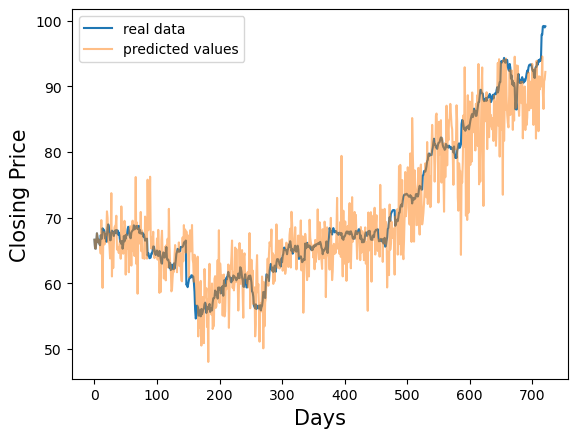

20 420 tensor(4.3124) tensor(1.1179)


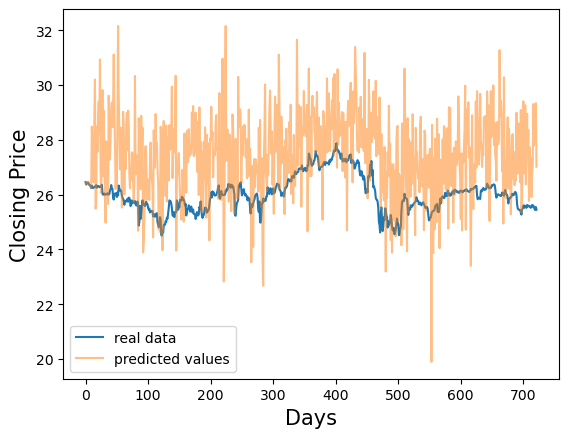

20 420 tensor(4.0887) tensor(0.9255)


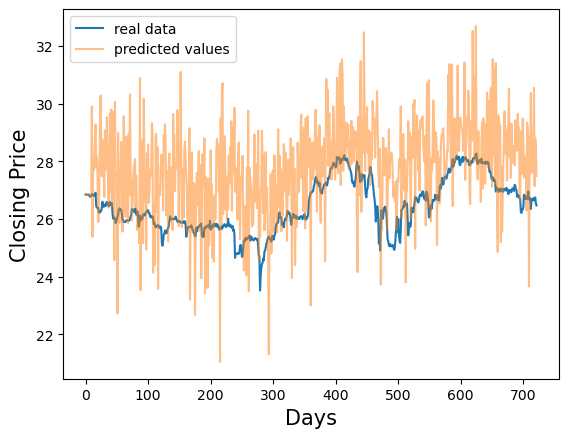

20 420 tensor(3.1829) tensor(1.0634)


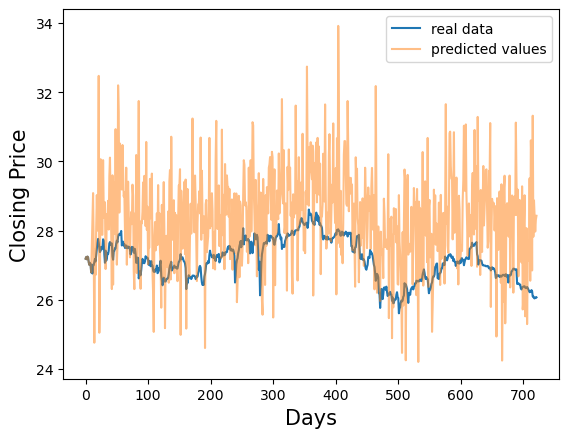

[tensor(0.8393), tensor(1.8679), tensor(1.3830), tensor(1.0444), tensor(0.5196), tensor(1.5044), tensor(0.7412), tensor(0.9540), tensor(0.7821), tensor(1.2835), tensor(0.9492), tensor(1.5446), tensor(1.2828), tensor(1.2379), tensor(1.4008), tensor(1.5046), tensor(0.7256), tensor(1.1179), tensor(0.9255), tensor(1.0634)] 1.133592 [tensor(9.8135), tensor(4.6901), tensor(5.0039), tensor(8.9702), tensor(7.6879), tensor(11.5656), tensor(15.5470), tensor(18.6438), tensor(14.6997), tensor(3.9420), tensor(4.0776), tensor(17.4808), tensor(9.9791), tensor(6.6021), tensor(11.6514), tensor(18.0402), tensor(19.4832), tensor(4.3124), tensor(4.0887), tensor(3.1829)] 9.9731045


In [118]:
#spline moving average test for 20 stocks
spline_best_checkpoints = {5:370,10:680,20:420}
for key in spline_best_checkpoints.keys():
    with torch.no_grad():
        model.eval()
        checkpoint = spline_best_checkpoints[key]
        prods = []
        mses = []
        for s in range(len(test_datas)):
            test_data = test_datas[s]
            state_dict = torch.load(os.path.join(current_path, "20-4-24", "old", "splineCheckpoints", "spline" + str(key), 'checkpoint' + str(checkpoint) + '.pth'))
            model.load_state_dict(state_dict)
            exp = [test_data[0][0][0]]
            inpt = [x for x in test_data[0][0]]
            out = [x for x in test_data[0][0]]
            for i in range(len(test_data)):
                num_datapoints = key
                num_knots = max(0, math.floor(len(inpt)/num_datapoints-1))
                time = np.arange(len(inpt))

                knot_indices = np.linspace(num_datapoints, len(time) - 1-num_datapoints, num_knots).astype(int)
                knots = time[knot_indices]

                cs = LSQUnivariateSpline(time, inpt, k=3, t=knots)
                spline_smooth_prices = cs(time)

                x = torch.tensor(spline_smooth_prices[-10:])
                y = test_data[i][1]
                x = x.unsqueeze(0)
                trg = x[:, 1:]
                optimizer.zero_grad()
                output = model(x, trg)
                out.append(output)
                inpt.append(test_data[i][1])
                exp.append(key*inpt[-1]+(1-key)*exp[-1])

            total_loss = 0.0
            for i in range(len(inpt)-10):
                total_loss += (inpt[i+10]-out[i+10])**2
            mse = total_loss/(len(inpt)-10)

            prod1 = 1
            for i in range(1, len(inpt)):
                sign = 1
                if out[i]-out[i-1] < 0:
                    sign = -1
                prod1 *= (1+(inpt[i] -inpt[i-1])/inpt[i-1]*sign)
            score = prod1

            prods.append(prod1)
            mses.append(mse)

            print(key, checkpoint, mse, score)


            plt.plot(inpt, label='real data')
            plt.plot(out, alpha=0.5, label='predicted values')
            plt.xlabel('Days', fontsize=15)
            plt.ylabel('Closing Price', fontsize=15)
            plt.legend()
            plt.show()
    print(prods, np.mean(prods), mses, np.mean(mses))

In [34]:
def bias_calc(lst):
    bias = 0
    count = 0
    for j in range(1, len(lst)):
        if (all_train_prices[j]-lst[j])*(all_train_prices[j-1]-lst[j-1]) > 0:
            count+=1
            bias+=count**2
        else:
            count = 0
    return bias

In [39]:
def adjmov(data, length):  
    smoothed_data = data[:length-1]
    for i in range(length, len(data)):
        smoothed_data.append(np.mean(data[i-key:i]))
    max1 = max([abs(smoothed_data[i] - smoothed_data[i-1])/smoothed_data[i-1] for i in range(min(int(length*1.5), len(smoothed_data)), len(smoothed_data))])
    bias1 = {}
    alphas = [0.001*i for i in range(21)]
    for alpha in alphas:
        if alpha > max1:
            continue
        bias = [bias_calc(smoothed_data), bias_calc(smoothed_data)]
        Beta = 0
        sign = 1
        for step in [0.1, 0.01, 0.001]:
            while bias[1] <= bias[0]:
                Beta += sign*step
                adjmov_data = smoothed_data[:min(int(length*1.5), len(smoothed_data))]
                for i in range(min(int(length*1.5), len(smoothed_data)), len(smoothed_data)):
                    if abs(smoothed_data[i] - smoothed_data[i-1])/smoothed_data[i-1] > alpha:
                        adjmov_data.append(smoothed_data[i] + Beta*(smoothed_data[i] - smoothed_data[i-1]))
                    else:
                        adjmov_data.append(smoothed_data[i])
                bias[0] = bias[1]
                bias[1] = bias_calc(adjmov_data)
            bias[0] = bias[1]
            sign*=-1
        if alpha not in bias1.keys():
            bias1[alpha] = [Beta-0.001, bias[0]]
        elif bias[0] < bias1[alpha][1]:
            bias1[alpha] = [Beta-0.001, bias[0]]
    
    best_bias = bias1[0.001][1]
    best_alpha = 0.001
    best_beta = 0
    for alpha in bias1.keys():
        if bias1[alpha][1] < best_bias:
            best_alpha = alpha
            best_beta = bias1[alpha][0]
    
    adjmov_data = smoothed_data[:min(int(length*1.5), len(smoothed_data))]
    for i in range(min(int(length*1.5), len(smoothed_data)), len(smoothed_data)):
        if abs(smoothed_data[i] - smoothed_data[i-1])/smoothed_data[i-1] > best_alpha:
            adjmov_data.append(smoothed_data[i] + best_beta*(smoothed_data[i] - smoothed_data[i-1]))
        else:
            adjmov_data.append(smoothed_data[i])
    
    return adjmov_data

In [40]:
#adjusted moving average test for 20 stocks
spline_best_checkpoints = {5:370, 10:250, 20:420}
for key in spline_best_checkpoints.keys():
    with torch.no_grad():
        model.eval()
        prods = []
        mses = []
        for s in range(len(test_datas)):
            test_data = test_datas[s]
            state_dict = torch.load(os.path.join(current_path, "20-4-24", "old", "splineCheckpoints", "spline" + str(key), 'checkpoint' + str(checkpoint) + '.pth'))
            model.load_state_dict(state_dict)
            inpt = [x for x in test_data[0][0]]
            out = [x for x in test_data[0][0]]
            for i in range(len(test_data)):
                adjmov_smooth_prices = adjmov(inpt, key)
                x = torch.tensor(adjmov_smooth_prices[-10:])
                y = test_data[i][1]
                x = x.unsqueeze(0)
                trg = x[:, 1:]
                optimizer.zero_grad()
                output = model(x, trg)
                out.append(output)
                inpt.append(test_data[i][1])

            total_loss = 0.0
            for i in range(len(inpt)-10):
                total_loss += (inpt[i+10]-out[i+10])**2
            mse = total_loss/(len(inpt)-10)

            prod1 = 1
            for i in range(1, len(inpt)):
                sign = 1
                if out[i]-out[i-1] < 0:
                    sign = -1
                prod1 *= (1+(inpt[i] -inpt[i-1])/inpt[i-1]*sign)
            score = prod1

            prods.append(prod1)
            mses.append(mse)

            print(key, checkpoint, mse, score)


            plt.plot(inpt, label='real data')
            plt.plot(out, alpha=0.5, label='predicted values')
            plt.xlabel('Days', fontsize=15)
            plt.ylabel('Closing Price', fontsize=15)
            plt.legend()
            plt.show()
    print(prods, np.mean(prods), mses, np.mean(mses))

KeyboardInterrupt: 

0.1 700 9.020165158509688 2.748784667778936


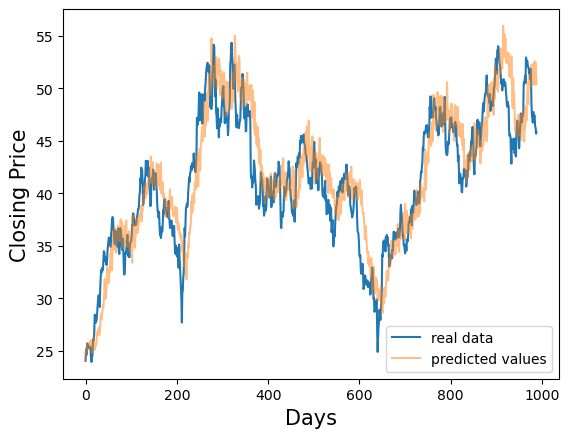

[2.748784667778936] 2.748784667778936 [9.020165158509688] 9.020165158509688


In [164]:
#exp bagging test
best_checkpoints = {0.1:[540, 650, 490, 550, 500, 640, 380, 590, 520, 700]}
for key in [0.1]:#exp_best_checkpoints.keys():
    with torch.no_grad():
        model.eval()
        checkpoint = best_checkpoints[key]
        prods = []
        mses = []
        for s in range(1):#len(test_datas)):
            inpts = []
            outs = []
            for checkpoint in best_checkpoints[key]:
                #test_data = test_datas[s]
                state_dict = torch.load(os.path.join(current_path, "20-4-24", "old", "expCheckpoints", "exp" + str(int(key*20)), 'checkpoint' + str(checkpoint) + '.pth'))
                model.load_state_dict(state_dict)
                exp = [test_data[0][0][0]]
                inpt = [x for x in test_data[0][0]]
                out = [x for x in test_data[0][0]]
                for i in range(1, len(test_data[0][0])):
                    exp.append(key*inpt[i]+(1-key)*exp[i-1])
                for i in range(len(test_data)):
                    x = torch.tensor(exp[-10:])
                    y = test_data[i][1]
                    x = x.unsqueeze(0)
                    trg = x[:, 1:]
                    optimizer.zero_grad()
                    output = model(x, trg)
                    out.append(output)
                    inpt.append(test_data[i][1])
                    exp.append(key*inpt[-1]+(1-key)*exp[-1])
                inpts.append(inpt)
                outs.append(out)
            
            inpt = [np.mean([inp[i] for inp in inpts]) for i in range(len(inpts[0]))]
            out = [np.mean([o[i] for o in outs]) for i in range(len(outs[0]))]

            total_loss = 0.0
            for i in range(len(inpt)-10):
                total_loss += (inpt[i+10]-out[i+10])**2
            mse = total_loss/(len(inpt)-10)

            prod1 = 1
            for i in range(1, len(inpt)):
                sign = 1
                if out[i]-out[i-1] < 0:
                    sign = -1
                prod1 *= (1+(inpt[i] -inpt[i-1])/inpt[i-1]*sign)
            score = prod1

            prods.append(prod1)
            mses.append(mse)

            print(key, checkpoint, mse, score)


            plt.plot(inpt, label='real data')
            plt.plot(out, alpha=0.5, label='predicted values')
            plt.xlabel('Days', fontsize=15)
            plt.ylabel('Closing Price', fontsize=15)
            plt.legend()
            plt.show()
    print(prods, np.mean(prods), mses, np.mean(mses))

20 650 2.6867863475606275 0.0007880939401771987


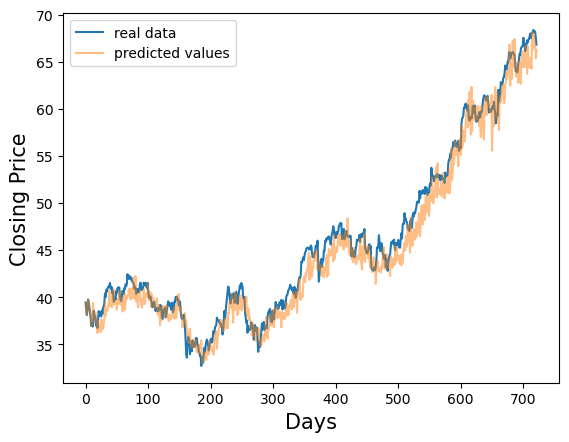

KeyboardInterrupt: 

In [166]:
#spline bagging test
spline_best_checkpoints = {20:[1080, 990, 670, 980, 970, 620, 800, 600, 1060, 650]}
for key in spline_best_checkpoints.keys():
    with torch.no_grad():
        model.eval()
        checkpoint = spline_best_checkpoints[key]
        prods = []
        mses = []
        for s in range(len(test_datas)):
            inpts = []
            outs = []
            for checkpoint in spline_best_checkpoints[key]:
                test_data = test_datas[s]
                state_dict = torch.load(os.path.join(current_path, "20-4-24", "old", "splineCheckpoints", "spline" + str(key), 'checkpoint' + str(checkpoint) + '.pth'))
                model.load_state_dict(state_dict)
                exp = [test_data[0][0][0]]
                inpt = [x for x in test_data[0][0]]
                out = [x for x in test_data[0][0]]
                for i in range(len(test_data)):
                    num_datapoints = key
                    num_knots = max(0, math.floor(len(inpt)/num_datapoints-1))
                    time = np.arange(len(inpt))

                    knot_indices = np.linspace(num_datapoints, len(time) - 1-num_datapoints, num_knots).astype(int)
                    knots = time[knot_indices]

                    cs = LSQUnivariateSpline(time, inpt, k=3, t=knots)
                    spline_smooth_prices = cs(time)

                    x = torch.tensor(spline_smooth_prices[-10:])
                    y = test_data[i][1]
                    x = x.unsqueeze(0)
                    trg = x[:, 1:]
                    optimizer.zero_grad()
                    output = model(x, trg)
                    out.append(output)
                    inpt.append(test_data[i][1])
                    exp.append(key*inpt[-1]+(1-key)*exp[-1])
                inpts.append(inpt)
                outs.append(out)
            
            inpt = [np.mean([inp[i] for inp in inpts]) for i in range(len(inpts[0]))]
            out = [np.mean([o[i] for o in outs]) for i in range(len(outs[0]))]
            
            total_loss = 0.0
            for i in range(len(inpt)-10):
                total_loss += (inpt[i+10]-out[i+10])**2
            mse = total_loss/(len(inpt)-10)

            prod1 = 1
            for i in range(1, len(inpt)):
                sign = 1
                if out[i]-out[i-1] < 0:
                    sign = -1
                prod1 *= (1 + (inpt[i] -inpt[i-1])/inpt[i-1]*sign)
            score = prod1

            prods.append(prod1)
            mses.append(mse)

            print(key, checkpoint, mse, score)


            plt.plot(inpt, label='real data')
            plt.plot(out, alpha=0.5, label='predicted values')
            plt.xlabel('Days', fontsize=15)
            plt.ylabel('Closing Price', fontsize=15)
            plt.legend()
            plt.show()
    print(prods, np.mean(prods), mses, np.mean(mses))